 # WATER POTABILITY PREDICTION MODEL

The dataset used for this model was gotten from https://www.hydroshare.org/resource/4ab43e1b507b496b9b42749701daed5c/

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [2]:
df = pd.read_excel('Datasets/aquaattributes.xlsx')

In [3]:
df.head(20)

,Stationcode,Locations,Lat,Lon,Capitalcity,State,Temperature,D.O,pH,Conductivity,B.O.D,Nitrate,Fecalcaliform,Totalcaliform,class
0,1001,BEAS AT U/S MANALI,32.244947,77.191080,Shimla,HIMACHAL PRADESH,9.0,9.0,8.0,85,0.10,0.2,106,397.0,yes
1,1002,BEAS AT D/S KULU,31.960582,77.114009,Shimla,HIMACHAL PRADESH,10.0,9.0,8.0,102,0.30,0.4,153,954.0,yes
2,1003,BEAS AT D/S AUT,26.887893,75.811484,Shimla,HIMACHAL PRADESH,11.0,9.0,8.0,96,0.20,0.3,58,653.0,yes
3,1004,BEAS AT U/S PANDON DAM,47.351943,19.633621,Shimla,HIMACHAL PRADESH,13.0,9.0,8.0,94,0.20,0.4,34,317.0,yes
4,1005,BEAS AT EXIT OF TUNNEL DEHAL POWER HOUSE,25.992786,91.826111,Shimla,HIMACHAL PRADESH,14.0,10.0,8.0,112,0.20,0.5,213,1072.0,yes
5,1550,U/S MANDI,31.708165,76.931367,Shimla,HIMACHAL PRADESH,16.0,9.0,8.0,117,0.20,0.5,100,722.0,yes
6,1006,BEAS AT D/S MANDI,31.708165,76.931367,Shimla,HIMACHAL PRADESH,16.0,9.0,8.0,155,0.50,0.7,445,1855.0,yes
7,2604,BEAS AT D/S JAISINGHPUR,31.899643,76.597945,Shimla,HIMACHAL PRADESH,19.0,8.0,8.0,211,0.50,0.5,7,72.0,yes
8,1007,BEAS AT D/S ALAMPUR,15.884349,78.119382,Shimla,HIMACHAL PRADESH,19.0,8.0,8.0,202,0.60,0.4,9,123.0,yes
9,1008,BEAS AT D/S DEHRAGOPIPUR,31.881756,76.214645,Shimla,HIMACHAL PRADESH,19.0,8.0,8.0,280,0.70,1.1,10,157.0,yes


In [4]:
df.shape

(1361, 15)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1361 entries, 0 to 1360
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Stationcode    1361 non-null   int64  
 1   Locations      1361 non-null   object 
 2   Lat            1294 non-null   float64
 3   Lon            1294 non-null   float64
 4   Capitalcity    1361 non-null   object 
 5   State          1360 non-null   object 
 6   Temperature    1327 non-null   float64
 7   D.O            1352 non-null   float64
 8   pH             1360 non-null   float64
 9   Conductivity   1324 non-null   object 
 10  B.O.D          1293 non-null   float64
 11  Nitrate        1152 non-null   object 
 12  Fecalcaliform  1173 non-null   object 
 13  Totalcaliform  1226 non-null   float64
 14  class          1361 non-null   object 
dtypes: float64(7), int64(1), object(7)
memory usage: 159.6+ KB


In [6]:
df.isnull().sum()

Stationcode        0
Locations          0
Lat               67
Lon               67
Capitalcity        0
State              1
Temperature       34
D.O                9
pH                 1
Conductivity      37
B.O.D             68
Nitrate          209
Fecalcaliform    188
Totalcaliform    135
class              0
dtype: int64

In [7]:
df.dropna(inplace=True)

In [8]:
df.shape

(967, 15)

In [9]:
df.isnull().sum()

Stationcode      0
Locations        0
Lat              0
Lon              0
Capitalcity      0
State            0
Temperature      0
D.O              0
pH               0
Conductivity     0
B.O.D            0
Nitrate          0
Fecalcaliform    0
Totalcaliform    0
class            0
dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 967 entries, 0 to 1360
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Stationcode    967 non-null    int64  
 1   Locations      967 non-null    object 
 2   Lat            967 non-null    float64
 3   Lon            967 non-null    float64
 4   Capitalcity    967 non-null    object 
 5   State          967 non-null    object 
 6   Temperature    967 non-null    float64
 7   D.O            967 non-null    float64
 8   pH             967 non-null    float64
 9   Conductivity   967 non-null    object 
 10  B.O.D          967 non-null    float64
 11  Nitrate        967 non-null    object 
 12  Fecalcaliform  967 non-null    object 
 13  Totalcaliform  967 non-null    float64
 14  class          967 non-null    object 
dtypes: float64(7), int64(1), object(7)
memory usage: 120.9+ KB


In [11]:
cndt = df['Conductivity']

In [12]:
[x for x in cndt.apply(type).unique()]

[int, float]

In [13]:
df['Conductivity'] = df['Conductivity'].astype(float)

In [14]:
nitr = df['Nitrate']

In [15]:
[x for x in nitr.apply(type).unique()]

[float, int]

In [16]:
df['Nitrate'] = df['Nitrate'].astype(float)

In [17]:
fclf = df['Fecalcaliform']

In [18]:
[x for x in fclf.apply(type).unique()]

[int, float]

In [19]:
df['Fecalcaliform'] = df['Fecalcaliform'].astype(float)

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 967 entries, 0 to 1360
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Stationcode    967 non-null    int64  
 1   Locations      967 non-null    object 
 2   Lat            967 non-null    float64
 3   Lon            967 non-null    float64
 4   Capitalcity    967 non-null    object 
 5   State          967 non-null    object 
 6   Temperature    967 non-null    float64
 7   D.O            967 non-null    float64
 8   pH             967 non-null    float64
 9   Conductivity   967 non-null    float64
 10  B.O.D          967 non-null    float64
 11  Nitrate        967 non-null    float64
 12  Fecalcaliform  967 non-null    float64
 13  Totalcaliform  967 non-null    float64
 14  class          967 non-null    object 
dtypes: float64(10), int64(1), object(4)
memory usage: 120.9+ KB


In [21]:
df.describe()

,Stationcode,Lat,Lon,Temperature,D.O,pH,Conductivity,B.O.D,Nitrate,Fecalcaliform,Totalcaliform
count,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,967.000000,9.670000e+02,9.670000e+02
mean,1899.374354,20.970569,78.364700,25.355714,6.891423,7.668664,1323.534458,3.738066,5.075913,1.773840e+05,5.361407e+05
std,706.222881,6.459671,6.894196,4.413136,1.674220,0.478087,3703.988886,8.546417,30.069937,3.792506e+06,1.015845e+07
min,4.000000,8.388518,19.633621,5.000000,0.000000,5.200000,25.250000,0.000000,0.000000,1.400000e+00,5.000000e-03
25%,1326.500000,17.000538,74.970558,24.000000,6.200000,7.450000,201.500000,1.021250,0.304167,1.579167e+01,5.000000e+01
50%,1960.000000,21.007658,76.852727,26.458333,7.091667,7.788333,388.000000,2.091667,0.800000,1.441667e+02,4.650000e+02
75%,2515.500000,26.234941,80.964831,27.908333,7.750000,8.000000,754.333333,3.936667,2.000000,8.245833e+02,1.746665e+03
max,3029.000000,47.351943,95.999123,37.500000,30.366667,9.575000,36593.000000,158.750000,640.000000,1.100000e+08,2.500000e+08


In [22]:
df_new = df.loc[:,['Temperature','D.O','pH','Conductivity','B.O.D','Nitrate','Fecalcaliform','Totalcaliform','class']]

In [23]:
df_new['class'] = df_new['class'] == 'yes'

In [24]:
df_new.head()

,Temperature,D.O,pH,Conductivity,B.O.D,Nitrate,Fecalcaliform,Totalcaliform,class
0,9.0,9.0,8.0,85.0,0.1,0.2,106.0,397.0,True
1,10.0,9.0,8.0,102.0,0.3,0.4,153.0,954.0,True
2,11.0,9.0,8.0,96.0,0.2,0.3,58.0,653.0,True
3,13.0,9.0,8.0,94.0,0.2,0.4,34.0,317.0,True
4,14.0,10.0,8.0,112.0,0.2,0.5,213.0,1072.0,True


In [25]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 967 entries, 0 to 1360
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Temperature    967 non-null    float64
 1   D.O            967 non-null    float64
 2   pH             967 non-null    float64
 3   Conductivity   967 non-null    float64
 4   B.O.D          967 non-null    float64
 5   Nitrate        967 non-null    float64
 6   Fecalcaliform  967 non-null    float64
 7   Totalcaliform  967 non-null    float64
 8   class          967 non-null    bool   
dtypes: bool(1), float64(8)
memory usage: 68.9 KB


In [26]:
df_new.corr()

,Temperature,D.O,pH,Conductivity,B.O.D,Nitrate,Fecalcaliform,Totalcaliform,class
Temperature,1.000000,-0.137697,-0.062000,0.132268,0.059620,0.026301,-0.013133,-0.013379,-0.162458
D.O,-0.137697,1.000000,0.194636,-0.092865,-0.280783,0.011558,-0.165299,-0.182276,-0.147469
pH,-0.062000,0.194636,1.000000,-0.008232,-0.004717,-0.147210,0.008265,0.009426,-0.298328
Conductivity,0.132268,-0.092865,-0.008232,1.000000,0.164644,-0.008017,-0.003694,-0.003406,0.069188
B.O.D,0.059620,-0.280783,-0.004717,0.164644,1.000000,0.004074,0.053959,0.063619,0.047831
Nitrate,0.026301,0.011558,-0.147210,-0.008017,0.004074,1.000000,-0.005780,-0.006528,0.005181
Fecalcaliform,-0.013133,-0.165299,0.008265,-0.003694,0.053959,-0.005780,1.000000,0.848463,0.024510
Totalcaliform,-0.013379,-0.182276,0.009426,-0.003406,0.063619,-0.006528,0.848463,1.000000,0.027741
class,-0.162458,-0.147469,-0.298328,0.069188,0.047831,0.005181,0.024510,0.027741,1.000000


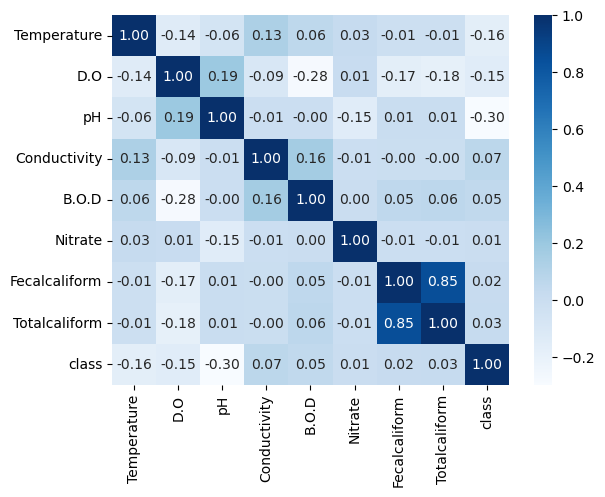

In [28]:
sns.heatmap(df_new.corr(), annot=True, fmt=".2f", cmap="Blues");

In [29]:
X = df.loc[:,['Temperature','D.O','pH','Conductivity','B.O.D','Nitrate','Totalcaliform']]

In [30]:
df_new = df.loc[:,['Temperature','D.O','pH','Conductivity','B.O.D','Nitrate','Fecalcaliform','Totalcaliform','class']]

In [31]:
df_new['class'] = df_new['class'] == 'yes'

In [32]:
df_new.head()

,Temperature,D.O,pH,Conductivity,B.O.D,Nitrate,Fecalcaliform,Totalcaliform,class
0,9.0,9.0,8.0,85.0,0.1,0.2,106.0,397.0,True
1,10.0,9.0,8.0,102.0,0.3,0.4,153.0,954.0,True
2,11.0,9.0,8.0,96.0,0.2,0.3,58.0,653.0,True
3,13.0,9.0,8.0,94.0,0.2,0.4,34.0,317.0,True
4,14.0,10.0,8.0,112.0,0.2,0.5,213.0,1072.0,True


In [33]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 967 entries, 0 to 1360
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Temperature    967 non-null    float64
 1   D.O            967 non-null    float64
 2   pH             967 non-null    float64
 3   Conductivity   967 non-null    float64
 4   B.O.D          967 non-null    float64
 5   Nitrate        967 non-null    float64
 6   Fecalcaliform  967 non-null    float64
 7   Totalcaliform  967 non-null    float64
 8   class          967 non-null    bool   
dtypes: bool(1), float64(8)
memory usage: 68.9 KB


In [34]:
df_new.corr()

,Temperature,D.O,pH,Conductivity,B.O.D,Nitrate,Fecalcaliform,Totalcaliform,class
Temperature,1.000000,-0.137697,-0.062000,0.132268,0.059620,0.026301,-0.013133,-0.013379,-0.162458
D.O,-0.137697,1.000000,0.194636,-0.092865,-0.280783,0.011558,-0.165299,-0.182276,-0.147469
pH,-0.062000,0.194636,1.000000,-0.008232,-0.004717,-0.147210,0.008265,0.009426,-0.298328
Conductivity,0.132268,-0.092865,-0.008232,1.000000,0.164644,-0.008017,-0.003694,-0.003406,0.069188
B.O.D,0.059620,-0.280783,-0.004717,0.164644,1.000000,0.004074,0.053959,0.063619,0.047831
Nitrate,0.026301,0.011558,-0.147210,-0.008017,0.004074,1.000000,-0.005780,-0.006528,0.005181
Fecalcaliform,-0.013133,-0.165299,0.008265,-0.003694,0.053959,-0.005780,1.000000,0.848463,0.024510
Totalcaliform,-0.013379,-0.182276,0.009426,-0.003406,0.063619,-0.006528,0.848463,1.000000,0.027741
class,-0.162458,-0.147469,-0.298328,0.069188,0.047831,0.005181,0.024510,0.027741,1.000000


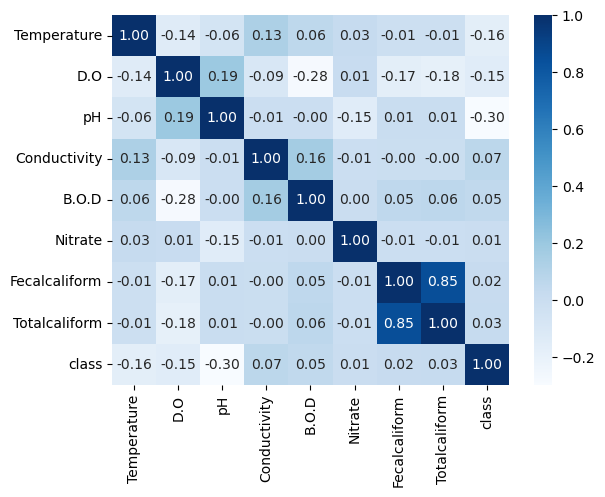

In [36]:
sns.heatmap(df_new.corr(), annot=True, fmt=".2f", cmap="Blues");

In [37]:
X = df.loc[:,['Temperature','Conductivity','B.O.D', 'Nitrate','Totalcaliform']]

In [38]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 967 entries, 0 to 1360
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Temperature    967 non-null    float64
 1   Conductivity   967 non-null    float64
 2   B.O.D          967 non-null    float64
 3   Nitrate        967 non-null    float64
 4   Totalcaliform  967 non-null    float64
dtypes: float64(5)
memory usage: 45.3 KB


In [39]:
X.head()

,Temperature,Conductivity,B.O.D,Nitrate,Totalcaliform
0,9.0,85.0,0.1,0.2,397.0
1,10.0,102.0,0.3,0.4,954.0
2,11.0,96.0,0.2,0.3,653.0
3,13.0,94.0,0.2,0.4,317.0
4,14.0,112.0,0.2,0.5,1072.0


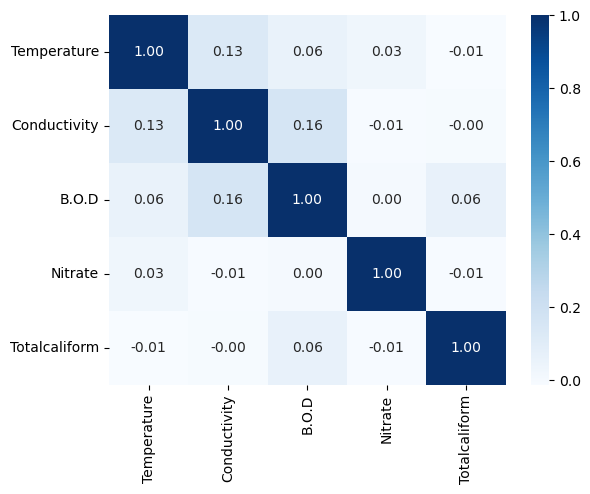

In [41]:
sns.heatmap(X.corr(), annot=True, fmt=".2f", cmap="Blues");

In [42]:
[x for x in df['class'].apply(type).unique()]

[str]

In [43]:
df_new['class'].unique()

array([ True, False])

In [44]:
y = df_new['pH']

In [45]:
y.value_counts()

pH
8.000000    72
7.600000    24
7.500000    22
7.800000    22
7.700000    22
            ..
7.872000     1
7.680000     1
7.637500     1
7.545000     1
7.453636     1
Name: count, Length: 577, dtype: int64

In [46]:
from sklearn.model_selection import train_test_split

In [48]:
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size = 0.7, random_state = 123)

In [49]:
X_train.shape

(676, 5)

In [50]:
y_train.shape

(676,)

In [51]:
X_val.shape

(291, 5)

In [52]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import accuracy_score, f1_score, mean_squared_error as MSE

In [53]:
min_samples_split_list = [2,10, 30, 50, 100, 200, 300, 700, 1000, 1200, 1500]

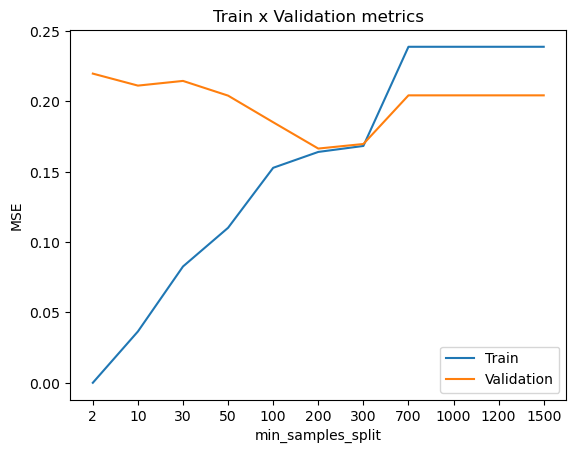

In [54]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [61]:
min_samples_split_list = np.arange(100,300,5)

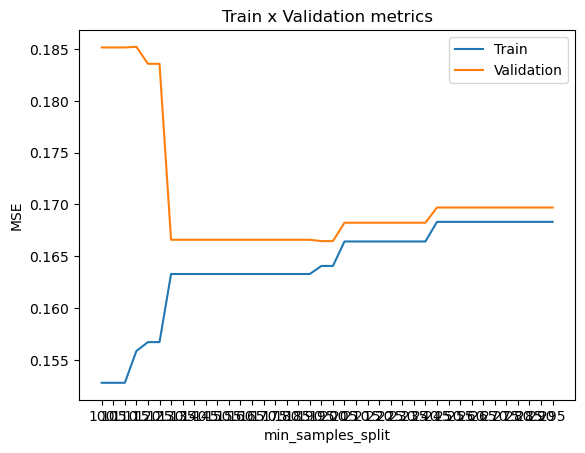

In [62]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [65]:
best_arg = np.argmin(MSE_list_val)
min_samples_split_list[best_arg]

195

In [66]:
min_samples_split_list = np.arange(180,230)

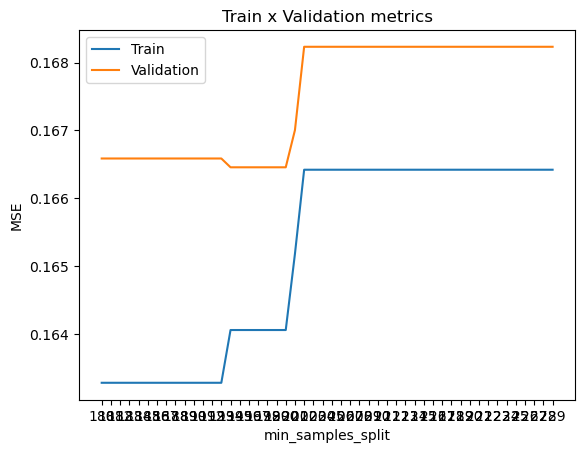

In [67]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [68]:
ind_min_samples_split = np.argmin(MSE_list_val)
ind_min_samples_split

14

In [69]:
best_min_samples_split = min_samples_split_list[ind_min_samples_split]
best_min_samples_split

194

In [70]:
max_depth_list = [1,2, 3, 4, 8, 16, 32, 64, None]

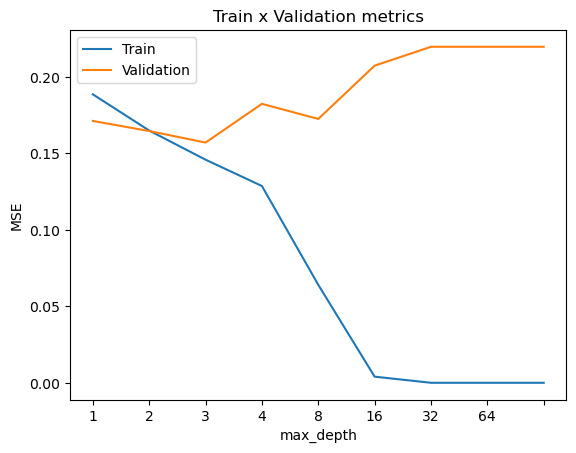

In [71]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = DecisionTreeRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [72]:
# max_depth_list = np.arange(2,17)

In [73]:
# MSE_list_train = []
# MSE_list_val = []
# for max_depth in max_depth_list:
#     model = DecisionTreeRegressor(max_depth = max_depth,
#                                    random_state = 123).fit(X_train,y_train) 
#     predictions_train = model.predict(X_train)
#     predictions_val = model.predict(X_val)
#     MSE_train = MSE(predictions_train,y_train)
#     MSE_val = MSE(predictions_val,y_val)
#     MSE_list_train.append(MSE_train)
#     MSE_list_val.append(MSE_val)

# plt.title('Train x Validation metrics')
# plt.xlabel('max_depth')
# plt.ylabel('MSE')
# plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
# plt.plot(MSE_list_train)
# plt.plot(MSE_list_val)
# plt.legend(['Train','Validation']);

In [74]:
ind_max_depth = np.argmin(MSE_list_val)
ind_max_depth

2

In [75]:
best_max_depth = max_depth_list[ind_max_depth]
best_max_depth

3

    Chosen max_depth = 3
    Chosen min_samples_split = 194

In [76]:
decision_tree_pH_model = DecisionTreeRegressor(min_samples_split = 194,
                                             max_depth = 3,
                                             random_state = 123).fit(X_train,y_train)

In [77]:
print(f"MSE for train:\n\tMSE: {MSE(decision_tree_pH_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(decision_tree_pH_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 0.1747
MSE for validation:
	MSE: 0.1714


In [78]:
for feature, importance in tuple(zip(decision_tree_pH_model.feature_names_in_,
                                     decision_tree_pH_model.feature_importances_)):
    print(f"{feature}: {importance:.4f}")

Temperature: 0.0000
Conductivity: 0.7831
B.O.D: 0.0471
Nitrate: 0.0000
Totalcaliform: 0.1697


In [79]:
y_pred_pH = decision_tree_pH_model.predict(X_val)

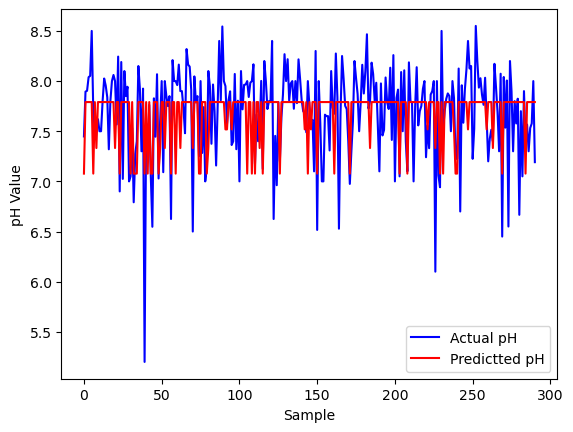

In [80]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(y_pred_pH)),y_pred_pH,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

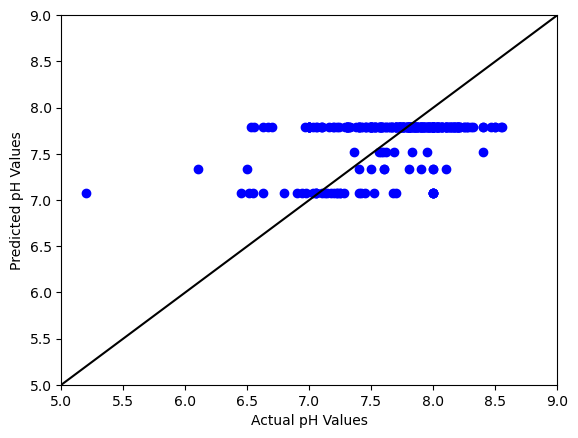

In [81]:
plt.scatter(y_val, y_pred_pH, c='b')
plt.plot([5,9], [5,9], 'k')
plt.xlim([5, 9])
plt.ylim([5, 9])
plt.xlabel('Actual pH Values')
plt.ylabel('Predicted pH Values');

In [82]:
diff_pH = y_pred_pH - y_val

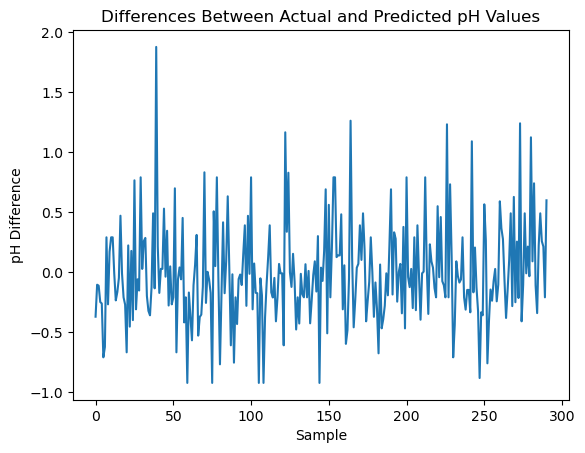

In [83]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [84]:
decision_tree_pH_model.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 194,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 123,
 'splitter': 'best'}

In [85]:
from sklearn.preprocessing import PolynomialFeatures

In [86]:
degree_list = np.arange(1,5)

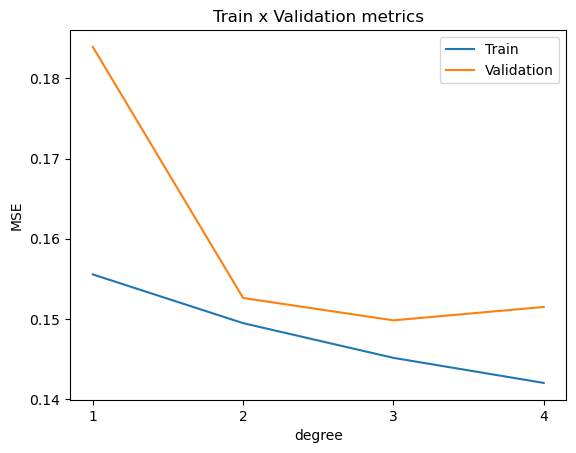

In [87]:
MSE_list_train = []
MSE_list_val = []
for degree in degree_list:
    transformer = PolynomialFeatures(degree).fit(X_train)
    X_poly = transformer.transform(X_train)
    X_poly = X_poly[:,1:]
    model = DecisionTreeRegressor(min_samples_split = 98,
                                  max_depth = 8,
                                  random_state = 123).fit(X_poly,y_train) 
    predictions_train = model.predict(X_poly)
    X_val_poly = transformer.transform(X_val)
    X_val_poly = X_val_poly[:,1:]
    predictions_val = model.predict(X_val_poly)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('degree')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(degree_list )),labels=degree_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [88]:
MSE_list_val

[0.18392252604594922,
 0.15260259496869036,
 0.14981391130952457,
 0.15148255620932685]

In [89]:
from sklearn.ensemble import RandomForestRegressor

In [90]:
min_samples_split_list = [2,10, 30, 50, 100, 200, 300, 700, 1000, 1200, 1500, 2000]

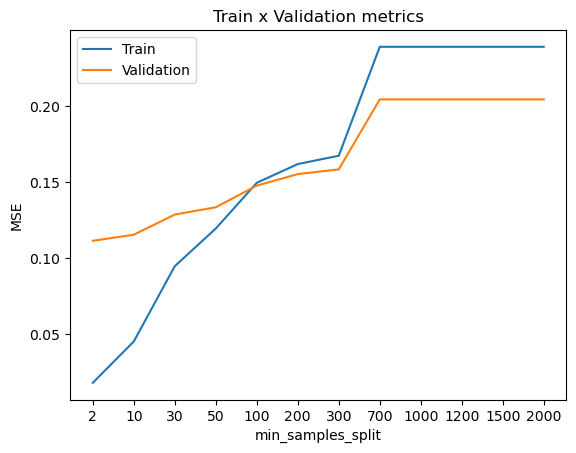

In [91]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = RandomForestRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list) 
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [92]:
min_samples_split_list = np.arange(2,11)

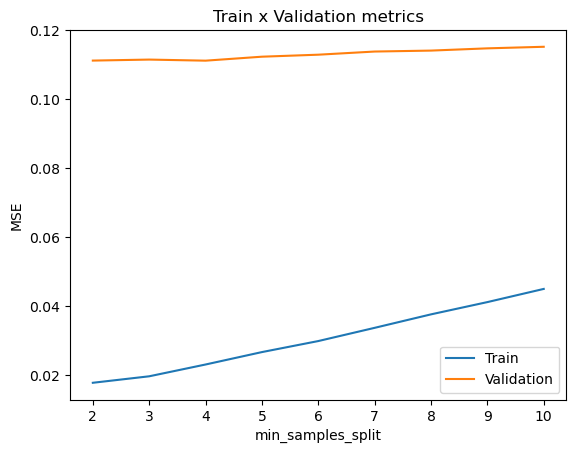

In [93]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = RandomForestRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list) 
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [94]:
max_depth_list = [2, 4, 8, 16, 32, 64, None]

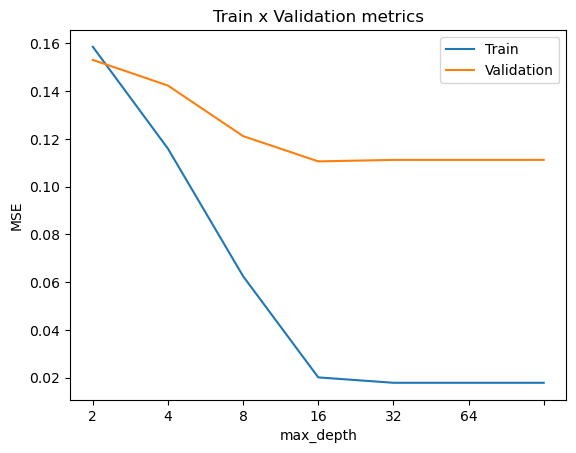

In [95]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = RandomForestRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [96]:
max_depth_list = np.arange(8,64)

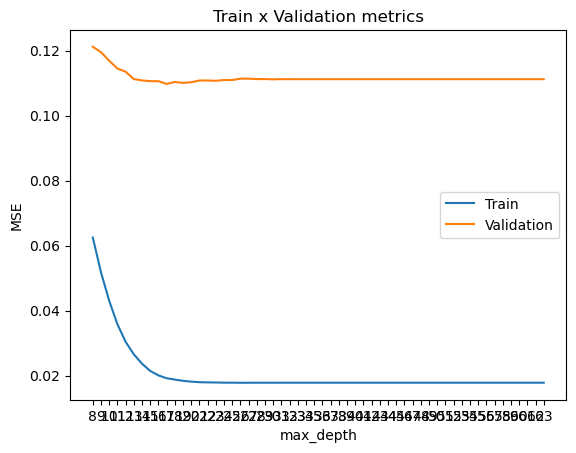

In [97]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = RandomForestRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list)),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [98]:
ind_max_depth = np.argmin(MSE_list_val)
ind_max_depth

9

In [99]:
best_max_depth = max_depth_list[ind_max_depth]
best_max_depth

17

In [100]:
n_estimators_list = [10,50,100,500,1000,2000]

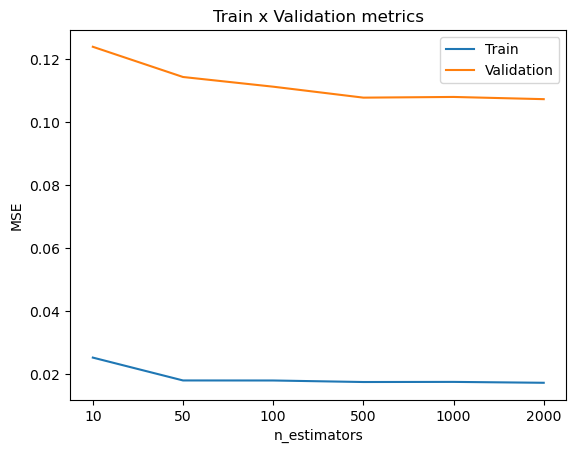

In [101]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [102]:
n_estimators_list = np.arange(100,1000,50)

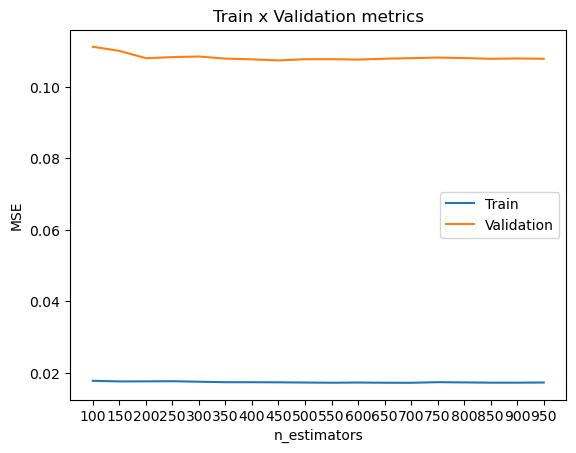

In [103]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [104]:
MSE_list_val

[0.1111973945107774,
 0.11005380073822381,
 0.10801333970737445,
 0.10830972971047172,
 0.10847828144466,
 0.10789024559783954,
 0.10768765157133983,
 0.10739137685258712,
 0.10771632781349472,
 0.10773399001799798,
 0.10762299071533814,
 0.10786060603097017,
 0.10801922897056546,
 0.10817836310551521,
 0.10805163062950802,
 0.10783540404492627,
 0.10792736279398098,
 0.10784818959614238]

In [105]:
ind_n_estimators = np.argmin(MSE_list_val)
ind_n_estimators

7

In [106]:
best_n_estimators = n_estimators_list[ind_n_estimators]
best_n_estimators

450

    Chosen max_depth = 17
    Chosen n_estimators = 450
    Chosen min_samples_split = 2

In [107]:
random_forest_pH_model = RandomForestRegressor(n_estimators = 450,
                                               max_depth = 17,
                                               min_samples_split = 2,
                                               random_state = 123).fit(X_train,y_train)

In [108]:
for feature, importance in tuple(zip(random_forest_pH_model.feature_names_in_,
                                     random_forest_pH_model.feature_importances_)):
    print(f"{feature}: {importance:.4f}")

Temperature: 0.1398
Conductivity: 0.3810
B.O.D: 0.1663
Nitrate: 0.1393
Totalcaliform: 0.1735


In [109]:
print(f"MSE for train:\n\tMSE: {MSE(random_forest_pH_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(random_forest_pH_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 0.0186
MSE for validation:
	MSE: 0.1071


In [110]:
y_pred_pH = random_forest_pH_model.predict(X_val)

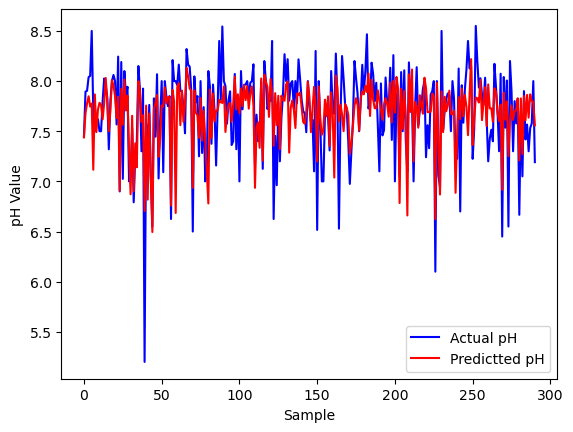

In [111]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(y_pred_pH)),y_pred_pH,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

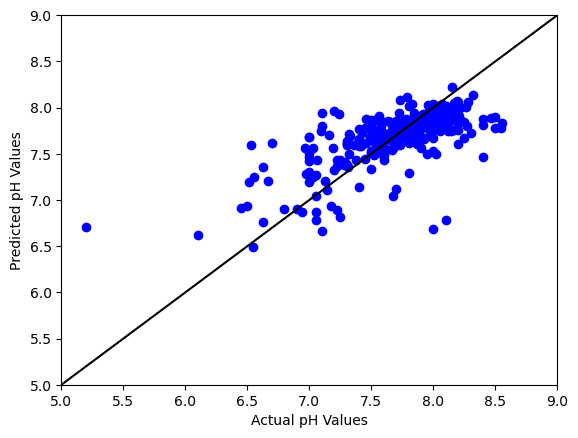

In [112]:
plt.scatter(y_val, y_pred_pH, c='b')
plt.plot([5,9], [5,9], 'k')
plt.xlim([5, 9])
plt.ylim([5, 9])
plt.xlabel('Actual pH Values')
plt.ylabel('Predicted pH Values');

In [113]:
diff_pH = y_pred_pH - y_val

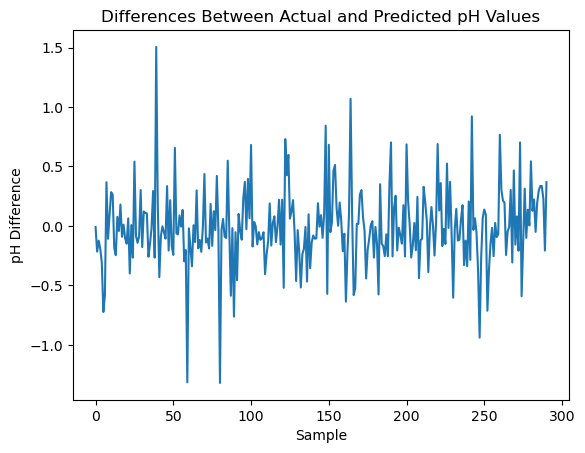

In [114]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [115]:
from xgboost import XGBRegressor

In [116]:
X_train, X_val, y_train, y_val = train_test_split(X.values, y.values, train_size = 0.7, random_state = 123)

In [117]:
n = int(len(X_train)*0.8) ## Using 80% to train and 20% to eval

In [118]:
X_train_fit, X_train_eval, y_train_fit, y_train_eval = X_train[:n], X_train[n:], y_train[:n], y_train[n:]

In [119]:
n_estimators_list = [10,50,100,500,1000,2000]

In [120]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = XGBRegressor(n_estimators = n_estimators, verbosity = 0,random_state = 123)
    model.fit(X_train_fit,y_train_fit, eval_set = [(X_train_eval,y_train_eval)]) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

[0]	validation_0-rmse:4.97677
[1]	validation_0-rmse:3.48576
[2]	validation_0-rmse:2.44865
[3]	validation_0-rmse:1.72590
[4]	validation_0-rmse:1.23663
[5]	validation_0-rmse:0.90159
[6]	validation_0-rmse:0.69215
[7]	validation_0-rmse:0.55736
[8]	validation_0-rmse:0.48265
[9]	validation_0-rmse:0.44371
[0]	validation_0-rmse:4.97677
[1]	validation_0-rmse:3.48576
[2]	validation_0-rmse:2.44865
[3]	validation_0-rmse:1.72590
[4]	validation_0-rmse:1.23663
[5]	validation_0-rmse:0.90159
[6]	validation_0-rmse:0.69215
[7]	validation_0-rmse:0.55736
[8]	validation_0-rmse:0.48265
[9]	validation_0-rmse:0.44371
[10]	validation_0-rmse:0.41796
[11]	validation_0-rmse:0.40780
[12]	validation_0-rmse:0.40811
[13]	validation_0-rmse:0.40726
[14]	validation_0-rmse:0.40541
[15]	validation_0-rmse:0.40590
[16]	validation_0-rmse:0.40721
[17]	validation_0-rmse:0.40687
[18]	validation_0-rmse:0.40525
[19]	validation_0-rmse:0.40876
[20]	validation_0-rmse:0.40986
[21]	validation_0-rmse:0.40921
[22]	validation_0-rmse:0.413

[105]	validation_0-rmse:0.41455
[106]	validation_0-rmse:0.41454
[107]	validation_0-rmse:0.41453
[108]	validation_0-rmse:0.41443
[109]	validation_0-rmse:0.41444
[110]	validation_0-rmse:0.41447
[111]	validation_0-rmse:0.41451
[112]	validation_0-rmse:0.41425
[113]	validation_0-rmse:0.41433
[114]	validation_0-rmse:0.41433
[115]	validation_0-rmse:0.41424
[116]	validation_0-rmse:0.41427
[117]	validation_0-rmse:0.41426
[118]	validation_0-rmse:0.41426
[119]	validation_0-rmse:0.41421
[120]	validation_0-rmse:0.41417
[121]	validation_0-rmse:0.41420
[122]	validation_0-rmse:0.41418
[123]	validation_0-rmse:0.41413
[124]	validation_0-rmse:0.41411
[125]	validation_0-rmse:0.41419
[126]	validation_0-rmse:0.41418
[127]	validation_0-rmse:0.41424
[128]	validation_0-rmse:0.41438
[129]	validation_0-rmse:0.41436
[130]	validation_0-rmse:0.41440
[131]	validation_0-rmse:0.41436
[132]	validation_0-rmse:0.41438
[133]	validation_0-rmse:0.41437
[134]	validation_0-rmse:0.41438
[135]	validation_0-rmse:0.41436
[136]	va

[362]	validation_0-rmse:0.41444
[363]	validation_0-rmse:0.41444
[364]	validation_0-rmse:0.41444
[365]	validation_0-rmse:0.41444
[366]	validation_0-rmse:0.41444
[367]	validation_0-rmse:0.41444
[368]	validation_0-rmse:0.41444
[369]	validation_0-rmse:0.41444
[370]	validation_0-rmse:0.41444
[371]	validation_0-rmse:0.41444
[372]	validation_0-rmse:0.41444
[373]	validation_0-rmse:0.41444
[374]	validation_0-rmse:0.41444
[375]	validation_0-rmse:0.41444
[376]	validation_0-rmse:0.41444
[377]	validation_0-rmse:0.41444
[378]	validation_0-rmse:0.41444
[379]	validation_0-rmse:0.41444
[380]	validation_0-rmse:0.41444
[381]	validation_0-rmse:0.41444
[382]	validation_0-rmse:0.41444
[383]	validation_0-rmse:0.41444
[384]	validation_0-rmse:0.41444
[385]	validation_0-rmse:0.41444
[386]	validation_0-rmse:0.41444
[387]	validation_0-rmse:0.41444
[388]	validation_0-rmse:0.41444
[389]	validation_0-rmse:0.41444
[390]	validation_0-rmse:0.41444
[391]	validation_0-rmse:0.41444
[392]	validation_0-rmse:0.41444
[393]	va

[122]	validation_0-rmse:0.41418
[123]	validation_0-rmse:0.41413
[124]	validation_0-rmse:0.41411
[125]	validation_0-rmse:0.41419
[126]	validation_0-rmse:0.41418
[127]	validation_0-rmse:0.41424
[128]	validation_0-rmse:0.41438
[129]	validation_0-rmse:0.41436
[130]	validation_0-rmse:0.41440
[131]	validation_0-rmse:0.41436
[132]	validation_0-rmse:0.41438
[133]	validation_0-rmse:0.41437
[134]	validation_0-rmse:0.41438
[135]	validation_0-rmse:0.41436
[136]	validation_0-rmse:0.41434
[137]	validation_0-rmse:0.41436
[138]	validation_0-rmse:0.41437
[139]	validation_0-rmse:0.41436
[140]	validation_0-rmse:0.41437
[141]	validation_0-rmse:0.41438
[142]	validation_0-rmse:0.41437
[143]	validation_0-rmse:0.41435
[144]	validation_0-rmse:0.41432
[145]	validation_0-rmse:0.41433
[146]	validation_0-rmse:0.41440
[147]	validation_0-rmse:0.41441
[148]	validation_0-rmse:0.41435
[149]	validation_0-rmse:0.41436
[150]	validation_0-rmse:0.41437
[151]	validation_0-rmse:0.41439
[152]	validation_0-rmse:0.41440
[153]	va

[379]	validation_0-rmse:0.41444
[380]	validation_0-rmse:0.41444
[381]	validation_0-rmse:0.41444
[382]	validation_0-rmse:0.41444
[383]	validation_0-rmse:0.41444
[384]	validation_0-rmse:0.41444
[385]	validation_0-rmse:0.41444
[386]	validation_0-rmse:0.41444
[387]	validation_0-rmse:0.41444
[388]	validation_0-rmse:0.41444
[389]	validation_0-rmse:0.41444
[390]	validation_0-rmse:0.41444
[391]	validation_0-rmse:0.41444
[392]	validation_0-rmse:0.41444
[393]	validation_0-rmse:0.41444
[394]	validation_0-rmse:0.41444
[395]	validation_0-rmse:0.41444
[396]	validation_0-rmse:0.41444
[397]	validation_0-rmse:0.41444
[398]	validation_0-rmse:0.41444
[399]	validation_0-rmse:0.41444
[400]	validation_0-rmse:0.41444
[401]	validation_0-rmse:0.41444
[402]	validation_0-rmse:0.41444
[403]	validation_0-rmse:0.41444
[404]	validation_0-rmse:0.41444
[405]	validation_0-rmse:0.41444
[406]	validation_0-rmse:0.41444
[407]	validation_0-rmse:0.41444
[408]	validation_0-rmse:0.41444
[409]	validation_0-rmse:0.41444
[410]	va

[636]	validation_0-rmse:0.41444
[637]	validation_0-rmse:0.41444
[638]	validation_0-rmse:0.41444
[639]	validation_0-rmse:0.41444
[640]	validation_0-rmse:0.41444
[641]	validation_0-rmse:0.41444
[642]	validation_0-rmse:0.41444
[643]	validation_0-rmse:0.41444
[644]	validation_0-rmse:0.41444
[645]	validation_0-rmse:0.41444
[646]	validation_0-rmse:0.41444
[647]	validation_0-rmse:0.41444
[648]	validation_0-rmse:0.41444
[649]	validation_0-rmse:0.41444
[650]	validation_0-rmse:0.41444
[651]	validation_0-rmse:0.41444
[652]	validation_0-rmse:0.41444
[653]	validation_0-rmse:0.41444
[654]	validation_0-rmse:0.41444
[655]	validation_0-rmse:0.41444
[656]	validation_0-rmse:0.41444
[657]	validation_0-rmse:0.41444
[658]	validation_0-rmse:0.41444
[659]	validation_0-rmse:0.41444
[660]	validation_0-rmse:0.41444
[661]	validation_0-rmse:0.41444
[662]	validation_0-rmse:0.41444
[663]	validation_0-rmse:0.41444
[664]	validation_0-rmse:0.41444
[665]	validation_0-rmse:0.41444
[666]	validation_0-rmse:0.41444
[667]	va

[893]	validation_0-rmse:0.41444
[894]	validation_0-rmse:0.41444
[895]	validation_0-rmse:0.41444
[896]	validation_0-rmse:0.41444
[897]	validation_0-rmse:0.41444
[898]	validation_0-rmse:0.41444
[899]	validation_0-rmse:0.41444
[900]	validation_0-rmse:0.41444
[901]	validation_0-rmse:0.41444
[902]	validation_0-rmse:0.41444
[903]	validation_0-rmse:0.41444
[904]	validation_0-rmse:0.41444
[905]	validation_0-rmse:0.41444
[906]	validation_0-rmse:0.41444
[907]	validation_0-rmse:0.41444
[908]	validation_0-rmse:0.41444
[909]	validation_0-rmse:0.41444
[910]	validation_0-rmse:0.41444
[911]	validation_0-rmse:0.41444
[912]	validation_0-rmse:0.41444
[913]	validation_0-rmse:0.41444
[914]	validation_0-rmse:0.41444
[915]	validation_0-rmse:0.41444
[916]	validation_0-rmse:0.41444
[917]	validation_0-rmse:0.41444
[918]	validation_0-rmse:0.41444
[919]	validation_0-rmse:0.41444
[920]	validation_0-rmse:0.41444
[921]	validation_0-rmse:0.41444
[922]	validation_0-rmse:0.41444
[923]	validation_0-rmse:0.41444
[924]	va

[153]	validation_0-rmse:0.41439
[154]	validation_0-rmse:0.41441
[155]	validation_0-rmse:0.41438
[156]	validation_0-rmse:0.41438
[157]	validation_0-rmse:0.41438
[158]	validation_0-rmse:0.41438
[159]	validation_0-rmse:0.41438
[160]	validation_0-rmse:0.41438
[161]	validation_0-rmse:0.41438
[162]	validation_0-rmse:0.41438
[163]	validation_0-rmse:0.41439
[164]	validation_0-rmse:0.41439
[165]	validation_0-rmse:0.41435
[166]	validation_0-rmse:0.41436
[167]	validation_0-rmse:0.41437
[168]	validation_0-rmse:0.41438
[169]	validation_0-rmse:0.41440
[170]	validation_0-rmse:0.41440
[171]	validation_0-rmse:0.41441
[172]	validation_0-rmse:0.41441
[173]	validation_0-rmse:0.41444
[174]	validation_0-rmse:0.41444
[175]	validation_0-rmse:0.41444
[176]	validation_0-rmse:0.41444
[177]	validation_0-rmse:0.41444
[178]	validation_0-rmse:0.41444
[179]	validation_0-rmse:0.41444
[180]	validation_0-rmse:0.41444
[181]	validation_0-rmse:0.41444
[182]	validation_0-rmse:0.41444
[183]	validation_0-rmse:0.41444
[184]	va

[410]	validation_0-rmse:0.41444
[411]	validation_0-rmse:0.41444
[412]	validation_0-rmse:0.41444
[413]	validation_0-rmse:0.41444
[414]	validation_0-rmse:0.41444
[415]	validation_0-rmse:0.41444
[416]	validation_0-rmse:0.41444
[417]	validation_0-rmse:0.41444
[418]	validation_0-rmse:0.41444
[419]	validation_0-rmse:0.41444
[420]	validation_0-rmse:0.41444
[421]	validation_0-rmse:0.41444
[422]	validation_0-rmse:0.41444
[423]	validation_0-rmse:0.41444
[424]	validation_0-rmse:0.41444
[425]	validation_0-rmse:0.41444
[426]	validation_0-rmse:0.41444
[427]	validation_0-rmse:0.41444
[428]	validation_0-rmse:0.41444
[429]	validation_0-rmse:0.41444
[430]	validation_0-rmse:0.41444
[431]	validation_0-rmse:0.41444
[432]	validation_0-rmse:0.41444
[433]	validation_0-rmse:0.41444
[434]	validation_0-rmse:0.41444
[435]	validation_0-rmse:0.41444
[436]	validation_0-rmse:0.41444
[437]	validation_0-rmse:0.41444
[438]	validation_0-rmse:0.41444
[439]	validation_0-rmse:0.41444
[440]	validation_0-rmse:0.41444
[441]	va

[667]	validation_0-rmse:0.41444
[668]	validation_0-rmse:0.41444
[669]	validation_0-rmse:0.41444
[670]	validation_0-rmse:0.41444
[671]	validation_0-rmse:0.41444
[672]	validation_0-rmse:0.41444
[673]	validation_0-rmse:0.41444
[674]	validation_0-rmse:0.41444
[675]	validation_0-rmse:0.41444
[676]	validation_0-rmse:0.41444
[677]	validation_0-rmse:0.41444
[678]	validation_0-rmse:0.41444
[679]	validation_0-rmse:0.41444
[680]	validation_0-rmse:0.41444
[681]	validation_0-rmse:0.41444
[682]	validation_0-rmse:0.41444
[683]	validation_0-rmse:0.41444
[684]	validation_0-rmse:0.41444
[685]	validation_0-rmse:0.41444
[686]	validation_0-rmse:0.41444
[687]	validation_0-rmse:0.41444
[688]	validation_0-rmse:0.41444
[689]	validation_0-rmse:0.41444
[690]	validation_0-rmse:0.41444
[691]	validation_0-rmse:0.41444
[692]	validation_0-rmse:0.41444
[693]	validation_0-rmse:0.41444
[694]	validation_0-rmse:0.41444
[695]	validation_0-rmse:0.41444
[696]	validation_0-rmse:0.41444
[697]	validation_0-rmse:0.41444
[698]	va

[924]	validation_0-rmse:0.41444
[925]	validation_0-rmse:0.41444
[926]	validation_0-rmse:0.41444
[927]	validation_0-rmse:0.41444
[928]	validation_0-rmse:0.41444
[929]	validation_0-rmse:0.41444
[930]	validation_0-rmse:0.41444
[931]	validation_0-rmse:0.41444
[932]	validation_0-rmse:0.41444
[933]	validation_0-rmse:0.41444
[934]	validation_0-rmse:0.41444
[935]	validation_0-rmse:0.41444
[936]	validation_0-rmse:0.41444
[937]	validation_0-rmse:0.41444
[938]	validation_0-rmse:0.41444
[939]	validation_0-rmse:0.41444
[940]	validation_0-rmse:0.41444
[941]	validation_0-rmse:0.41444
[942]	validation_0-rmse:0.41444
[943]	validation_0-rmse:0.41444
[944]	validation_0-rmse:0.41444
[945]	validation_0-rmse:0.41444
[946]	validation_0-rmse:0.41444
[947]	validation_0-rmse:0.41444
[948]	validation_0-rmse:0.41444
[949]	validation_0-rmse:0.41444
[950]	validation_0-rmse:0.41444
[951]	validation_0-rmse:0.41444
[952]	validation_0-rmse:0.41444
[953]	validation_0-rmse:0.41444
[954]	validation_0-rmse:0.41444
[955]	va

[1175]	validation_0-rmse:0.41444
[1176]	validation_0-rmse:0.41444
[1177]	validation_0-rmse:0.41444
[1178]	validation_0-rmse:0.41444
[1179]	validation_0-rmse:0.41444
[1180]	validation_0-rmse:0.41444
[1181]	validation_0-rmse:0.41444
[1182]	validation_0-rmse:0.41444
[1183]	validation_0-rmse:0.41444
[1184]	validation_0-rmse:0.41444
[1185]	validation_0-rmse:0.41444
[1186]	validation_0-rmse:0.41444
[1187]	validation_0-rmse:0.41444
[1188]	validation_0-rmse:0.41444
[1189]	validation_0-rmse:0.41444
[1190]	validation_0-rmse:0.41444
[1191]	validation_0-rmse:0.41444
[1192]	validation_0-rmse:0.41444
[1193]	validation_0-rmse:0.41444
[1194]	validation_0-rmse:0.41444
[1195]	validation_0-rmse:0.41444
[1196]	validation_0-rmse:0.41444
[1197]	validation_0-rmse:0.41444
[1198]	validation_0-rmse:0.41444
[1199]	validation_0-rmse:0.41444
[1200]	validation_0-rmse:0.41444
[1201]	validation_0-rmse:0.41444
[1202]	validation_0-rmse:0.41444
[1203]	validation_0-rmse:0.41444
[1204]	validation_0-rmse:0.41444
[1205]	val

[1424]	validation_0-rmse:0.41444
[1425]	validation_0-rmse:0.41444
[1426]	validation_0-rmse:0.41444
[1427]	validation_0-rmse:0.41444
[1428]	validation_0-rmse:0.41444
[1429]	validation_0-rmse:0.41444
[1430]	validation_0-rmse:0.41444
[1431]	validation_0-rmse:0.41444
[1432]	validation_0-rmse:0.41444
[1433]	validation_0-rmse:0.41444
[1434]	validation_0-rmse:0.41444
[1435]	validation_0-rmse:0.41444
[1436]	validation_0-rmse:0.41444
[1437]	validation_0-rmse:0.41444
[1438]	validation_0-rmse:0.41444
[1439]	validation_0-rmse:0.41444
[1440]	validation_0-rmse:0.41444
[1441]	validation_0-rmse:0.41444
[1442]	validation_0-rmse:0.41444
[1443]	validation_0-rmse:0.41444
[1444]	validation_0-rmse:0.41444
[1445]	validation_0-rmse:0.41444
[1446]	validation_0-rmse:0.41444
[1447]	validation_0-rmse:0.41444
[1448]	validation_0-rmse:0.41444
[1449]	validation_0-rmse:0.41444
[1450]	validation_0-rmse:0.41444
[1451]	validation_0-rmse:0.41444
[1452]	validation_0-rmse:0.41444
[1453]	validation_0-rmse:0.41444
[1454]	val

[1673]	validation_0-rmse:0.41444
[1674]	validation_0-rmse:0.41444
[1675]	validation_0-rmse:0.41444
[1676]	validation_0-rmse:0.41444
[1677]	validation_0-rmse:0.41444
[1678]	validation_0-rmse:0.41444
[1679]	validation_0-rmse:0.41444
[1680]	validation_0-rmse:0.41444
[1681]	validation_0-rmse:0.41444
[1682]	validation_0-rmse:0.41444
[1683]	validation_0-rmse:0.41444
[1684]	validation_0-rmse:0.41444
[1685]	validation_0-rmse:0.41444
[1686]	validation_0-rmse:0.41444
[1687]	validation_0-rmse:0.41444
[1688]	validation_0-rmse:0.41444
[1689]	validation_0-rmse:0.41444
[1690]	validation_0-rmse:0.41444
[1691]	validation_0-rmse:0.41444
[1692]	validation_0-rmse:0.41444
[1693]	validation_0-rmse:0.41444
[1694]	validation_0-rmse:0.41444
[1695]	validation_0-rmse:0.41444
[1696]	validation_0-rmse:0.41444
[1697]	validation_0-rmse:0.41444
[1698]	validation_0-rmse:0.41444
[1699]	validation_0-rmse:0.41444
[1700]	validation_0-rmse:0.41444
[1701]	validation_0-rmse:0.41444
[1702]	validation_0-rmse:0.41444
[1703]	val

[1922]	validation_0-rmse:0.41444
[1923]	validation_0-rmse:0.41444
[1924]	validation_0-rmse:0.41444
[1925]	validation_0-rmse:0.41444
[1926]	validation_0-rmse:0.41444
[1927]	validation_0-rmse:0.41444
[1928]	validation_0-rmse:0.41444
[1929]	validation_0-rmse:0.41444
[1930]	validation_0-rmse:0.41444
[1931]	validation_0-rmse:0.41444
[1932]	validation_0-rmse:0.41444
[1933]	validation_0-rmse:0.41444
[1934]	validation_0-rmse:0.41444
[1935]	validation_0-rmse:0.41444
[1936]	validation_0-rmse:0.41444
[1937]	validation_0-rmse:0.41444
[1938]	validation_0-rmse:0.41444
[1939]	validation_0-rmse:0.41444
[1940]	validation_0-rmse:0.41444
[1941]	validation_0-rmse:0.41444
[1942]	validation_0-rmse:0.41444
[1943]	validation_0-rmse:0.41444
[1944]	validation_0-rmse:0.41444
[1945]	validation_0-rmse:0.41444
[1946]	validation_0-rmse:0.41444
[1947]	validation_0-rmse:0.41444
[1948]	validation_0-rmse:0.41444
[1949]	validation_0-rmse:0.41444
[1950]	validation_0-rmse:0.41444
[1951]	validation_0-rmse:0.41444
[1952]	val

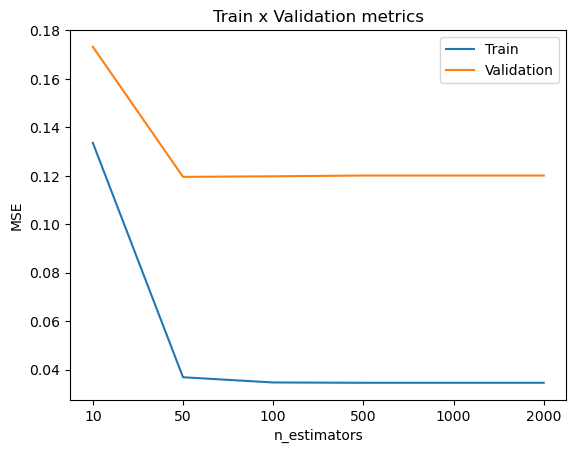

In [121]:
plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [122]:
ind_n_estimators = np.argmin(MSE_list_val)
ind_n_estimators

1

In [123]:
best_n_estimators = n_estimators_list[ind_n_estimators]
best_n_estimators

50

In [124]:
xgb_pH_model = XGBRegressor(n_estimators = 50, learning_rate = 0.1,verbosity = 1,random_state = 123)
xgb_pH_model.fit(X_train_fit,y_train_fit, eval_set = [(X_train_eval,y_train_eval)])

[0]	validation_0-rmse:6.40290
[1]	validation_0-rmse:5.76061
[2]	validation_0-rmse:5.18297
[3]	validation_0-rmse:4.66445
[4]	validation_0-rmse:4.19815
[5]	validation_0-rmse:3.77835
[6]	validation_0-rmse:3.40158
[7]	validation_0-rmse:3.06329
[8]	validation_0-rmse:2.75938
[9]	validation_0-rmse:2.48611
[10]	validation_0-rmse:2.23990
[11]	validation_0-rmse:2.01947
[12]	validation_0-rmse:1.82140
[13]	validation_0-rmse:1.64503
[14]	validation_0-rmse:1.48736
[15]	validation_0-rmse:1.34708
[16]	validation_0-rmse:1.22287
[17]	validation_0-rmse:1.11241
[18]	validation_0-rmse:1.01222
[19]	validation_0-rmse:0.92473
[20]	validation_0-rmse:0.84798
[21]	validation_0-rmse:0.78010
[22]	validation_0-rmse:0.72056
[23]	validation_0-rmse:0.67102
[24]	validation_0-rmse:0.62691
[25]	validation_0-rmse:0.58896
[26]	validation_0-rmse:0.55662
[27]	validation_0-rmse:0.52942
[28]	validation_0-rmse:0.50503
[29]	validation_0-rmse:0.48537
[30]	validation_0-rmse:0.46912
[31]	validation_0-rmse:0.45513
[32]	validation_0-

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=50, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=123, ...)

In [125]:
xgb_pH_model.best_iteration

49

In [126]:
print(f"MSE for train:\n\tMSE: {MSE(xgb_pH_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(xgb_pH_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 0.0602
MSE for validation:
	MSE: 0.1219


In [127]:
y_pred_pH = xgb_pH_model.predict(X_val)

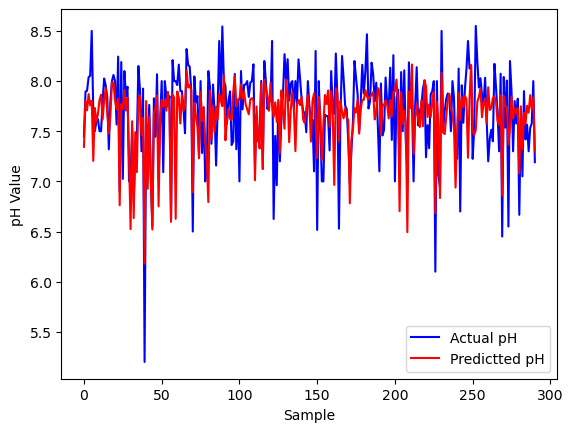

In [128]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(y_pred_pH)),y_pred_pH,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

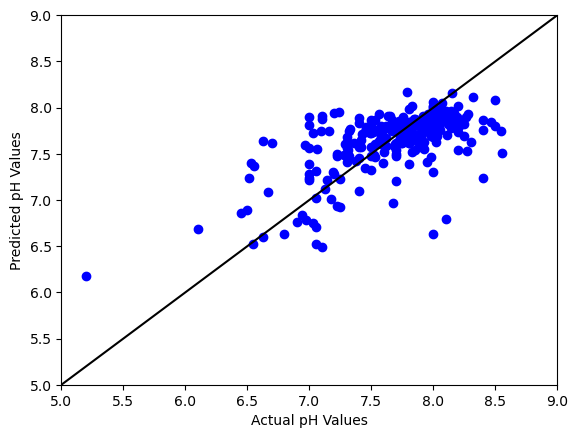

In [129]:
plt.scatter(y_val, y_pred_pH, c='b')
plt.plot([5,9], [5,9], 'k')
plt.xlim([5, 9])
plt.ylim([5, 9])
plt.xlabel('Actual pH Values')
plt.ylabel('Predicted pH Values');

In [130]:
diff_pH = y_pred_pH - y_val

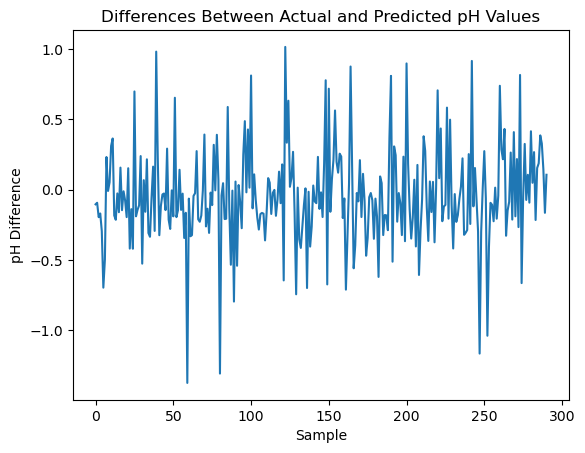

In [131]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [82]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

ModuleNotFoundError: No module named 'tensorflow'

In [49]:
norm = tf.keras.layers.Normalization(axis=-1)
norm.adapt(X_train)
Xn = norm(X_train)

In [118]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(30, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 23.1494
Epoch 2/1000
25/25 [==============================] - 0s 1ms/step - loss: 3.1471
Epoch 3/1000
25/25 [==============================] - 0s 1ms/step - loss: 1.5185
Epoch 4/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.7485
Epoch 5/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.4724
Epoch 6/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.3970
Epoch 7/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.3451
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3666
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3315
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3330
Epoch 11/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.3126
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3160
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2408
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2271
Epoch 103/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2233
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2654
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2783
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2389
Epoch 107/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2388
Epoch 108/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2304
Epoch 109/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2270
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2324
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2077
Epoch 112/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2179
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 0.1893
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1985
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1961
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1907
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1854
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1861
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1901
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1888
Epoch 305/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1821
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1926
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1883
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2094
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 494/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1849
Epoch 495/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1791
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1747
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1757
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1821
Epoch 499/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1867
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1816
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1837
Epoch 503/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1783
Epoch 504/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1791
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 690/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1769
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1758
Epoch 693/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1807
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 695/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1887
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1782
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1991
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 701/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1768
Epoch 886/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1828
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1821
Epoch 893/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1732
Epoch 894/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1806
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 897/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2644
Epoch 83/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2733
Epoch 84/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2238
Epoch 85/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2269
Epoch 86/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2419
Epoch 87/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2555
Epoch 88/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2262
Epoch 89/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2139
Epoch 90/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2329
Epoch 91/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2321
Epoch 92/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2292
Epoch 93/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2072
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.1977
Epoch 182/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2077
Epoch 183/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2256
Epoch 184/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2410
Epoch 185/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2194
Epoch 186/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2070
Epoch 187/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2184
Epoch 188/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2147
Epoch 189/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2211
Epoch 190/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2231
Epoch 191/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2281
Epoch 192/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2059
Epoch 193/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 378/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1886
Epoch 379/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 380/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 381/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1786
Epoch 382/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1907
Epoch 383/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1860
Epoch 384/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 385/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2057
Epoch 386/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 387/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1822
Epoch 388/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1869
Epoch 389/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 574/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 575/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1788
Epoch 576/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1777
Epoch 577/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1848
Epoch 578/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1817
Epoch 579/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1839
Epoch 580/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1867
Epoch 581/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1919
Epoch 582/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1849
Epoch 583/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1772
Epoch 584/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2012
Epoch 585/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 770/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1900
Epoch 771/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1946
Epoch 772/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1740
Epoch 773/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1757
Epoch 774/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1788
Epoch 775/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1817
Epoch 776/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 777/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 778/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1944
Epoch 779/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 780/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 781/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1719
Epoch 966/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1897
Epoch 967/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1741
Epoch 968/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 969/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1786
Epoch 970/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 971/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 972/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1757
Epoch 973/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 974/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 975/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1840
Epoch 976/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1861
Epoch 977/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.2057
Epoch 164/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2289
Epoch 165/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2405
Epoch 166/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2291
Epoch 167/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2268
Epoch 168/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2002
Epoch 169/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2149
Epoch 170/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2155
Epoch 171/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2154
Epoch 172/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2149
Epoch 173/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2245
Epoch 174/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2371
Epoch 175/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1864
Epoch 360/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1851
Epoch 361/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 362/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1894
Epoch 363/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1941
Epoch 364/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1977
Epoch 365/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1883
Epoch 366/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1895
Epoch 367/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 368/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1918
Epoch 369/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1815
Epoch 370/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1848
Epoch 371/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1921
Epoch 556/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1813
Epoch 557/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1767
Epoch 558/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 559/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 560/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 561/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1791
Epoch 562/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 563/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1772
Epoch 564/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1784
Epoch 565/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 566/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 567/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 752/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1862
Epoch 753/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 754/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1761
Epoch 755/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 756/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 757/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 758/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1777
Epoch 759/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1788
Epoch 760/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1811
Epoch 761/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1760
Epoch 762/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1755
Epoch 763/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1778
Epoch 948/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 949/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1828
Epoch 950/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1801
Epoch 951/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1767
Epoch 952/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1782
Epoch 953/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1756
Epoch 954/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1801
Epoch 955/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 956/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1726
Epoch 957/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1893
Epoch 958/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 959/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2051
Epoch 146/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2027
Epoch 147/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2142
Epoch 148/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2022
Epoch 149/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1963
Epoch 150/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1975
Epoch 151/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1944
Epoch 152/1000
25/25 [==============================] - 0s 967us/step - loss: 0.2324
Epoch 153/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2408
Epoch 154/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2096
Epoch 155/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2034
Epoch 156/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2143
Epoch 157/1000
25

25/25 [==============================] - 0s 2ms/step - loss: 0.1964
Epoch 342/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 343/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1797
Epoch 344/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1962
Epoch 345/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1832
Epoch 346/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 347/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1827
Epoch 348/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 349/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1773
Epoch 350/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1788
Epoch 351/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 352/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2015
Epoch 353/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1769
Epoch 538/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 539/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1768
Epoch 540/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1736
Epoch 541/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1731
Epoch 542/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1729
Epoch 543/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1738
Epoch 544/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1711
Epoch 545/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1790
Epoch 546/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1915
Epoch 547/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 548/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1719
Epoch 549/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1743
Epoch 734/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1715
Epoch 735/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1865
Epoch 736/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 737/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 738/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1749
Epoch 739/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1815
Epoch 740/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1729
Epoch 741/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1758
Epoch 742/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1722
Epoch 743/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1748
Epoch 744/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1749
Epoch 745/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1812
Epoch 930/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1804
Epoch 931/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1772
Epoch 932/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1711
Epoch 933/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1754
Epoch 934/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1763
Epoch 935/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1773
Epoch 936/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1857
Epoch 937/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2024
Epoch 938/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2041
Epoch 939/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 940/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 941/1000
25/2

Epoch 28/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2575
Epoch 29/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2423
Epoch 30/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2410
Epoch 31/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2462
Epoch 32/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2894
Epoch 33/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3136
Epoch 34/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3381
Epoch 35/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2595
Epoch 36/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2370
Epoch 37/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2442
Epoch 38/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2538
Epoch 39/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2439
Epoch 40/1000
25

25/25 [==============================] - 0s 2ms/step - loss: 0.2070
Epoch 226/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2035
Epoch 227/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2003
Epoch 228/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2000
Epoch 229/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2043
Epoch 230/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1976
Epoch 231/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2072
Epoch 232/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2024
Epoch 233/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1950
Epoch 234/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1977
Epoch 235/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2617
Epoch 236/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2118
Epoch 237/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1897
Epoch 422/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1928
Epoch 423/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 424/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1998
Epoch 425/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 426/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 427/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1826
Epoch 428/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 429/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 430/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 431/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 432/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1929
Epoch 433/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1903
Epoch 618/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1917
Epoch 619/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1940
Epoch 620/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1932
Epoch 621/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1953
Epoch 622/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2073
Epoch 623/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1895
Epoch 624/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1885
Epoch 625/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1862
Epoch 626/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1857
Epoch 627/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1956
Epoch 628/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2026
Epoch 629/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.2018
Epoch 814/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1909
Epoch 815/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1800
Epoch 816/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 817/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 818/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 819/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1874
Epoch 820/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1792
Epoch 821/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1766
Epoch 822/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1763
Epoch 823/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1835
Epoch 824/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 825/1000
25/2

In [119]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [120]:
MSE_pred

[0.22902443015227697,
 0.22939711573519808,
 0.2112265589545754,
 0.227024927478973,
 0.25863409595937165]

In [121]:
MSE_pred

[0.22902443015227697,
 0.22939711573519808,
 0.2112265589545754,
 0.227024927478973,
 0.25863409595937165]

In [122]:
MSE_train

[0.19344883692042603,
 0.20456790789647059,
 0.1910499421246136,
 0.20279052434409822,
 0.22395154999559808]

In [123]:
MSE_train

[0.19344883692042603,
 0.20456790789647059,
 0.1910499421246136,
 0.20279052434409822,
 0.22395154999559808]

In [124]:
yhat_pred

array([[7.5610104],
       [7.5187035],
       [7.333293 ],
       [7.557679 ],
       [7.2261515],
       [7.2320137],
       [6.8327017],
       [7.2657967],
       [7.4715786],
       [7.71     ],
       [7.5320272],
       [7.4355793],
       [7.54712  ],
       [7.477228 ],
       [7.6309986],
       [7.18851  ],
       [7.547926 ],
       [7.407074 ],
       [7.539069 ],
       [7.5929384],
       [7.267109 ],
       [7.501857 ],
       [7.5509834],
       [6.827716 ],
       [7.496726 ],
       [7.3893785],
       [7.743781 ],
       [7.0452175],
       [7.644642 ],
       [7.551651 ],
       [6.8186026],
       [7.6347322],
       [6.871912 ],
       [7.0152435],
       [6.7528887],
       [7.6497335],
       [7.6837654],
       [7.4515915],
       [7.143923 ],
       [7.3682337],
       [7.628931 ],
       [6.7486277],
       [7.0499897],
       [6.7998886],
       [6.7848663],
       [7.238864 ],
       [7.5725403],
       [7.517435 ],
       [6.9996576],
       [7.627142 ],


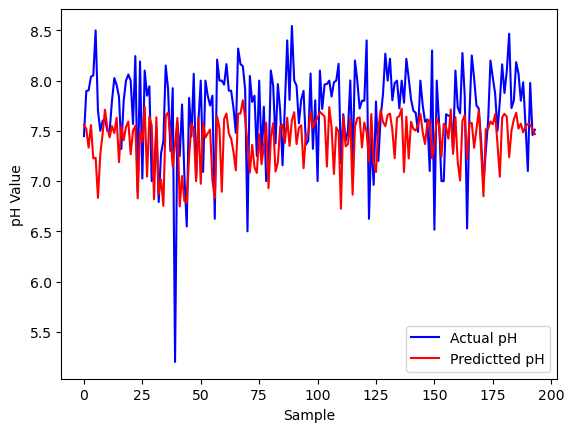

In [125]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [126]:
diff_pH = yhat_pred.flatten() - y_val

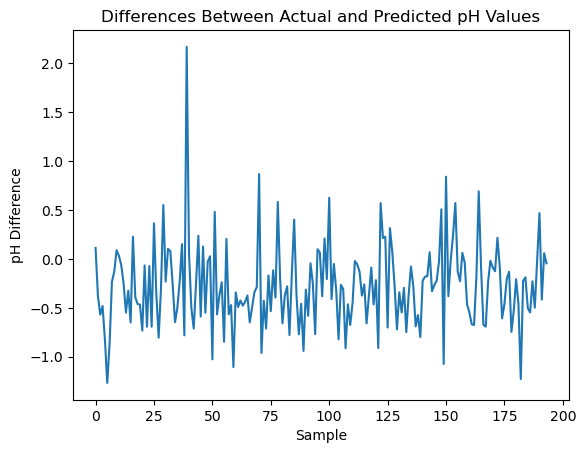

In [127]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [118]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(30, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 23.1494
Epoch 2/1000
25/25 [==============================] - 0s 1ms/step - loss: 3.1471
Epoch 3/1000
25/25 [==============================] - 0s 1ms/step - loss: 1.5185
Epoch 4/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.7485
Epoch 5/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.4724
Epoch 6/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.3970
Epoch 7/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.3451
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3666
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3315
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3330
Epoch 11/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.3126
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3160
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2408
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2271
Epoch 103/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2233
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2654
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2783
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2389
Epoch 107/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2388
Epoch 108/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2304
Epoch 109/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2270
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2324
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2077
Epoch 112/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2179
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 0.1893
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1985
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1961
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1907
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1854
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1861
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1901
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1888
Epoch 305/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1821
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1926
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1883
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2094
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 494/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1849
Epoch 495/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1791
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1747
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1757
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1821
Epoch 499/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1867
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1816
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1837
Epoch 503/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1783
Epoch 504/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1791
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 690/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1769
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1758
Epoch 693/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1807
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 695/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1887
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1782
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1991
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 701/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1768
Epoch 886/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1828
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1821
Epoch 893/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1732
Epoch 894/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1806
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 897/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2644
Epoch 83/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2733
Epoch 84/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2238
Epoch 85/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2269
Epoch 86/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2419
Epoch 87/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2555
Epoch 88/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2262
Epoch 89/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2139
Epoch 90/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2329
Epoch 91/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2321
Epoch 92/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2292
Epoch 93/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2072
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.1977
Epoch 182/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2077
Epoch 183/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2256
Epoch 184/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2410
Epoch 185/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2194
Epoch 186/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2070
Epoch 187/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2184
Epoch 188/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2147
Epoch 189/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2211
Epoch 190/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2231
Epoch 191/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2281
Epoch 192/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2059
Epoch 193/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 378/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1886
Epoch 379/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 380/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 381/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1786
Epoch 382/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1907
Epoch 383/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1860
Epoch 384/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 385/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2057
Epoch 386/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 387/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1822
Epoch 388/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1869
Epoch 389/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 574/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 575/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1788
Epoch 576/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1777
Epoch 577/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1848
Epoch 578/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1817
Epoch 579/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1839
Epoch 580/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1867
Epoch 581/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1919
Epoch 582/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1849
Epoch 583/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1772
Epoch 584/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2012
Epoch 585/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 770/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1900
Epoch 771/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1946
Epoch 772/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1740
Epoch 773/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1757
Epoch 774/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1788
Epoch 775/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1817
Epoch 776/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 777/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 778/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1944
Epoch 779/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 780/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 781/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1719
Epoch 966/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1897
Epoch 967/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1741
Epoch 968/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 969/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1786
Epoch 970/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 971/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 972/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1757
Epoch 973/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 974/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 975/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1840
Epoch 976/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1861
Epoch 977/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.2057
Epoch 164/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2289
Epoch 165/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2405
Epoch 166/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2291
Epoch 167/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2268
Epoch 168/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2002
Epoch 169/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2149
Epoch 170/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2155
Epoch 171/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2154
Epoch 172/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2149
Epoch 173/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2245
Epoch 174/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2371
Epoch 175/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1864
Epoch 360/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1851
Epoch 361/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 362/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1894
Epoch 363/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1941
Epoch 364/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1977
Epoch 365/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1883
Epoch 366/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1895
Epoch 367/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 368/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1918
Epoch 369/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1815
Epoch 370/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1848
Epoch 371/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1921
Epoch 556/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1813
Epoch 557/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1767
Epoch 558/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 559/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 560/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 561/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1791
Epoch 562/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 563/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1772
Epoch 564/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1784
Epoch 565/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 566/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 567/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 752/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1862
Epoch 753/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 754/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1761
Epoch 755/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 756/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 757/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 758/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1777
Epoch 759/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1788
Epoch 760/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1811
Epoch 761/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1760
Epoch 762/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1755
Epoch 763/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1778
Epoch 948/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 949/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1828
Epoch 950/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1801
Epoch 951/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1767
Epoch 952/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1782
Epoch 953/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1756
Epoch 954/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1801
Epoch 955/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 956/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1726
Epoch 957/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1893
Epoch 958/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 959/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2051
Epoch 146/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2027
Epoch 147/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2142
Epoch 148/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2022
Epoch 149/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1963
Epoch 150/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1975
Epoch 151/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1944
Epoch 152/1000
25/25 [==============================] - 0s 967us/step - loss: 0.2324
Epoch 153/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2408
Epoch 154/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2096
Epoch 155/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2034
Epoch 156/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2143
Epoch 157/1000
25

25/25 [==============================] - 0s 2ms/step - loss: 0.1964
Epoch 342/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 343/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1797
Epoch 344/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1962
Epoch 345/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1832
Epoch 346/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 347/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1827
Epoch 348/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 349/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1773
Epoch 350/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1788
Epoch 351/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 352/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2015
Epoch 353/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1769
Epoch 538/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 539/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1768
Epoch 540/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1736
Epoch 541/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1731
Epoch 542/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1729
Epoch 543/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1738
Epoch 544/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1711
Epoch 545/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1790
Epoch 546/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1915
Epoch 547/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 548/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1719
Epoch 549/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1743
Epoch 734/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1715
Epoch 735/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1865
Epoch 736/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 737/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 738/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1749
Epoch 739/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1815
Epoch 740/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1729
Epoch 741/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1758
Epoch 742/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1722
Epoch 743/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1748
Epoch 744/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1749
Epoch 745/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1812
Epoch 930/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1804
Epoch 931/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1772
Epoch 932/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1711
Epoch 933/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1754
Epoch 934/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1763
Epoch 935/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1773
Epoch 936/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1857
Epoch 937/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2024
Epoch 938/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2041
Epoch 939/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 940/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 941/1000
25/2

Epoch 28/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2575
Epoch 29/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2423
Epoch 30/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2410
Epoch 31/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2462
Epoch 32/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2894
Epoch 33/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3136
Epoch 34/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3381
Epoch 35/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2595
Epoch 36/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2370
Epoch 37/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2442
Epoch 38/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2538
Epoch 39/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2439
Epoch 40/1000
25

25/25 [==============================] - 0s 2ms/step - loss: 0.2070
Epoch 226/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2035
Epoch 227/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2003
Epoch 228/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2000
Epoch 229/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.2043
Epoch 230/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1976
Epoch 231/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2072
Epoch 232/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2024
Epoch 233/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1950
Epoch 234/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1977
Epoch 235/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2617
Epoch 236/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2118
Epoch 237/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.1897
Epoch 422/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1928
Epoch 423/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 424/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1998
Epoch 425/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 426/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 427/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1826
Epoch 428/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 429/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 430/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1825
Epoch 431/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 432/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1929
Epoch 433/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1903
Epoch 618/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1917
Epoch 619/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1940
Epoch 620/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1932
Epoch 621/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1953
Epoch 622/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2073
Epoch 623/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1895
Epoch 624/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1885
Epoch 625/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1862
Epoch 626/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1857
Epoch 627/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1956
Epoch 628/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2026
Epoch 629/1000
25/2

25/25 [==============================] - 0s 1ms/step - loss: 0.2018
Epoch 814/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1909
Epoch 815/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1800
Epoch 816/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 817/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 818/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 819/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1874
Epoch 820/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1792
Epoch 821/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1766
Epoch 822/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1763
Epoch 823/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1835
Epoch 824/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 825/1000
25/2

In [119]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [120]:
MSE_pred

[0.22902443015227697,
 0.22939711573519808,
 0.2112265589545754,
 0.227024927478973,
 0.25863409595937165]

In [121]:
MSE_pred

[0.22902443015227697,
 0.22939711573519808,
 0.2112265589545754,
 0.227024927478973,
 0.25863409595937165]

In [122]:
MSE_train

[0.19344883692042603,
 0.20456790789647059,
 0.1910499421246136,
 0.20279052434409822,
 0.22395154999559808]

In [123]:
MSE_train

[0.19344883692042603,
 0.20456790789647059,
 0.1910499421246136,
 0.20279052434409822,
 0.22395154999559808]

In [124]:
yhat_pred

array([[7.5610104],
       [7.5187035],
       [7.333293 ],
       [7.557679 ],
       [7.2261515],
       [7.2320137],
       [6.8327017],
       [7.2657967],
       [7.4715786],
       [7.71     ],
       [7.5320272],
       [7.4355793],
       [7.54712  ],
       [7.477228 ],
       [7.6309986],
       [7.18851  ],
       [7.547926 ],
       [7.407074 ],
       [7.539069 ],
       [7.5929384],
       [7.267109 ],
       [7.501857 ],
       [7.5509834],
       [6.827716 ],
       [7.496726 ],
       [7.3893785],
       [7.743781 ],
       [7.0452175],
       [7.644642 ],
       [7.551651 ],
       [6.8186026],
       [7.6347322],
       [6.871912 ],
       [7.0152435],
       [6.7528887],
       [7.6497335],
       [7.6837654],
       [7.4515915],
       [7.143923 ],
       [7.3682337],
       [7.628931 ],
       [6.7486277],
       [7.0499897],
       [6.7998886],
       [6.7848663],
       [7.238864 ],
       [7.5725403],
       [7.517435 ],
       [6.9996576],
       [7.627142 ],


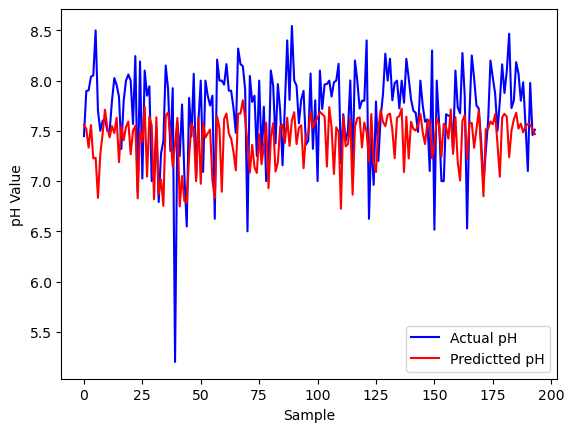

In [125]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [126]:
diff_pH = yhat_pred.flatten() - y_val

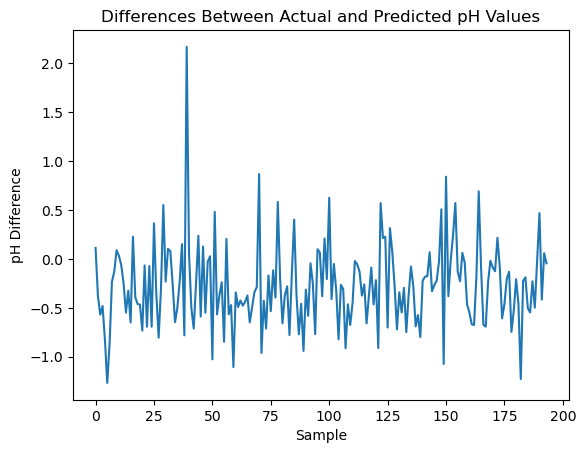

In [127]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [128]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(100, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(30, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 22.9246
Epoch 2/1000
25/25 [==============================] - 0s 1ms/step - loss: 3.1046
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3090
Epoch 4/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.6401
Epoch 5/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.4282
Epoch 6/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3654
Epoch 7/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.4144
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3561
Epoch 9/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.3303
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3095
Epoch 11/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2948
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3064
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2138
Epoch 102/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.2140
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2208
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2271
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2510
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2193
Epoch 107/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2234
Epoch 108/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2223
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2449
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2486
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2261
Epoch 112/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2234
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.1928
Epoch 298/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2070
Epoch 299/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1960
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2080
Epoch 301/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1869
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1840
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1985
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1942
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1831
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1878
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2199
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1918
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 495/1000
25/25 [==============================] - 0s 1ms/step - loss: 0.1784
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1750
Epoch 497/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1732
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1864
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1824
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1817
Epoch 504/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1835
Epoch 690/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1736
Epoch 691/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1742
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1720
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1793
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1750
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1834
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1732
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1723
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1742
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1929
Epoch 700/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1847
Epoch 701/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1741
Epoch 886/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1881
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1880
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1745
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1679
Epoch 894/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1739
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1732
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 897/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2695
Epoch 83/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2909
Epoch 84/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2348
Epoch 85/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2241
Epoch 86/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2517
Epoch 87/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2563
Epoch 88/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2213
Epoch 89/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2327
Epoch 90/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2292
Epoch 91/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2362
Epoch 92/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2358
Epoch 93/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2123
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.1866
Epoch 182/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2022
Epoch 183/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2244
Epoch 184/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2302
Epoch 185/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.5074
Epoch 186/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2802
Epoch 187/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2407
Epoch 188/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2562
Epoch 189/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2275
Epoch 190/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2274
Epoch 191/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2392
Epoch 192/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2400
Epoch 193/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1858
Epoch 378/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1886
Epoch 379/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 380/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 381/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 382/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1920
Epoch 383/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1895
Epoch 384/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1864
Epoch 385/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2029
Epoch 386/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1844
Epoch 387/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1836
Epoch 388/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1849
Epoch 389/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1879
Epoch 574/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1947
Epoch 575/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1897
Epoch 576/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1802
Epoch 577/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1866
Epoch 578/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1798
Epoch 579/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 580/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1893
Epoch 581/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1987
Epoch 582/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 583/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1790
Epoch 584/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2064
Epoch 585/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 770/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2008
Epoch 771/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1996
Epoch 772/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1772
Epoch 773/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1772
Epoch 774/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1801
Epoch 775/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1835
Epoch 776/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1776
Epoch 777/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 778/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1798
Epoch 779/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1781
Epoch 780/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 781/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1737
Epoch 966/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1889
Epoch 967/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1751
Epoch 968/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1777
Epoch 969/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 970/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1774
Epoch 971/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1788
Epoch 972/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1774
Epoch 973/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 974/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 975/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1782
Epoch 976/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1928
Epoch 977/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1952
Epoch 164/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2124
Epoch 165/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2422
Epoch 166/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2289
Epoch 167/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2110
Epoch 168/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2033
Epoch 169/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2138
Epoch 170/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2106
Epoch 171/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2179
Epoch 172/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2139
Epoch 173/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2297
Epoch 174/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2333
Epoch 175/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1854
Epoch 360/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1866
Epoch 361/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1831
Epoch 362/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1882
Epoch 363/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1935
Epoch 364/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1924
Epoch 365/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1838
Epoch 366/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1863
Epoch 367/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 368/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1896
Epoch 369/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1797
Epoch 370/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1792
Epoch 371/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1962
Epoch 556/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1801
Epoch 557/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1798
Epoch 558/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 559/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 560/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1813
Epoch 561/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 562/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1830
Epoch 563/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1784
Epoch 564/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1811
Epoch 565/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 566/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1806
Epoch 567/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1896
Epoch 752/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1941
Epoch 753/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1899
Epoch 754/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1924
Epoch 755/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1986
Epoch 756/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1895
Epoch 757/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1951
Epoch 758/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1900
Epoch 759/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1869
Epoch 760/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1861
Epoch 761/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 762/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 763/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 948/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 949/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1899
Epoch 950/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1824
Epoch 951/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1858
Epoch 952/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1824
Epoch 953/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 954/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 955/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1844
Epoch 956/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1758
Epoch 957/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1939
Epoch 958/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 959/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2091
Epoch 146/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2082
Epoch 147/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2320
Epoch 148/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2096
Epoch 149/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2005
Epoch 150/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2042
Epoch 151/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1973
Epoch 152/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2356
Epoch 153/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2508
Epoch 154/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2143
Epoch 155/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2129
Epoch 156/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2188
Epoch 157/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 342/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1906
Epoch 343/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 344/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2039
Epoch 345/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1931
Epoch 346/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1923
Epoch 347/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1926
Epoch 348/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1937
Epoch 349/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1927
Epoch 350/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1885
Epoch 351/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1985
Epoch 352/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1986
Epoch 353/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 538/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1813
Epoch 539/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1784
Epoch 540/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 541/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1781
Epoch 542/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 543/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1831
Epoch 544/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1782
Epoch 545/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1867
Epoch 546/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1991
Epoch 547/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 548/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1802
Epoch 549/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 734/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1751
Epoch 735/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1951
Epoch 736/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1924
Epoch 737/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1859
Epoch 738/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1818
Epoch 739/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 740/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 741/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 742/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 743/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 744/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 745/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1799
Epoch 930/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1890
Epoch 931/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 932/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 933/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1775
Epoch 934/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1830
Epoch 935/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1828
Epoch 936/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1849
Epoch 937/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1824
Epoch 938/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1773
Epoch 939/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1777
Epoch 940/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 941/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2573
Epoch 29/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2518
Epoch 30/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2426
Epoch 31/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2540
Epoch 32/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3035
Epoch 33/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3771
Epoch 34/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3542
Epoch 35/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2612
Epoch 36/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2510
Epoch 37/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2457
Epoch 38/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2947
Epoch 39/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3027
Epoch 40/1000
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.1977
Epoch 226/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2028
Epoch 227/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1960
Epoch 228/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1999
Epoch 229/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2129
Epoch 230/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1940
Epoch 231/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1973
Epoch 232/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1931
Epoch 233/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1877
Epoch 234/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1892
Epoch 235/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2392
Epoch 236/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2053
Epoch 237/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1857
Epoch 422/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1864
Epoch 423/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1788
Epoch 424/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1925
Epoch 425/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1792
Epoch 426/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 427/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1815
Epoch 428/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1858
Epoch 429/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1864
Epoch 430/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 431/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 432/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1904
Epoch 433/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1875
Epoch 618/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1875
Epoch 619/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2052
Epoch 620/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1922
Epoch 621/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1862
Epoch 622/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1969
Epoch 623/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1797
Epoch 624/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1785
Epoch 625/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 626/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1746
Epoch 627/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1876
Epoch 628/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1869
Epoch 629/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1926
Epoch 814/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1870
Epoch 815/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1767
Epoch 816/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1759
Epoch 817/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1838
Epoch 818/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1849
Epoch 819/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1831
Epoch 820/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1769
Epoch 821/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1733
Epoch 822/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1743
Epoch 823/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1812
Epoch 824/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1746
Epoch 825/1000
25/2

In [129]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [130]:
MSE_pred

[0.23100020066615903,
 0.24628694831129175,
 0.24996174963393258,
 0.25015662390306925,
 0.24340178136907056]

In [131]:
MSE_pred

[0.23100020066615903,
 0.24628694831129175,
 0.24996174963393258,
 0.25015662390306925,
 0.24340178136907056]

In [132]:
MSE_train

[0.20049362112112087,
 0.2062474396623108,
 0.21751482537169242,
 0.20654944740029132,
 0.20869926758243562]

In [133]:
MSE_train

[0.20049362112112087,
 0.2062474396623108,
 0.21751482537169242,
 0.20654944740029132,
 0.20869926758243562]

In [134]:
yhat_pred

array([[7.570886 ],
       [7.5800695],
       [7.376845 ],
       [7.581946 ],
       [7.256574 ],
       [7.296745 ],
       [6.878018 ],
       [7.334554 ],
       [7.492903 ],
       [7.6896024],
       [7.582189 ],
       [7.492903 ],
       [7.546994 ],
       [7.5032816],
       [7.685266 ],
       [7.2339234],
       [7.4620175],
       [7.492903 ],
       [7.6080613],
       [7.6443014],
       [7.3149037],
       [7.567911 ],
       [7.58237  ],
       [6.863351 ],
       [7.569793 ],
       [7.4412203],
       [7.7199235],
       [7.090353 ],
       [7.6808205],
       [7.610865 ],
       [6.8426986],
       [7.648699 ],
       [6.8964367],
       [7.075719 ],
       [6.796845 ],
       [7.653039 ],
       [7.718775 ],
       [7.474632 ],
       [7.194325 ],
       [7.492903 ],
       [7.66592  ],
       [6.7935815],
       [7.0870914],
       [6.8505325],
       [6.831618 ],
       [7.284606 ],
       [7.624445 ],
       [7.5420156],
       [7.019649 ],
       [7.659878 ],


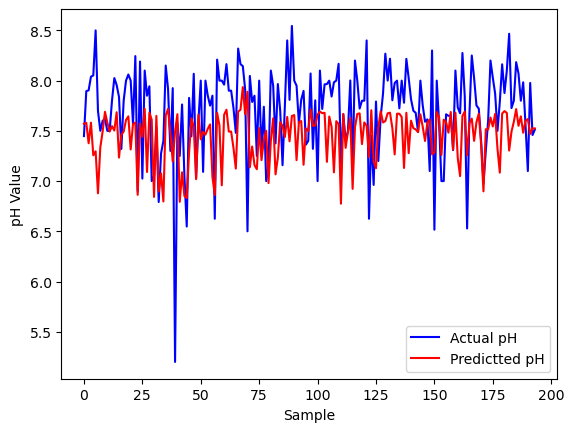

In [135]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [136]:
diff_pH = yhat_pred.flatten() - y_val

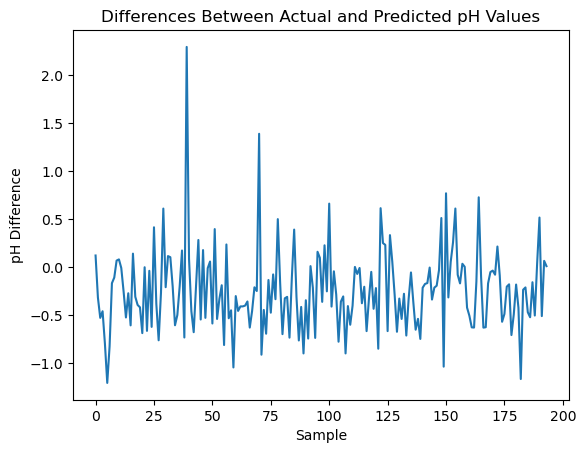

In [137]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [138]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(30, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 21.3384
Epoch 2/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.4568
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.0000
Epoch 4/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.5512
Epoch 5/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3762
Epoch 6/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3254
Epoch 7/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3676
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3499
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3098
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3033
Epoch 11/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2976
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3084
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2514
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2267
Epoch 103/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2635
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2364
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2457
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2339
Epoch 107/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2225
Epoch 108/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2321
Epoch 109/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2252
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2494
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2083
Epoch 112/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2255
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.1894
Epoch 298/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2013
Epoch 299/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1986
Epoch 300/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1907
Epoch 301/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1842
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 303/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1936
Epoch 304/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1883
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1816
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2046
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1921
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2102
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1887
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 495/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1905
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1815
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1853
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1857
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1858
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1888
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1845
Epoch 504/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1847
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1878
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1847
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1797
Epoch 695/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1838
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1816
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1792
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2006
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1855
Epoch 701/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1781
Epoch 886/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1798
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1842
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1852
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1749
Epoch 894/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1842
Epoch 897/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2661
Epoch 83/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3065
Epoch 84/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2282
Epoch 85/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2173
Epoch 86/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2313
Epoch 87/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2530
Epoch 88/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2319
Epoch 89/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2470
Epoch 90/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2186
Epoch 91/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2294
Epoch 92/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2359
Epoch 93/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2092
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.1863
Epoch 182/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2039
Epoch 183/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2153
Epoch 184/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2253
Epoch 185/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3227
Epoch 186/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2307
Epoch 187/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2185
Epoch 188/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2004
Epoch 189/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2070
Epoch 190/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2050
Epoch 191/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1962
Epoch 192/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1989
Epoch 193/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1809
Epoch 378/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1842
Epoch 379/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1762
Epoch 380/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1760
Epoch 381/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1762
Epoch 382/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1884
Epoch 383/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 384/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 385/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1970
Epoch 386/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1832
Epoch 387/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 388/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 389/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1747
Epoch 574/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1798
Epoch 575/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1739
Epoch 576/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1760
Epoch 577/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1897
Epoch 578/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 579/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1766
Epoch 580/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1811
Epoch 581/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2044
Epoch 582/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1745
Epoch 583/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1726
Epoch 584/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2041
Epoch 585/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1727
Epoch 770/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1902
Epoch 771/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1858
Epoch 772/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1769
Epoch 773/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1745
Epoch 774/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 775/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 776/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1743
Epoch 777/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1735
Epoch 778/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 779/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1787
Epoch 780/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1801
Epoch 781/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1703
Epoch 966/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1865
Epoch 967/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1719
Epoch 968/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1751
Epoch 969/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1790
Epoch 970/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 971/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1769
Epoch 972/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1797
Epoch 973/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1806
Epoch 974/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1763
Epoch 975/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 976/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1836
Epoch 977/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2014
Epoch 164/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2090
Epoch 165/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2370
Epoch 166/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2320
Epoch 167/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2270
Epoch 168/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1972
Epoch 169/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2226
Epoch 170/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2265
Epoch 171/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2210
Epoch 172/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2051
Epoch 173/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2307
Epoch 174/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2365
Epoch 175/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1844
Epoch 360/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1819
Epoch 361/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1842
Epoch 362/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1857
Epoch 363/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1927
Epoch 364/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1962
Epoch 365/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1849
Epoch 366/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1835
Epoch 367/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1824
Epoch 368/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1909
Epoch 369/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1806
Epoch 370/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1795
Epoch 371/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1916
Epoch 556/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 557/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1764
Epoch 558/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1776
Epoch 559/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1775
Epoch 560/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1769
Epoch 561/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1774
Epoch 562/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 563/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1760
Epoch 564/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1762
Epoch 565/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1847
Epoch 566/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1786
Epoch 567/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1885
Epoch 752/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1874
Epoch 753/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1799
Epoch 754/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 755/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1851
Epoch 756/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 757/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1807
Epoch 758/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 759/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1792
Epoch 760/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 761/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1766
Epoch 762/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1756
Epoch 763/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1767
Epoch 948/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1769
Epoch 949/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 950/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 951/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1760
Epoch 952/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 953/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1740
Epoch 954/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1784
Epoch 955/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1837
Epoch 956/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1713
Epoch 957/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1885
Epoch 958/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 959/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2134
Epoch 146/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2113
Epoch 147/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2264
Epoch 148/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2147
Epoch 149/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2117
Epoch 150/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2205
Epoch 151/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2205
Epoch 152/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2439
Epoch 153/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2588
Epoch 154/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2209
Epoch 155/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2304
Epoch 156/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2258
Epoch 157/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1877
Epoch 342/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1935
Epoch 343/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1879
Epoch 344/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2033
Epoch 345/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1975
Epoch 346/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1934
Epoch 347/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1906
Epoch 348/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1972
Epoch 349/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1924
Epoch 350/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1944
Epoch 351/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2083
Epoch 352/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2078
Epoch 353/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1855
Epoch 538/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1914
Epoch 539/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 540/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1866
Epoch 541/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 542/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 543/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1833
Epoch 544/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 545/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1889
Epoch 546/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1960
Epoch 547/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1853
Epoch 548/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 549/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1811
Epoch 734/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1754
Epoch 735/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1977
Epoch 736/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1948
Epoch 737/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1821
Epoch 738/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1795
Epoch 739/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1794
Epoch 740/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1781
Epoch 741/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1775
Epoch 742/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1751
Epoch 743/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1826
Epoch 744/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1792
Epoch 745/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 930/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1781
Epoch 931/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 932/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1758
Epoch 933/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1760
Epoch 934/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1788
Epoch 935/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 936/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 937/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1854
Epoch 938/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1851
Epoch 939/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1763
Epoch 940/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1758
Epoch 941/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2593
Epoch 29/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2502
Epoch 30/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2523
Epoch 31/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2685
Epoch 32/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3280
Epoch 33/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3295
Epoch 34/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3524
Epoch 35/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2753
Epoch 36/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2595
Epoch 37/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2592
Epoch 38/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2543
Epoch 39/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2382
Epoch 40/1000
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.2203
Epoch 226/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2100
Epoch 227/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2052
Epoch 228/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2022
Epoch 229/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2180
Epoch 230/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2057
Epoch 231/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2092
Epoch 232/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1971
Epoch 233/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1928
Epoch 234/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1995
Epoch 235/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2607
Epoch 236/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2031
Epoch 237/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1917
Epoch 422/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1948
Epoch 423/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 424/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2066
Epoch 425/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1931
Epoch 426/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1912
Epoch 427/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1921
Epoch 428/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1918
Epoch 429/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 430/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 431/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1868
Epoch 432/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1864
Epoch 433/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1832
Epoch 618/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 619/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1821
Epoch 620/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1868
Epoch 621/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1865
Epoch 622/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1919
Epoch 623/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 624/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 625/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 626/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1769
Epoch 627/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 628/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1922
Epoch 629/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1887
Epoch 814/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1830
Epoch 815/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1747
Epoch 816/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1768
Epoch 817/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1848
Epoch 818/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 819/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 820/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1726
Epoch 821/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1755
Epoch 822/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1724
Epoch 823/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 824/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1740
Epoch 825/1000
25/2

In [139]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 1ms/step


In [140]:
MSE_pred

[0.23201579523912008,
 0.2192863827198275,
 0.23199436191991923,
 0.21008045890039997,
 0.19898930485759778]

In [141]:
MSE_pred

[0.23201579523912008,
 0.2192863827198275,
 0.23199436191991923,
 0.21008045890039997,
 0.19898930485759778]

In [142]:
MSE_train

[0.19600268099241727,
 0.19277245403480991,
 0.2032674406325918,
 0.18582336126875673,
 0.18157351517558143]

In [143]:
MSE_train

[0.19600268099241727,
 0.19277245403480991,
 0.2032674406325918,
 0.18582336126875673,
 0.18157351517558143]

In [144]:
yhat_pred

array([[7.5818834],
       [7.6202087],
       [7.4201555],
       [7.686949 ],
       [7.3108253],
       [7.329323 ],
       [6.9155273],
       [7.3614693],
       [7.656637 ],
       [7.753908 ],
       [7.656637 ],
       [7.6315117],
       [7.595992 ],
       [7.644122 ],
       [7.709674 ],
       [7.275462 ],
       [7.6555233],
       [7.635784 ],
       [7.6354837],
       [7.6909027],
       [7.3962517],
       [7.577651 ],
       [7.5985594],
       [6.888632 ],
       [7.592902 ],
       [7.48069  ],
       [7.7652445],
       [7.128868 ],
       [7.734824 ],
       [7.605218 ],
       [6.887168 ],
       [7.7123537],
       [6.938184 ],
       [7.104762 ],
       [6.833843 ],
       [7.703767 ],
       [7.7759457],
       [7.5041466],
       [7.2211685],
       [5.962883 ],
       [7.695863 ],
       [6.8274813],
       [7.117983 ],
       [6.8835907],
       [6.866088 ],
       [7.3274364],
       [7.660671 ],
       [7.6532145],
       [7.076866 ],
       [7.736739 ],


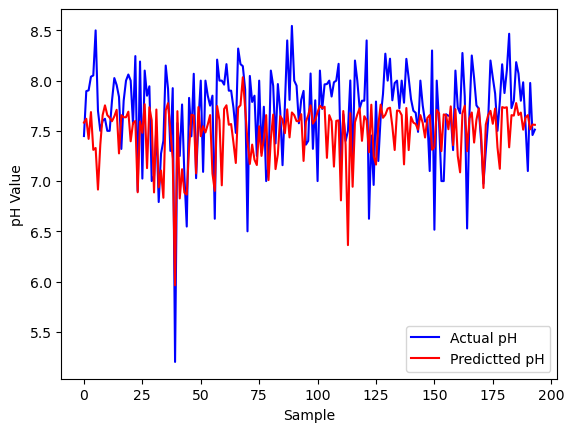

In [145]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [146]:
diff_pH = yhat_pred.flatten() - y_val

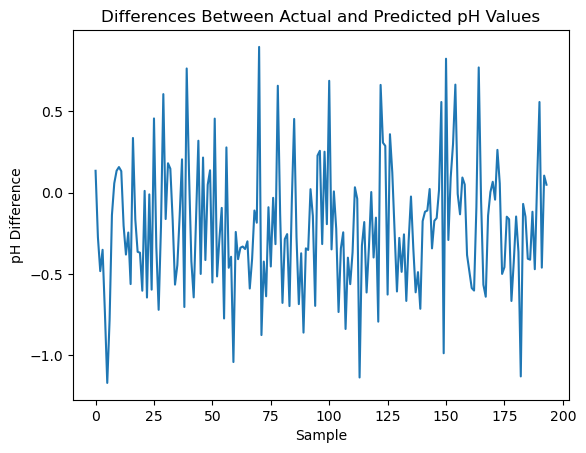

In [147]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [148]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(40, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 23.0605
Epoch 2/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.8976
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5076
Epoch 4/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.7657
Epoch 5/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.5167
Epoch 6/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.4055
Epoch 7/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3671
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3627
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3456
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3649
Epoch 11/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3331
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3746
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2277
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2157
Epoch 103/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2214
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2198
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2425
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2420
Epoch 107/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2300
Epoch 108/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2381
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2504
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2489
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2295
Epoch 112/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2339
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.1901
Epoch 298/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2028
Epoch 299/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2030
Epoch 300/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1940
Epoch 301/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1890
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1898
Epoch 303/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2001
Epoch 304/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1939
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1858
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1994
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1917
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2336
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1914
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1876
Epoch 495/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1830
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1795
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1806
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1913
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1877
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1885
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1825
Epoch 504/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1820
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1790
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1766
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 695/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1806
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1758
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1980
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1941
Epoch 701/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 886/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1846
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1817
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1835
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1831
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1804
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1854
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1754
Epoch 894/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1815
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 897/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2554
Epoch 83/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2543
Epoch 84/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2274
Epoch 85/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2249
Epoch 86/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2608
Epoch 87/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2607
Epoch 88/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2176
Epoch 89/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2191
Epoch 90/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2320
Epoch 91/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2397
Epoch 92/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2411
Epoch 93/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2192
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.1901
Epoch 182/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2018
Epoch 183/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2255
Epoch 184/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2421
Epoch 185/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2536
Epoch 186/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2139
Epoch 187/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2153
Epoch 188/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2031
Epoch 189/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2129
Epoch 190/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2169
Epoch 191/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2291
Epoch 192/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2047
Epoch 193/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1893
Epoch 378/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 379/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 380/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 381/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 382/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 383/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1828
Epoch 384/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1894
Epoch 385/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2025
Epoch 386/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1858
Epoch 387/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 388/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1838
Epoch 389/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 574/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1828
Epoch 575/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1784
Epoch 576/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1791
Epoch 577/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 578/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 579/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 580/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 581/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1941
Epoch 582/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 583/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1780
Epoch 584/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2027
Epoch 585/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1880
Epoch 770/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1932
Epoch 771/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1969
Epoch 772/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 773/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 774/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1790
Epoch 775/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 776/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1775
Epoch 777/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1777
Epoch 778/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1814
Epoch 779/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1771
Epoch 780/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1817
Epoch 781/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1746
Epoch 966/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1885
Epoch 967/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1760
Epoch 968/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1782
Epoch 969/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1790
Epoch 970/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1771
Epoch 971/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1787
Epoch 972/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1761
Epoch 973/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1800
Epoch 974/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 975/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1779
Epoch 976/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1915
Epoch 977/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1940
Epoch 164/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2175
Epoch 165/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2384
Epoch 166/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2305
Epoch 167/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2173
Epoch 168/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1967
Epoch 169/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2133
Epoch 170/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2034
Epoch 171/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2091
Epoch 172/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2061
Epoch 173/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2336
Epoch 174/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2342
Epoch 175/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1867
Epoch 360/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 361/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 362/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 363/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1890
Epoch 364/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2038
Epoch 365/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1849
Epoch 366/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1872
Epoch 367/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 368/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1957
Epoch 369/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1798
Epoch 370/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 371/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2017
Epoch 556/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1853
Epoch 557/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1910
Epoch 558/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1941
Epoch 559/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1925
Epoch 560/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1907
Epoch 561/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1900
Epoch 562/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1876
Epoch 563/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1816
Epoch 564/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1800
Epoch 565/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 566/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1806
Epoch 567/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 752/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 753/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1802
Epoch 754/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1853
Epoch 755/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1917
Epoch 756/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1793
Epoch 757/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1830
Epoch 758/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 759/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1840
Epoch 760/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1871
Epoch 761/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1854
Epoch 762/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1785
Epoch 763/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 948/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 949/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1833
Epoch 950/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1846
Epoch 951/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1813
Epoch 952/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1870
Epoch 953/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1820
Epoch 954/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 955/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1904
Epoch 956/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1768
Epoch 957/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2014
Epoch 958/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1824
Epoch 959/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2125
Epoch 146/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2041
Epoch 147/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2230
Epoch 148/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2132
Epoch 149/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2078
Epoch 150/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2105
Epoch 151/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1965
Epoch 152/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2269
Epoch 153/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2511
Epoch 154/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2316
Epoch 155/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2453
Epoch 156/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2427
Epoch 157/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1758
Epoch 342/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1805
Epoch 343/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1833
Epoch 344/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1947
Epoch 345/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1816
Epoch 346/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1769
Epoch 347/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1794
Epoch 348/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1778
Epoch 349/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1781
Epoch 350/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1795
Epoch 351/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1858
Epoch 352/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1944
Epoch 353/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1831
Epoch 538/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1813
Epoch 539/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 540/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 541/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1764
Epoch 542/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 543/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1809
Epoch 544/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1777
Epoch 545/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1865
Epoch 546/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1965
Epoch 547/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1845
Epoch 548/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1786
Epoch 549/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1926
Epoch 734/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1898
Epoch 735/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1984
Epoch 736/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2021
Epoch 737/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2040
Epoch 738/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2052
Epoch 739/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1954
Epoch 740/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1907
Epoch 741/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1933
Epoch 742/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1940
Epoch 743/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1938
Epoch 744/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1925
Epoch 745/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 930/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1902
Epoch 931/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1865
Epoch 932/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1792
Epoch 933/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1786
Epoch 934/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1789
Epoch 935/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 936/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 937/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2057
Epoch 938/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1796
Epoch 939/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1781
Epoch 940/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 941/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2791
Epoch 29/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2711
Epoch 30/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2487
Epoch 31/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2489
Epoch 32/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2690
Epoch 33/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3000
Epoch 34/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3382
Epoch 35/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2545
Epoch 36/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2652
Epoch 37/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2591
Epoch 38/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2565
Epoch 39/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2373
Epoch 40/1000
25/25 [=========

25/25 [==============================] - 0s 2ms/step - loss: 0.2012
Epoch 226/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2045
Epoch 227/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1946
Epoch 228/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2006
Epoch 229/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2136
Epoch 230/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1934
Epoch 231/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1975
Epoch 232/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1914
Epoch 233/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1867
Epoch 234/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1919
Epoch 235/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2380
Epoch 236/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2000
Epoch 237/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1802
Epoch 422/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1832
Epoch 423/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 424/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1932
Epoch 425/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1799
Epoch 426/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1827
Epoch 427/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1830
Epoch 428/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1867
Epoch 429/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1857
Epoch 430/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1775
Epoch 431/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 432/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1906
Epoch 433/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1739
Epoch 618/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1773
Epoch 619/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 620/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1835
Epoch 621/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 622/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1878
Epoch 623/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1733
Epoch 624/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1743
Epoch 625/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1730
Epoch 626/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1725
Epoch 627/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1912
Epoch 628/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1833
Epoch 629/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2049
Epoch 814/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1832
Epoch 815/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1754
Epoch 816/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1720
Epoch 817/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1845
Epoch 818/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 819/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1860
Epoch 820/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1737
Epoch 821/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1710
Epoch 822/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1717
Epoch 823/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1811
Epoch 824/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1739
Epoch 825/1000
25/2

In [149]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [150]:
MSE_pred

[0.2488339705401206,
 0.22903888681475512,
 0.2280511041790854,
 0.2639145604754967,
 0.23590189021469304]

In [151]:
MSE_pred

[0.2488339705401206,
 0.22903888681475512,
 0.2280511041790854,
 0.2639145604754967,
 0.23590189021469304]

In [152]:
MSE_train

[0.21674242866030288,
 0.19689295726827105,
 0.2097746591115481,
 0.2299131515534742,
 0.2032847087446742]

In [153]:
MSE_train

[0.21674242866030288,
 0.19689295726827105,
 0.2097746591115481,
 0.2299131515534742,
 0.2032847087446742]

In [154]:
yhat_pred

array([[7.5238237],
       [7.583314 ],
       [7.353731 ],
       [7.609929 ],
       [7.22458  ],
       [7.27859  ],
       [6.8229904],
       [7.319808 ],
       [7.5864754],
       [7.6738157],
       [7.598605 ],
       [7.5864754],
       [7.520073 ],
       [7.5864754],
       [7.662546 ],
       [7.1976805],
       [7.0668583],
       [7.5864754],
       [7.6554327],
       [7.633914 ],
       [7.3445387],
       [7.5259895],
       [7.5864754],
       [6.7903423],
       [7.5829372],
       [7.468155 ],
       [7.686013 ],
       [7.05177  ],
       [7.675009 ],
       [7.554323 ],
       [6.7925243],
       [7.644787 ],
       [6.840975 ],
       [7.056391 ],
       [6.7710333],
       [7.621193 ],
       [7.7026196],
       [7.436739 ],
       [7.14497  ],
       [6.444149 ],
       [7.630251 ],
       [6.771473 ],
       [7.0229235],
       [6.8071604],
       [6.78273  ],
       [7.233267 ],
       [7.6098795],
       [7.5864754],
       [6.9853115],
       [7.656455 ],


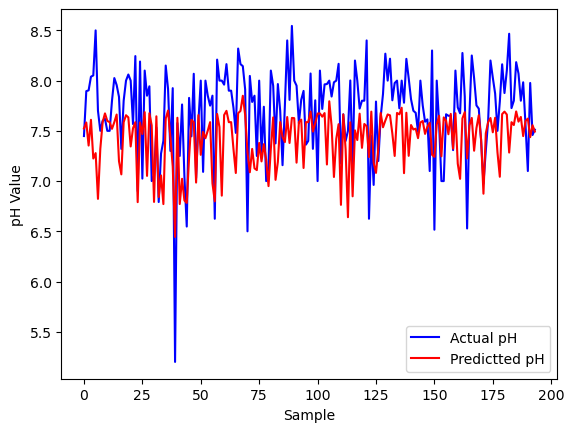

In [155]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [156]:
diff_pH = yhat_pred.flatten() - y_val

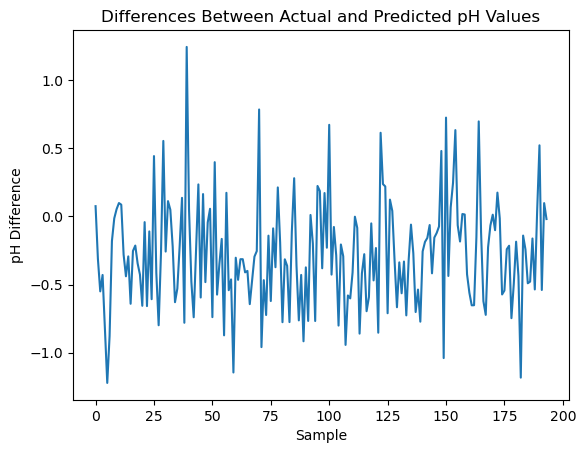

In [157]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [158]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(40, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 16.9700
Epoch 2/1000
25/25 [==============================] - 0s 2ms/step - loss: 3.0090
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2760
Epoch 4/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.5814
Epoch 5/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.5006
Epoch 6/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.4109
Epoch 7/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.4342
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.4092
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3777
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3884
Epoch 11/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3762
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3863
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2129
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2090
Epoch 103/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2085
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2078
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2430
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1971
Epoch 107/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2052
Epoch 108/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2094
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2138
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2460
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1984
Epoch 112/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2110
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 0.1834
Epoch 298/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1936
Epoch 299/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1932
Epoch 300/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 301/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1759
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1778
Epoch 303/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 304/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1759
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1900
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1908
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1841
Epoch 495/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1767
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1867
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1806
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1743
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1783
Epoch 504/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1765
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1865
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1863
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1775
Epoch 695/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1808
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1779
Epoch 698/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1792
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1904
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2054
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1793
Epoch 886/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2013
Epoch 887/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1954
Epoch 888/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1957
Epoch 889/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1849
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1776
Epoch 891/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1858
Epoch 892/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1872
Epoch 893/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1800
Epoch 894/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1763
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1733
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1804
Epoch 897/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2392
Epoch 83/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2846
Epoch 84/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2443
Epoch 85/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2315
Epoch 86/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2276
Epoch 87/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2496
Epoch 88/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2295
Epoch 89/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2367
Epoch 90/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2073
Epoch 91/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2142
Epoch 92/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2273
Epoch 93/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2126
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.1918
Epoch 182/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1958
Epoch 183/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2067
Epoch 184/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1951
Epoch 185/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1931
Epoch 186/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2142
Epoch 187/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1975
Epoch 188/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1913
Epoch 189/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1890
Epoch 190/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1946
Epoch 191/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 192/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2014
Epoch 193/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1857
Epoch 378/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1863
Epoch 379/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1776
Epoch 380/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1796
Epoch 381/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1776
Epoch 382/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1865
Epoch 383/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1809
Epoch 384/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1878
Epoch 385/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1983
Epoch 386/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1873
Epoch 387/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1836
Epoch 388/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1842
Epoch 389/1000
25/2

25/25 [==============================] - 0s 5ms/step - loss: 0.1770
Epoch 574/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.1897
Epoch 575/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.1820
Epoch 576/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1780
Epoch 577/1000
25/25 [==============================] - 0s 7ms/step - loss: 0.1944
Epoch 578/1000
25/25 [==============================] - 0s 8ms/step - loss: 0.1852
Epoch 579/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1817
Epoch 580/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1881
Epoch 581/1000
25/25 [==============================] - 0s 8ms/step - loss: 0.2192
Epoch 582/1000
25/25 [==============================] - 0s 10ms/step - loss: 0.1779
Epoch 583/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.1766
Epoch 584/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.2042
Epoch 585/1000
25/

25/25 [==============================] - 0s 2ms/step - loss: 0.1776
Epoch 770/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1933
Epoch 771/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1914
Epoch 772/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1799
Epoch 773/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1773
Epoch 774/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1831
Epoch 775/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1805
Epoch 776/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1769
Epoch 777/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1764
Epoch 778/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1825
Epoch 779/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1828
Epoch 780/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1816
Epoch 781/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1713
Epoch 966/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1883
Epoch 967/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1761
Epoch 968/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 969/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1818
Epoch 970/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1784
Epoch 971/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1786
Epoch 972/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1797
Epoch 973/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1826
Epoch 974/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 975/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1960
Epoch 976/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2005
Epoch 977/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1850
Epoch 164/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1891
Epoch 165/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2113
Epoch 166/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2028
Epoch 167/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1883
Epoch 168/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1947
Epoch 169/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1983
Epoch 170/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1944
Epoch 171/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2018
Epoch 172/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1973
Epoch 173/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1895
Epoch 174/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2197
Epoch 175/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1807
Epoch 360/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1857
Epoch 361/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1822
Epoch 362/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1861
Epoch 363/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1905
Epoch 364/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1862
Epoch 365/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 366/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1881
Epoch 367/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1791
Epoch 368/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1871
Epoch 369/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1797
Epoch 370/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1762
Epoch 371/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1934
Epoch 556/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1816
Epoch 557/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1758
Epoch 558/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1809
Epoch 559/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1779
Epoch 560/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1787
Epoch 561/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1761
Epoch 562/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1800
Epoch 563/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1743
Epoch 564/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1799
Epoch 565/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1919
Epoch 566/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1746
Epoch 567/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1781
Epoch 752/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1821
Epoch 753/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1721
Epoch 754/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1833
Epoch 755/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1937
Epoch 756/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1825
Epoch 757/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 758/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1788
Epoch 759/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1937
Epoch 760/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 761/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1833
Epoch 762/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1777
Epoch 763/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1776
Epoch 948/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1798
Epoch 949/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1806
Epoch 950/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1850
Epoch 951/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1819
Epoch 952/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1875
Epoch 953/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1763
Epoch 954/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1836
Epoch 955/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1828
Epoch 956/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1734
Epoch 957/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1976
Epoch 958/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1925
Epoch 959/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1981
Epoch 146/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1952
Epoch 147/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2164
Epoch 148/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1978
Epoch 149/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1876
Epoch 150/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1934
Epoch 151/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1840
Epoch 152/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2180
Epoch 153/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1995
Epoch 154/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1922
Epoch 155/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1958
Epoch 156/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1950
Epoch 157/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1755
Epoch 342/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1763
Epoch 343/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1730
Epoch 344/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1929
Epoch 345/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1859
Epoch 346/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1746
Epoch 347/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1806
Epoch 348/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1821
Epoch 349/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1810
Epoch 350/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1767
Epoch 351/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1941
Epoch 352/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2027
Epoch 353/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1881
Epoch 538/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1785
Epoch 539/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1856
Epoch 540/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1823
Epoch 541/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1806
Epoch 542/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1898
Epoch 543/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1794
Epoch 544/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1760
Epoch 545/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1898
Epoch 546/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1903
Epoch 547/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1820
Epoch 548/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1810
Epoch 549/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1755
Epoch 734/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1765
Epoch 735/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1892
Epoch 736/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1818
Epoch 737/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1838
Epoch 738/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1762
Epoch 739/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1810
Epoch 740/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1741
Epoch 741/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1802
Epoch 742/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1771
Epoch 743/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1758
Epoch 744/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1770
Epoch 745/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1877
Epoch 930/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1920
Epoch 931/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1875
Epoch 932/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1768
Epoch 933/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1800
Epoch 934/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1813
Epoch 935/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1790
Epoch 936/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1972
Epoch 937/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1991
Epoch 938/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1757
Epoch 939/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1731
Epoch 940/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1775
Epoch 941/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.3003
Epoch 29/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3800
Epoch 30/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3021
Epoch 31/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2999
Epoch 32/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3737
Epoch 33/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.4215
Epoch 34/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3532
Epoch 35/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3120
Epoch 36/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2791
Epoch 37/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3443
Epoch 38/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3031
Epoch 39/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2670
Epoch 40/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.1867
Epoch 226/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1911
Epoch 227/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1815
Epoch 228/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1833
Epoch 229/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1956
Epoch 230/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1769
Epoch 231/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1917
Epoch 232/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1884
Epoch 233/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1812
Epoch 234/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1829
Epoch 235/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2198
Epoch 236/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1991
Epoch 237/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1769
Epoch 422/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1903
Epoch 423/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1772
Epoch 424/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2008
Epoch 425/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1883
Epoch 426/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1849
Epoch 427/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1849
Epoch 428/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1845
Epoch 429/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1789
Epoch 430/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1803
Epoch 431/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1815
Epoch 432/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1781
Epoch 433/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.1764
Epoch 618/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1843
Epoch 619/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1750
Epoch 620/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1892
Epoch 621/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1774
Epoch 622/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1963
Epoch 623/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1792
Epoch 624/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1749
Epoch 625/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1770
Epoch 626/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1786
Epoch 627/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1871
Epoch 628/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1933
Epoch 629/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 0.2268
Epoch 814/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1771
Epoch 815/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1770
Epoch 816/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1777
Epoch 817/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1784
Epoch 818/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1839
Epoch 819/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1878
Epoch 820/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1766
Epoch 821/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1755
Epoch 822/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1769
Epoch 823/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1800
Epoch 824/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1767
Epoch 825/1000
25/2

In [159]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [160]:
MSE_pred

[0.20035974188372124,
 0.24060382579795767,
 0.20856182821545521,
 0.19812358024039728,
 0.18658645173138022]

In [161]:
MSE_pred

[0.20035974188372124,
 0.24060382579795767,
 0.20856182821545521,
 0.19812358024039728,
 0.18658645173138022]

In [162]:
MSE_train

[0.1813731348792473,
 0.2100976835085912,
 0.1892196920893164,
 0.17672128553102656,
 0.16615085077513017]

In [163]:
MSE_train

[0.1813731348792473,
 0.2100976835085912,
 0.1892196920893164,
 0.17672128553102656,
 0.16615085077513017]

In [164]:
yhat_pred

array([[7.841537 ],
       [7.6802964],
       [7.4122815],
       [7.6201596],
       [7.3765454],
       [7.3663735],
       [6.906754 ],
       [7.421887 ],
       [7.7724185],
       [7.797949 ],
       [7.7724185],
       [7.7233496],
       [7.623917 ],
       [7.612564 ],
       [7.810208 ],
       [7.293737 ],
       [7.0621915],
       [7.7271605],
       [7.808244 ],
       [7.761583 ],
       [7.444512 ],
       [7.598082 ],
       [7.684708 ],
       [6.9593763],
       [7.6560507],
       [7.4689355],
       [7.7963266],
       [7.110392 ],
       [7.8780303],
       [7.6136327],
       [7.004474 ],
       [7.733977 ],
       [6.8930364],
       [7.3349814],
       [6.8655047],
       [7.7354145],
       [7.8544736],
       [7.6774697],
       [7.1979213],
       [6.824797 ],
       [7.819514 ],
       [6.8254647],
       [7.092378 ],
       [7.050566 ],
       [6.834607 ],
       [7.4434743],
       [7.7039657],
       [7.588037 ],
       [7.0705304],
       [7.7262707],


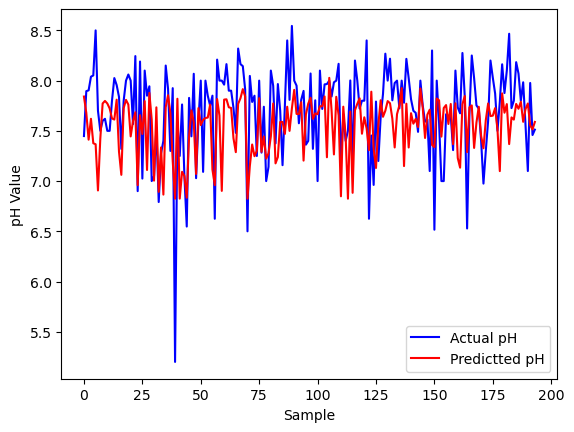

In [165]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [166]:
diff_pH = yhat_pred.flatten() - y_val

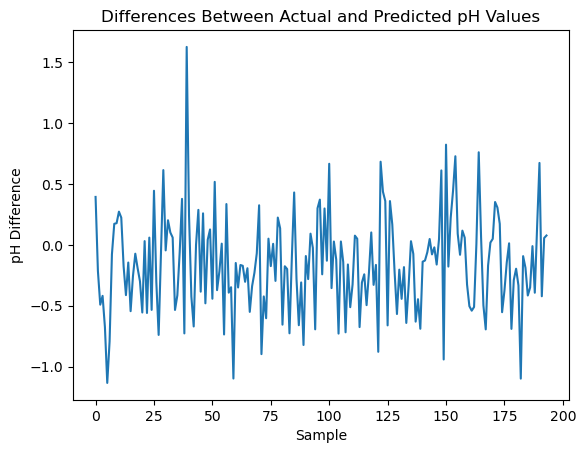

In [167]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

# ===================================

In [50]:
# Best Neural Network Model
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 3s 3ms/step - loss: 16.2496
Epoch 2/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2925
Epoch 3/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.7732
Epoch 4/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4475
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4270
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4025
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3556
Epoch 8/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.3651
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3525
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3544
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3386
Epoch 12/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3372
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2161
Epoch 102/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2191
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2165
Epoch 104/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1985
Epoch 105/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2224
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1961
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2005
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2193
Epoch 109/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2350
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2161
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2079
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2081
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 0.1858
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1835
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1855
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1972
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1855
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1858
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1871
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1948
Epoch 305/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1867
Epoch 306/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2182
Epoch 307/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2187
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1889
Epoch 309/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1785
Epoch 494/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1839
Epoch 495/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1787
Epoch 496/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1884
Epoch 497/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1875
Epoch 498/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1872
Epoch 499/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1999
Epoch 500/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2043
Epoch 501/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1833
Epoch 502/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1857
Epoch 503/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1795
Epoch 504/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1812
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1888
Epoch 690/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1885
Epoch 691/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1889
Epoch 692/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1850
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1809
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1799
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1834
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1844
Epoch 697/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1845
Epoch 698/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1866
Epoch 699/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1927
Epoch 700/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2117
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1791
Epoch 886/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1925
Epoch 887/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1870
Epoch 888/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1993
Epoch 889/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1957
Epoch 890/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1989
Epoch 891/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1999
Epoch 892/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1903
Epoch 893/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1839
Epoch 894/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1797
Epoch 895/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1779
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1827
Epoch 897/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2413
Epoch 83/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2893
Epoch 84/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2547
Epoch 85/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2450
Epoch 86/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2465
Epoch 87/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2814
Epoch 88/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2288
Epoch 89/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2322
Epoch 90/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2261
Epoch 91/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2279
Epoch 92/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2398
Epoch 93/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2246
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.1888
Epoch 182/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1950
Epoch 183/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.2322
Epoch 184/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.2351
Epoch 185/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.2254
Epoch 186/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1931
Epoch 187/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.2014
Epoch 188/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1921
Epoch 189/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1923
Epoch 190/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1997
Epoch 191/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2051
Epoch 192/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1879
Epoch 193/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1829
Epoch 378/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1802
Epoch 379/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1821
Epoch 380/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1812
Epoch 381/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1928
Epoch 382/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1827
Epoch 383/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1884
Epoch 384/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2043
Epoch 385/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1887
Epoch 386/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2072
Epoch 387/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1995
Epoch 388/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1810
Epoch 389/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1850
Epoch 574/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2133
Epoch 575/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1880
Epoch 576/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1870
Epoch 577/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1936
Epoch 578/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1822
Epoch 579/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1848
Epoch 580/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1802
Epoch 581/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2234
Epoch 582/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1932
Epoch 583/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1761
Epoch 584/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1946
Epoch 585/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1783
Epoch 770/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1906
Epoch 771/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1776
Epoch 772/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1913
Epoch 773/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1786
Epoch 774/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1986
Epoch 775/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1855
Epoch 776/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1768
Epoch 777/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1803
Epoch 778/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1820
Epoch 779/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1911
Epoch 780/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1889
Epoch 781/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1750
Epoch 966/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1902
Epoch 967/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1748
Epoch 968/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1787
Epoch 969/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1841
Epoch 970/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1900
Epoch 971/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1833
Epoch 972/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1829
Epoch 973/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1838
Epoch 974/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1729
Epoch 975/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1818
Epoch 976/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1891
Epoch 977/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1773
Epoch 164/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1880
Epoch 165/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2008
Epoch 166/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2028
Epoch 167/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1928
Epoch 168/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1913
Epoch 169/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2045
Epoch 170/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1926
Epoch 171/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1927
Epoch 172/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1930
Epoch 173/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2194
Epoch 174/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2328
Epoch 175/1000
25/2

25/25 [==============================] - 0s 7ms/step - loss: 0.1787
Epoch 360/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1777
Epoch 361/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1817
Epoch 362/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.2032
Epoch 363/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1827
Epoch 364/1000
25/25 [==============================] - 0s 7ms/step - loss: 0.1861
Epoch 365/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1786
Epoch 366/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1988
Epoch 367/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1885
Epoch 368/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1796
Epoch 369/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1798
Epoch 370/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1837
Epoch 371/1000
25/2

25/25 [==============================] - 0s 5ms/step - loss: 0.1882
Epoch 556/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1813
Epoch 557/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1816
Epoch 558/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1755
Epoch 559/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1759
Epoch 560/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1730
Epoch 561/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1759
Epoch 562/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1838
Epoch 563/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1772
Epoch 564/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1775
Epoch 565/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1849
Epoch 566/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1724
Epoch 567/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1798
Epoch 752/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1781
Epoch 753/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1730
Epoch 754/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1907
Epoch 755/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1889
Epoch 756/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1947
Epoch 757/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1839
Epoch 758/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1752
Epoch 759/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1902
Epoch 760/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1790
Epoch 761/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1778
Epoch 762/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1849
Epoch 763/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1767
Epoch 948/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1815
Epoch 949/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1753
Epoch 950/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1792
Epoch 951/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1837
Epoch 952/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1903
Epoch 953/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1847
Epoch 954/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.1742
Epoch 955/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1755
Epoch 956/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1724
Epoch 957/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.2017
Epoch 958/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2082
Epoch 959/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2172
Epoch 146/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1995
Epoch 147/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2022
Epoch 148/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2148
Epoch 149/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1923
Epoch 150/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1974
Epoch 151/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1960
Epoch 152/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2146
Epoch 153/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2336
Epoch 154/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1892
Epoch 155/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2033
Epoch 156/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2028
Epoch 157/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1804
Epoch 342/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1813
Epoch 343/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1765
Epoch 344/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1948
Epoch 345/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1992
Epoch 346/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1824
Epoch 347/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1883
Epoch 348/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1857
Epoch 349/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1822
Epoch 350/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1827
Epoch 351/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1899
Epoch 352/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.2376
Epoch 353/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1953
Epoch 538/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1799
Epoch 539/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1876
Epoch 540/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1886
Epoch 541/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1909
Epoch 542/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1863
Epoch 543/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1774
Epoch 544/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1835
Epoch 545/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2156
Epoch 546/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1924
Epoch 547/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1825
Epoch 548/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1850
Epoch 549/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1754
Epoch 734/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1772
Epoch 735/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1987
Epoch 736/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1855
Epoch 737/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1855
Epoch 738/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1744
Epoch 739/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1751
Epoch 740/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1791
Epoch 741/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1846
Epoch 742/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1897
Epoch 743/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1819
Epoch 744/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1879
Epoch 745/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1902
Epoch 930/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1887
Epoch 931/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1838
Epoch 932/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1811
Epoch 933/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1804
Epoch 934/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1829
Epoch 935/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1842
Epoch 936/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2047
Epoch 937/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2100
Epoch 938/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1787
Epoch 939/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1754
Epoch 940/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1757
Epoch 941/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 0.2767
Epoch 29/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3113
Epoch 30/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2795
Epoch 31/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2684
Epoch 32/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2905
Epoch 33/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2651
Epoch 34/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2533
Epoch 35/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2719
Epoch 36/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2613
Epoch 37/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3128
Epoch 38/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2620
Epoch 39/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2467
Epoch 40/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.1886
Epoch 226/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1909
Epoch 227/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1883
Epoch 228/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1857
Epoch 229/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2014
Epoch 230/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1879
Epoch 231/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2024
Epoch 232/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1918
Epoch 233/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1824
Epoch 234/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1879
Epoch 235/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2339
Epoch 236/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2003
Epoch 237/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1804
Epoch 422/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1923
Epoch 423/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1759
Epoch 424/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1953
Epoch 425/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1864
Epoch 426/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2047
Epoch 427/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1896
Epoch 428/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1945
Epoch 429/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1973
Epoch 430/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1925
Epoch 431/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1927
Epoch 432/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1931
Epoch 433/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1769
Epoch 618/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1855
Epoch 619/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1739
Epoch 620/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1878
Epoch 621/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1782
Epoch 622/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1945
Epoch 623/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1784
Epoch 624/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1759
Epoch 625/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1820
Epoch 626/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1826
Epoch 627/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1808
Epoch 628/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1963
Epoch 629/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2189
Epoch 814/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1784
Epoch 815/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1753
Epoch 816/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1790
Epoch 817/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1771
Epoch 818/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1806
Epoch 819/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1907
Epoch 820/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1743
Epoch 821/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1724
Epoch 822/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1716
Epoch 823/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1760
Epoch 824/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1752
Epoch 825/1000
25/2

In [55]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [56]:
MSE_pred

[0.17665141614091778,
 0.21514388054591893,
 0.18698677646116846,
 0.1925788435818949,
 0.204075912946845]

In [57]:
MSE_train

[0.15326602057044839,
 0.17858708711967264,
 0.16161199607149176,
 0.16544437007483107,
 0.1708372921839521]

In [58]:
yhat_pred

array([[7.7887692],
       [7.699434 ],
       [7.5541034],
       [7.81864  ],
       [7.384899 ],
       [7.359604 ],
       [6.891398 ],
       [7.525703 ],
       [7.8615117],
       [7.665133 ],
       [7.8049626],
       [7.678355 ],
       [7.7097006],
       [7.786714 ],
       [7.791016 ],
       [7.308557 ],
       [7.6029525],
       [7.716682 ],
       [7.7570205],
       [7.7922883],
       [7.570462 ],
       [7.6661386],
       [7.727864 ],
       [6.891398 ],
       [7.7879815],
       [7.6167736],
       [7.9008946],
       [6.941341 ],
       [7.767589 ],
       [7.6070743],
       [6.891398 ],
       [7.5732393],
       [6.891398 ],
       [7.280944 ],
       [6.891398 ],
       [7.7899017],
       [7.8418565],
       [7.6287165],
       [7.0838027],
       [6.891398 ],
       [7.755445 ],
       [6.891398 ],
       [6.8999076],
       [6.891398 ],
       [6.891398 ],
       [7.4100804],
       [7.682688 ],
       [7.7969594],
       [6.891398 ],
       [7.796516 ],


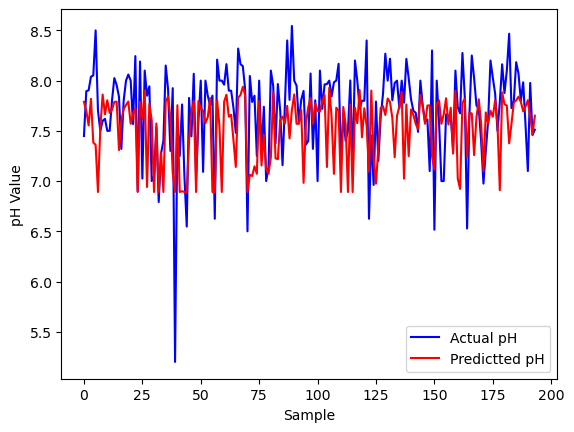

In [59]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [60]:
diff_pH = yhat_pred.flatten()- y_val

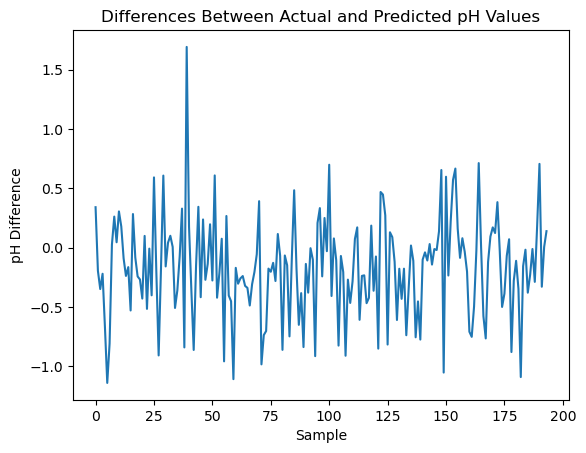

In [61]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

# ===================================

In [130]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01)
    )
    models[i].fit(
        Xn,y_train,
        batch_size=Xn.shape[0],
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
1/1 [==============================] - 2s 2s/step - loss: 59.7490
Epoch 2/1000
1/1 [==============================] - 0s 10ms/step - loss: 55.6377
Epoch 3/1000
1/1 [==============================] - 0s 9ms/step - loss: 50.0416
Epoch 4/1000
1/1 [==============================] - 0s 10ms/step - loss: 40.8923
Epoch 5/1000
1/1 [==============================] - 0s 10ms/step - loss: 28.8031
Epoch 6/1000
1/1 [==============================] - 0s 10ms/step - loss: 20.9574
Epoch 7/1000
1/1 [==============================] - 0s 9ms/step - loss: 24.3402
Epoch 8/1000
1/1 [==============================] - 0s 11ms/step - loss: 16.7611
Epoch 9/1000
1/1 [==============================] - 0s 14ms/step - loss: 9.1376
Epoch 10/1000
1/1 [==============================] - 0s 11ms/step - loss: 6.3702
Epoch 11/1000
1/1 [==============================] - 0s 10ms/step - loss: 5.8042
Epoch 12/1000
1/1 [==============================] - 0s 9ms/step - loss: 5.1625
Epoch 13/1000
1/1 [===============

1/1 [==============================] - 0s 10ms/step - loss: 0.3076
Epoch 203/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3069
Epoch 204/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.3067
Epoch 205/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.3065
Epoch 206/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.3059
Epoch 207/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3057
Epoch 208/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3055
Epoch 209/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.3050
Epoch 210/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.3048
Epoch 211/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.3045
Epoch 212/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.3040
Epoch 213/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.3038
Epoch 214/1000
1/1 [=============

1/1 [==============================] - 0s 16ms/step - loss: 0.2539
Epoch 403/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2535
Epoch 404/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2532
Epoch 405/1000
1/1 [==============================] - 0s 17ms/step - loss: 0.2529
Epoch 406/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2526
Epoch 407/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2525
Epoch 408/1000
1/1 [==============================] - 0s 16ms/step - loss: 0.2523
Epoch 409/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2522
Epoch 410/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2521
Epoch 411/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2522
Epoch 412/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2526
Epoch 413/1000
1/1 [==============================] - 0s 15ms/step - loss: 0.2535
Epoch 414/1000
1/1 [===========

1/1 [==============================] - 0s 14ms/step - loss: 0.2373
Epoch 503/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.2385
Epoch 504/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2405
Epoch 505/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2432
Epoch 506/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2468
Epoch 507/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2514
Epoch 508/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2552
Epoch 509/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2574
Epoch 510/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2547
Epoch 511/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.2489
Epoch 512/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2408
Epoch 513/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2346
Epoch 514/1000
1/1 [============

1/1 [==============================] - 0s 10ms/step - loss: 0.2225
Epoch 703/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2230
Epoch 704/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2228
Epoch 705/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2209
Epoch 706/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2183
Epoch 707/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2156
Epoch 708/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2134
Epoch 709/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2118
Epoch 710/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2109
Epoch 711/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2105
Epoch 712/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2104
Epoch 713/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2106
Epoch 714/1000
1/1 [==============

1/1 [==============================] - 0s 10ms/step - loss: 0.1991
Epoch 903/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1993
Epoch 904/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.1994
Epoch 905/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.1995
Epoch 906/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1996
Epoch 907/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1997
Epoch 908/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1999
Epoch 909/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1999
Epoch 910/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2001
Epoch 911/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2003
Epoch 912/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2007
Epoch 913/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2012
Epoch 914/1000
1/1 [=============

1/1 [==============================] - 0s 9ms/step - loss: 56.5042
Epoch 3/1000
1/1 [==============================] - 0s 12ms/step - loss: 51.2356
Epoch 4/1000
1/1 [==============================] - 0s 12ms/step - loss: 43.1831
Epoch 5/1000
1/1 [==============================] - 0s 12ms/step - loss: 34.3625
Epoch 6/1000
1/1 [==============================] - 0s 10ms/step - loss: 32.6859
Epoch 7/1000
1/1 [==============================] - 0s 10ms/step - loss: 27.7276
Epoch 8/1000
1/1 [==============================] - 0s 10ms/step - loss: 20.2698
Epoch 9/1000
1/1 [==============================] - 0s 10ms/step - loss: 15.8637
Epoch 10/1000
1/1 [==============================] - 0s 10ms/step - loss: 12.8870
Epoch 11/1000
1/1 [==============================] - 0s 11ms/step - loss: 9.4526
Epoch 12/1000
1/1 [==============================] - 0s 9ms/step - loss: 6.1450
Epoch 13/1000
1/1 [==============================] - 0s 11ms/step - loss: 4.7768
Epoch 14/1000
1/1 [=======================

1/1 [==============================] - 0s 10ms/step - loss: 0.2971
Epoch 204/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2967
Epoch 205/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2963
Epoch 206/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2960
Epoch 207/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2957
Epoch 208/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2953
Epoch 209/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2950
Epoch 210/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2947
Epoch 211/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2944
Epoch 212/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2941
Epoch 213/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2939
Epoch 214/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2936
Epoch 215/1000
1/1 [==============

1/1 [==============================] - 0s 11ms/step - loss: 0.2503
Epoch 404/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2507
Epoch 405/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2495
Epoch 406/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2478
Epoch 407/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2470
Epoch 408/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2474
Epoch 409/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2482
Epoch 410/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2484
Epoch 411/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2476
Epoch 412/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2465
Epoch 413/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2459
Epoch 414/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2460
Epoch 415/1000
1/1 [==============

1/1 [==============================] - 0s 8ms/step - loss: 0.2210
Epoch 604/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2190
Epoch 605/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2199
Epoch 606/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2223
Epoch 607/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2242
Epoch 608/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2247
Epoch 609/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2233
Epoch 610/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2212
Epoch 611/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2191
Epoch 612/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2181
Epoch 613/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2182
Epoch 614/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2191
Epoch 615/1000
1/1 [=============

1/1 [==============================] - 0s 11ms/step - loss: 0.2222
Epoch 804/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2203
Epoch 805/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2176
Epoch 806/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2121
Epoch 807/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2070
Epoch 808/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2029
Epoch 809/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2013
Epoch 810/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2021
Epoch 811/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2044
Epoch 812/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2076
Epoch 813/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2109
Epoch 814/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.2148
Epoch 815/1000
1/1 [================

1/1 [==============================] - 0s 12ms/step - loss: 50.3884
Epoch 4/1000
1/1 [==============================] - 0s 12ms/step - loss: 42.4526
Epoch 5/1000
1/1 [==============================] - 0s 12ms/step - loss: 34.2263
Epoch 6/1000
1/1 [==============================] - 0s 10ms/step - loss: 29.5390
Epoch 7/1000
1/1 [==============================] - 0s 10ms/step - loss: 22.0413
Epoch 8/1000
1/1 [==============================] - 0s 13ms/step - loss: 13.3173
Epoch 9/1000
1/1 [==============================] - 0s 12ms/step - loss: 7.4952
Epoch 10/1000
1/1 [==============================] - 0s 13ms/step - loss: 4.8025
Epoch 11/1000
1/1 [==============================] - 0s 11ms/step - loss: 4.1071
Epoch 12/1000
1/1 [==============================] - 0s 11ms/step - loss: 3.8375
Epoch 13/1000
1/1 [==============================] - 0s 10ms/step - loss: 3.5705
Epoch 14/1000
1/1 [==============================] - 0s 10ms/step - loss: 3.4150
Epoch 15/1000
1/1 [=======================

1/1 [==============================] - 0s 10ms/step - loss: 0.2926
Epoch 205/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2923
Epoch 206/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2920
Epoch 207/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2917
Epoch 208/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2914
Epoch 209/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2911
Epoch 210/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2908
Epoch 211/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2905
Epoch 212/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2902
Epoch 213/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.2899
Epoch 214/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2897
Epoch 215/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2894
Epoch 216/1000
1/1 [============

1/1 [==============================] - 0s 11ms/step - loss: 0.2666
Epoch 305/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2668
Epoch 306/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.2674
Epoch 307/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2679
Epoch 308/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2676
Epoch 309/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2666
Epoch 310/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2656
Epoch 311/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2649
Epoch 312/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2646
Epoch 313/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2646
Epoch 314/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2648
Epoch 315/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2651
Epoch 316/1000
1/1 [===========

1/1 [==============================] - 0s 11ms/step - loss: 0.2332
Epoch 505/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2292
Epoch 506/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2271
Epoch 507/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2264
Epoch 508/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2269
Epoch 509/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2284
Epoch 510/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2305
Epoch 511/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2336
Epoch 512/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2369
Epoch 513/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2414
Epoch 514/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2443
Epoch 515/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2481
Epoch 516/1000
1/1 [============

1/1 [==============================] - 0s 13ms/step - loss: 0.2079
Epoch 705/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2078
Epoch 706/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2077
Epoch 707/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2076
Epoch 708/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2075
Epoch 709/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2074
Epoch 710/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2074
Epoch 711/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2072
Epoch 712/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2072
Epoch 713/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2071
Epoch 714/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2070
Epoch 715/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2069
Epoch 716/1000
1/1 [===========

1/1 [==============================] - 0s 11ms/step - loss: 0.2005
Epoch 805/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2005
Epoch 806/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2005
Epoch 807/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2004
Epoch 808/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2002
Epoch 809/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2000
Epoch 810/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.1999
Epoch 811/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1998
Epoch 812/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.1998
Epoch 813/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1997
Epoch 814/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1997
Epoch 815/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1996
Epoch 816/1000
1/1 [===========

1/1 [==============================] - 0s 11ms/step - loss: 0.1947
Epoch 905/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1945
Epoch 906/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1943
Epoch 907/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1941
Epoch 908/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1940
Epoch 909/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.1939
Epoch 910/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.1939
Epoch 911/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1939
Epoch 912/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.1938
Epoch 913/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1938
Epoch 914/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1938
Epoch 915/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1938
Epoch 916/1000
1/1 [===========

1/1 [==============================] - 0s 11ms/step - loss: 0.3478
Epoch 105/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.3470
Epoch 106/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.3463
Epoch 107/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3455
Epoch 108/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.3448
Epoch 109/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3441
Epoch 110/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3434
Epoch 111/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3427
Epoch 112/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3420
Epoch 113/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.3414
Epoch 114/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.3407
Epoch 115/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.3400
Epoch 116/1000
1/1 [===========

1/1 [==============================] - 0s 13ms/step - loss: 0.2975
Epoch 205/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2971
Epoch 206/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2967
Epoch 207/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2963
Epoch 208/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2959
Epoch 209/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2955
Epoch 210/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2951
Epoch 211/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2948
Epoch 212/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.2944
Epoch 213/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2940
Epoch 214/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2937
Epoch 215/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2934
Epoch 216/1000
1/1 [===========

1/1 [==============================] - 0s 13ms/step - loss: 0.2773
Epoch 305/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2755
Epoch 306/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2673
Epoch 307/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2654
Epoch 308/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2703
Epoch 309/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2717
Epoch 310/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2675
Epoch 311/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2636
Epoch 312/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2643
Epoch 313/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2674
Epoch 314/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2678
Epoch 315/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2652
Epoch 316/1000
1/1 [===========

1/1 [==============================] - 0s 11ms/step - loss: 0.2417
Epoch 405/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2409
Epoch 406/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2403
Epoch 407/1000
1/1 [==============================] - 0s 8ms/step - loss: 0.2399
Epoch 408/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2396
Epoch 409/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2394
Epoch 410/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2393
Epoch 411/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2392
Epoch 412/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2394
Epoch 413/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2398
Epoch 414/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2407
Epoch 415/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2425
Epoch 416/1000
1/1 [==============

1/1 [==============================] - 0s 11ms/step - loss: 0.2109
Epoch 605/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2112
Epoch 606/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2118
Epoch 607/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2121
Epoch 608/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2122
Epoch 609/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2118
Epoch 610/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2111
Epoch 611/1000
1/1 [==============================] - 0s 36ms/step - loss: 0.2104
Epoch 612/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2100
Epoch 613/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2100
Epoch 614/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.2101
Epoch 615/1000
1/1 [==============================] - 0s 22ms/step - loss: 0.2103
Epoch 616/1000
1/1 [============

1/1 [==============================] - 0s 10ms/step - loss: 0.1959
Epoch 805/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.1961
Epoch 806/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.1967
Epoch 807/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1977
Epoch 808/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.1989
Epoch 809/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2003
Epoch 810/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2019
Epoch 811/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2039
Epoch 812/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2064
Epoch 813/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2091
Epoch 814/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2125
Epoch 815/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2159
Epoch 816/1000
1/1 [============

1/1 [==============================] - 0s 11ms/step - loss: 28.3265
Epoch 5/1000
1/1 [==============================] - 0s 11ms/step - loss: 26.2571
Epoch 6/1000
1/1 [==============================] - 0s 10ms/step - loss: 17.0819
Epoch 7/1000
1/1 [==============================] - 0s 10ms/step - loss: 10.0549
Epoch 8/1000
1/1 [==============================] - 0s 10ms/step - loss: 7.1612
Epoch 9/1000
1/1 [==============================] - 0s 10ms/step - loss: 5.3490
Epoch 10/1000
1/1 [==============================] - 0s 11ms/step - loss: 3.9527
Epoch 11/1000
1/1 [==============================] - 0s 13ms/step - loss: 3.7646
Epoch 12/1000
1/1 [==============================] - 0s 11ms/step - loss: 3.3717
Epoch 13/1000
1/1 [==============================] - 0s 10ms/step - loss: 2.5015
Epoch 14/1000
1/1 [==============================] - 0s 11ms/step - loss: 2.3061
Epoch 15/1000
1/1 [==============================] - 0s 10ms/step - loss: 2.1622
Epoch 16/1000
1/1 [========================

1/1 [==============================] - 0s 12ms/step - loss: 0.2945
Epoch 206/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2942
Epoch 207/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2940
Epoch 208/1000
1/1 [==============================] - 0s 19ms/step - loss: 0.2935
Epoch 209/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2931
Epoch 210/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2926
Epoch 211/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2920
Epoch 212/1000
1/1 [==============================] - 0s 20ms/step - loss: 0.2913
Epoch 213/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2907
Epoch 214/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2901
Epoch 215/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2895
Epoch 216/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2890
Epoch 217/1000
1/1 [===========

1/1 [==============================] - 0s 11ms/step - loss: 0.2650
Epoch 406/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2594
Epoch 407/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2503
Epoch 408/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2458
Epoch 409/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2487
Epoch 410/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2543
Epoch 411/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2558
Epoch 412/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2526
Epoch 413/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2473
Epoch 414/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2447
Epoch 415/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2460
Epoch 416/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2488
Epoch 417/1000
1/1 [=============

1/1 [==============================] - 0s 10ms/step - loss: 0.2212
Epoch 606/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2211
Epoch 607/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2212
Epoch 608/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2213
Epoch 609/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2215
Epoch 610/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2216
Epoch 611/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2218
Epoch 612/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2221
Epoch 613/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2224
Epoch 614/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2230
Epoch 615/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2236
Epoch 616/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2247
Epoch 617/1000
1/1 [============

1/1 [==============================] - 0s 11ms/step - loss: 0.2070
Epoch 806/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2114
Epoch 807/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2190
Epoch 808/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2301
Epoch 809/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2483
Epoch 810/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2674
Epoch 811/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2834
Epoch 812/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.2635
Epoch 813/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.2314
Epoch 814/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.2076
Epoch 815/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.2197
Epoch 816/1000
1/1 [==============================] - 0s 11ms/step - loss: 0.2431
Epoch 817/1000
1/1 [============

In [131]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [132]:
MSE_pred

[0.1574606061326772,
 0.17667189395926586,
 0.19800573642674713,
 0.15335131275586644,
 0.15792129177486258]

In [133]:
MSE_train

[0.14120692889683462,
 0.1624720193717211,
 0.1407441885646297,
 0.1421566982914076,
 0.14656733536304675]

In [134]:
yhat_pred

array([[7.739539 ],
       [7.886243 ],
       [7.5972843],
       [7.773695 ],
       [7.710055 ],
       [7.7116213],
       [6.880022 ],
       [7.7046766],
       [8.0245   ],
       [7.856986 ],
       [7.7151484],
       [7.975602 ],
       [7.8522787],
       [7.6914973],
       [8.026492 ],
       [7.4758415],
       [7.097512 ],
       [7.8501635],
       [7.8991127],
       [8.026849 ],
       [7.5939636],
       [7.852904 ],
       [7.7999477],
       [7.085306 ],
       [7.855234 ],
       [7.774581 ],
       [7.8964696],
       [7.443646 ],
       [7.9402485],
       [7.783992 ],
       [7.087755 ],
       [7.7732925],
       [7.1272664],
       [7.396959 ],
       [6.8398285],
       [7.8906007],
       [8.001648 ],
       [7.7789974],
       [7.6396503],
       [6.762952 ],
       [7.918408 ],
       [6.898786 ],
       [7.3340664],
       [7.1076365],
       [6.8641863],
       [7.700526 ],
       [7.75206  ],
       [7.7583885],
       [7.206072 ],
       [7.8293314],


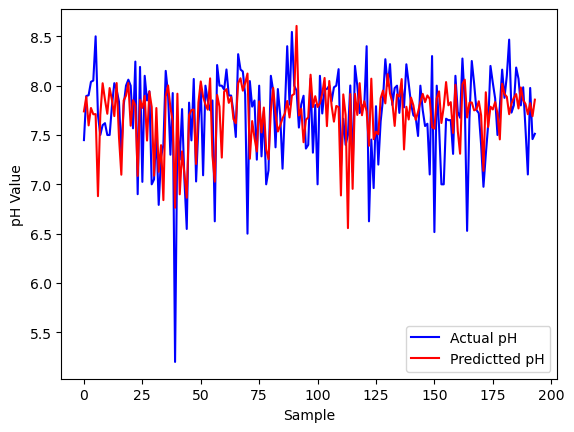

In [135]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [136]:
diff_pH = yhat_pred.flatten()- y_val

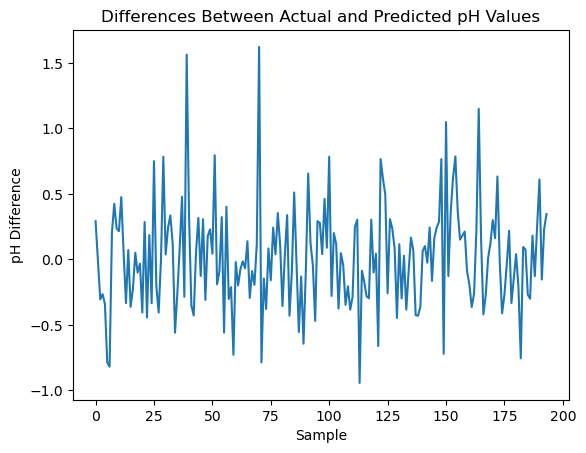

In [137]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [113]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 3s 4ms/step - loss: 50.2749
Epoch 2/1000
25/25 [==============================] - 0s 4ms/step - loss: 7.8330
Epoch 3/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.1441
Epoch 4/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.7511
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.5053
Epoch 6/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.4235
Epoch 7/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.4160
Epoch 8/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3929
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3807
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4004
Epoch 11/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.3852
Epoch 12/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.3880
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2672
Epoch 102/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.3212
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2651
Epoch 104/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2279
Epoch 105/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3023
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2610
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2477
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2784
Epoch 109/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2334
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2493
Epoch 111/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2186
Epoch 112/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2206
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 0.2005
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2183
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2076
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2059
Epoch 301/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1869
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2138
Epoch 303/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2182
Epoch 304/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2029
Epoch 305/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1994
Epoch 306/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2460
Epoch 307/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2091
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2042
Epoch 309/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1861
Epoch 494/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1884
Epoch 495/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1842
Epoch 496/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1963
Epoch 497/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1861
Epoch 498/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1952
Epoch 499/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1973
Epoch 500/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2500
Epoch 501/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2076
Epoch 502/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1989
Epoch 503/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1905
Epoch 504/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1951
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2065
Epoch 690/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2007
Epoch 691/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1937
Epoch 692/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1915
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1884
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1868
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1892
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1876
Epoch 697/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1889
Epoch 698/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2022
Epoch 699/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1960
Epoch 700/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2093
Epoch 701/1000
25/2

KeyboardInterrupt: 

In [187]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [188]:
MSE_pred

[0.21314077540071547,
 0.29407216011229714,
 0.2025048861683187,
 0.19674805098609388,
 0.23473494536390832]

In [189]:
MSE_train

[0.18103158774708272,
 0.2401026328872432,
 0.17966637777896705,
 0.16558104505037546,
 0.19540864894473767]

In [190]:
yhat_pred

array([[7.6656427],
       [7.610238 ],
       [7.441615 ],
       [7.649664 ],
       [7.260894 ],
       [7.314662 ],
       [6.864362 ],
       [7.389765 ],
       [7.7967463],
       [7.6858807],
       [7.7794666],
       [7.722558 ],
       [7.5949936],
       [7.653945 ],
       [7.696083 ],
       [7.1192703],
       [7.038704 ],
       [7.7662144],
       [7.592762 ],
       [7.8042116],
       [7.385071 ],
       [7.56658  ],
       [7.6104364],
       [6.864362 ],
       [7.5743284],
       [7.528658 ],
       [7.7405148],
       [6.881465 ],
       [7.69226  ],
       [7.611973 ],
       [6.864362 ],
       [7.681114 ],
       [6.864362 ],
       [6.8972635],
       [6.864362 ],
       [7.6910725],
       [7.7830267],
       [7.5525303],
       [7.009572 ],
       [6.864362 ],
       [7.65783  ],
       [6.864362 ],
       [6.868991 ],
       [6.864362 ],
       [6.864362 ],
       [7.1750927],
       [7.6755543],
       [7.6269073],
       [6.8745165],
       [7.743375 ],


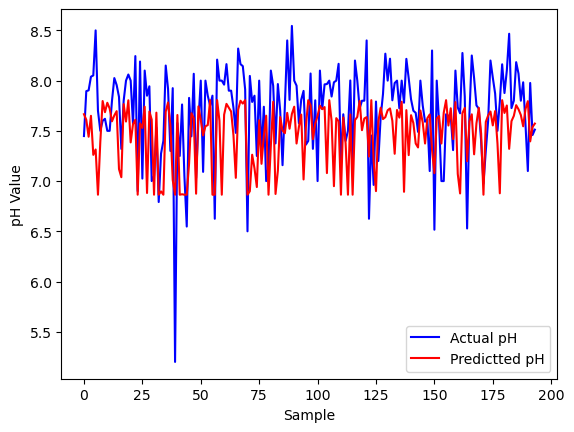

In [191]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [192]:
diff_pH = yhat_pred.flatten()- y_val

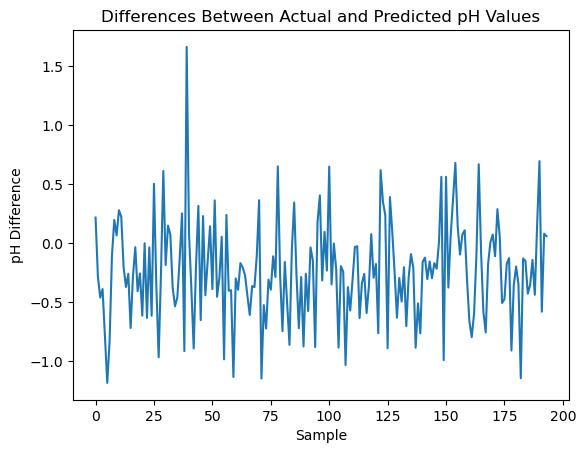

In [193]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [194]:
lamdas = [0.001, 0.001, 0.001, 0.001, 0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    tf.random.set_seed(1234)
    models[i] = Sequential(
        [
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(40, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(100, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(20, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 3s 4ms/step - loss: 14.3991
Epoch 2/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.0536
Epoch 3/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.8319
Epoch 4/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.6229
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4653
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4465
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4520
Epoch 8/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4376
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4444
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.5114
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4218
Epoch 12/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4118
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2599
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2650
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2559
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2167
Epoch 105/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2279
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2176
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2187
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2388
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2350
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2159
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2183
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2310
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 0.2033
Epoch 298/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1942
Epoch 299/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1947
Epoch 300/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1969
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1855
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1986
Epoch 303/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1930
Epoch 304/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1906
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1996
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2409
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2414
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2076
Epoch 309/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1953
Epoch 494/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1889
Epoch 495/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1829
Epoch 496/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1969
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1967
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1902
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1965
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2760
Epoch 501/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2685
Epoch 502/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2520
Epoch 503/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2543
Epoch 504/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2538
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1852
Epoch 690/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1907
Epoch 691/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1922
Epoch 692/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1848
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1884
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1822
Epoch 695/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1812
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1981
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1986
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2021
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.1970
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2320
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1848
Epoch 886/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1903
Epoch 887/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1825
Epoch 888/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1948
Epoch 889/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1823
Epoch 890/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1961
Epoch 891/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2133
Epoch 892/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1971
Epoch 893/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2051
Epoch 894/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1841
Epoch 895/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1766
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1888
Epoch 897/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2814
Epoch 83/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3211
Epoch 84/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3122
Epoch 85/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2987
Epoch 86/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2906
Epoch 87/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3289
Epoch 88/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2774
Epoch 89/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2748
Epoch 90/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2676
Epoch 91/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2799
Epoch 92/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2911
Epoch 93/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2713
Epoch 94/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.1991
Epoch 182/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2001
Epoch 183/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2682
Epoch 184/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.3276
Epoch 185/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2440
Epoch 186/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2045
Epoch 187/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2265
Epoch 188/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2004
Epoch 189/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2042
Epoch 190/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2116
Epoch 191/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2175
Epoch 192/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.2063
Epoch 193/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1940
Epoch 378/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1975
Epoch 379/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1928
Epoch 380/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1963
Epoch 381/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2091
Epoch 382/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1903
Epoch 383/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1870
Epoch 384/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2165
Epoch 385/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1996
Epoch 386/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2074
Epoch 387/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2094
Epoch 388/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1845
Epoch 389/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1858
Epoch 574/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2617
Epoch 575/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2163
Epoch 576/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1985
Epoch 577/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2044
Epoch 578/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1842
Epoch 579/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1931
Epoch 580/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1781
Epoch 581/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2282
Epoch 582/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1845
Epoch 583/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1806
Epoch 584/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2045
Epoch 585/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1755
Epoch 770/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1898
Epoch 771/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1826
Epoch 772/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2159
Epoch 773/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1843
Epoch 774/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2058
Epoch 775/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1909
Epoch 776/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1877
Epoch 777/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1854
Epoch 778/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1822
Epoch 779/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1953
Epoch 780/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1967
Epoch 781/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1806
Epoch 966/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1805
Epoch 967/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1795
Epoch 968/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1890
Epoch 969/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1888
Epoch 970/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1895
Epoch 971/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1817
Epoch 972/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1771
Epoch 973/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1832
Epoch 974/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1894
Epoch 975/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1979
Epoch 976/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2074
Epoch 977/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2076
Epoch 164/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2142
Epoch 165/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2258
Epoch 166/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2168
Epoch 167/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2022
Epoch 168/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2061
Epoch 169/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2195
Epoch 170/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2091
Epoch 171/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2109
Epoch 172/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2432
Epoch 173/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2247
Epoch 174/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2211
Epoch 175/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 0.1931
Epoch 360/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1885
Epoch 361/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1966
Epoch 362/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2200
Epoch 363/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1901
Epoch 364/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2025
Epoch 365/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1844
Epoch 366/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2155
Epoch 367/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2155
Epoch 368/1000
25/25 [==============================] - 0s 5ms/step - loss: 0.1882
Epoch 369/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1887
Epoch 370/1000
25/25 [==============================] - 0s 7ms/step - loss: 0.1894
Epoch 371/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1930
Epoch 556/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1888
Epoch 557/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1893
Epoch 558/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1803
Epoch 559/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1844
Epoch 560/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1823
Epoch 561/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1827
Epoch 562/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1920
Epoch 563/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1837
Epoch 564/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1968
Epoch 565/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2007
Epoch 566/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1809
Epoch 567/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 0.1869
Epoch 752/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1854
Epoch 753/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1828
Epoch 754/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1997
Epoch 755/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2001
Epoch 756/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1964
Epoch 757/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1832
Epoch 758/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1874
Epoch 759/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1995
Epoch 760/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1918
Epoch 761/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1919
Epoch 762/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1858
Epoch 763/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 0.1874
Epoch 948/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1935
Epoch 949/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1830
Epoch 950/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1882
Epoch 951/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1915
Epoch 952/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2009
Epoch 953/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1873
Epoch 954/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1797
Epoch 955/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1829
Epoch 956/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1813
Epoch 957/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2118
Epoch 958/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2143
Epoch 959/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2496
Epoch 146/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2300
Epoch 147/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2264
Epoch 148/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2572
Epoch 149/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2490
Epoch 150/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2307
Epoch 151/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2160
Epoch 152/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2036
Epoch 153/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2480
Epoch 154/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2325
Epoch 155/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2514
Epoch 156/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1989
Epoch 157/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1881
Epoch 342/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2030
Epoch 343/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1938
Epoch 344/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2103
Epoch 345/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2064
Epoch 346/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1944
Epoch 347/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1997
Epoch 348/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1995
Epoch 349/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1937
Epoch 350/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1997
Epoch 351/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2212
Epoch 352/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2185
Epoch 353/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2070
Epoch 538/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1873
Epoch 539/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2038
Epoch 540/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1981
Epoch 541/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1975
Epoch 542/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1941
Epoch 543/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1865
Epoch 544/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1936
Epoch 545/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2208
Epoch 546/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2029
Epoch 547/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1901
Epoch 548/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2022
Epoch 549/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1899
Epoch 734/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1890
Epoch 735/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2058
Epoch 736/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1964
Epoch 737/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2029
Epoch 738/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1891
Epoch 739/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1886
Epoch 740/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1907
Epoch 741/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1987
Epoch 742/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1945
Epoch 743/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1932
Epoch 744/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1868
Epoch 745/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2088
Epoch 930/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2043
Epoch 931/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2013
Epoch 932/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1908
Epoch 933/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1868
Epoch 934/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1906
Epoch 935/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1906
Epoch 936/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2471
Epoch 937/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2144
Epoch 938/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1899
Epoch 939/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1840
Epoch 940/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1920
Epoch 941/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.3967
Epoch 29/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4403
Epoch 30/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3495
Epoch 31/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.4155
Epoch 32/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3473
Epoch 33/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3471
Epoch 34/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3701
Epoch 35/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3390
Epoch 36/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3291
Epoch 37/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3706
Epoch 38/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3510
Epoch 39/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.3240
Epoch 40/1000
25/25 [=========

25/25 [==============================] - 0s 3ms/step - loss: 0.2197
Epoch 226/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2140
Epoch 227/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2058
Epoch 228/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2022
Epoch 229/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2175
Epoch 230/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2095
Epoch 231/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2022
Epoch 232/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2037
Epoch 233/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1924
Epoch 234/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1961
Epoch 235/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2674
Epoch 236/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2003
Epoch 237/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2153
Epoch 422/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2447
Epoch 423/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1923
Epoch 424/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2054
Epoch 425/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1921
Epoch 426/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2350
Epoch 427/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1960
Epoch 428/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1864
Epoch 429/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1870
Epoch 430/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1851
Epoch 431/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1831
Epoch 432/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1895
Epoch 433/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.1811
Epoch 618/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1937
Epoch 619/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1951
Epoch 620/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2190
Epoch 621/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1849
Epoch 622/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2148
Epoch 623/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1843
Epoch 624/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1913
Epoch 625/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1851
Epoch 626/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1846
Epoch 627/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1828
Epoch 628/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1999
Epoch 629/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.2935
Epoch 814/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2382
Epoch 815/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2030
Epoch 816/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1918
Epoch 817/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1893
Epoch 818/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1923
Epoch 819/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.2057
Epoch 820/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1827
Epoch 821/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.1839
Epoch 822/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1816
Epoch 823/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1879
Epoch 824/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1881
Epoch 825/1000
25/2

In [195]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [196]:
MSE_pred

[0.19504504910549023,
 0.2245776761573823,
 0.21653289070957593,
 0.2277420003366302,
 0.1991861056285097]

In [197]:
MSE_train

[0.16775896983061517,
 0.18706451626825338,
 0.18334736867952295,
 0.1941391490568728,
 0.17826400846004814]

In [198]:
yhat_pred

array([[7.747503 ],
       [7.6718388],
       [7.5452657],
       [7.7221785],
       [7.449066 ],
       [7.4541283],
       [6.8783593],
       [7.4545584],
       [7.859406 ],
       [7.7909803],
       [7.850462 ],
       [7.732921 ],
       [7.6633816],
       [7.721194 ],
       [7.724469 ],
       [7.3645296],
       [6.8783593],
       [7.820705 ],
       [7.6147585],
       [7.8163366],
       [7.5314565],
       [7.6010103],
       [7.671178 ],
       [6.8783593],
       [7.5908346],
       [7.505255 ],
       [7.8289366],
       [6.9848228],
       [7.740364 ],
       [7.619373 ],
       [6.8783593],
       [7.7757316],
       [6.8783593],
       [6.9049225],
       [6.8783593],
       [7.779758 ],
       [7.838129 ],
       [7.6197147],
       [7.1630173],
       [6.8783593],
       [7.7029757],
       [6.8783593],
       [6.910985 ],
       [6.8783593],
       [6.8783593],
       [7.4215174],
       [7.7432127],
       [7.7011304],
       [6.880554 ],
       [7.8013964],


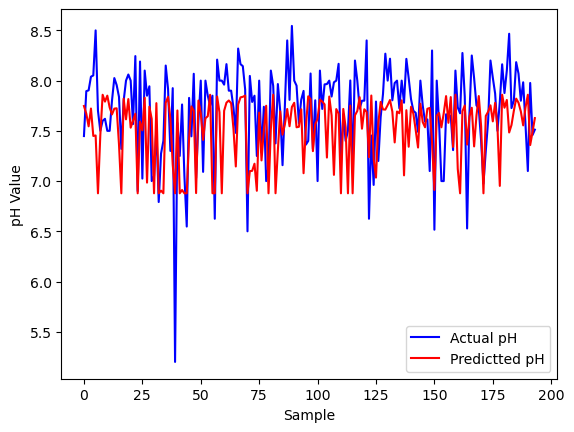

In [199]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [200]:
diff_pH = yhat_pred.flatten() - y_val

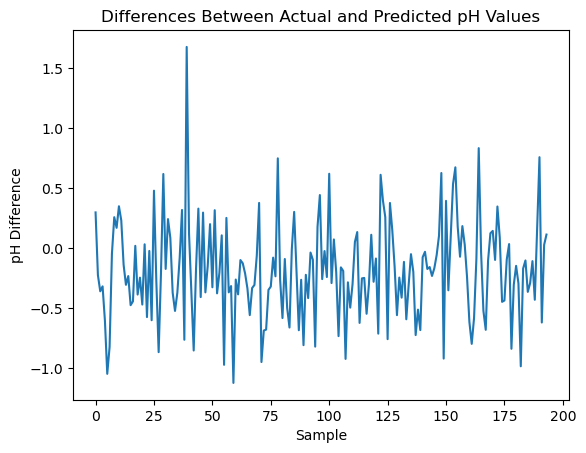

In [201]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

#### Getting Nitrate Value

In [132]:
X = df.loc[:,['Temperature','D.O','pH','Conductivity','B.O.D','Totalcaliform']]

In [133]:
X.head()

,Temperature,D.O,pH,Conductivity,B.O.D,Totalcaliform
0,9.0,9.0,8.0,85.0,0.1,397.0
1,10.0,9.0,8.0,102.0,0.3,954.0
2,11.0,9.0,8.0,96.0,0.2,653.0
3,13.0,9.0,8.0,94.0,0.2,317.0
4,14.0,10.0,8.0,112.0,0.2,1072.0


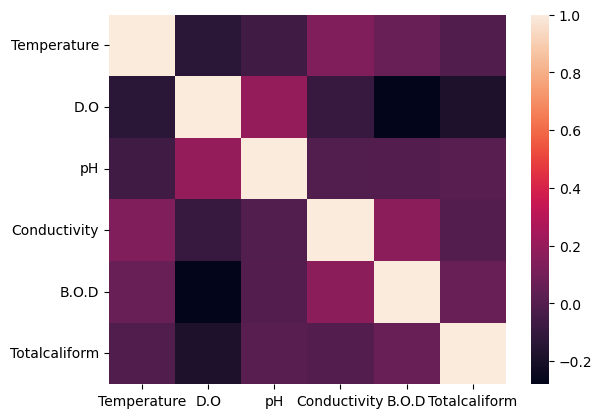

In [134]:
sns.heatmap(X.corr());

In [135]:
y = df_new['Nitrate']

In [136]:
y.value_counts()

Nitrate
4.000000     42
3.000000     41
1.380000     34
2.000000     27
1.711670     19
             ..
2.842445      1
2.806900      1
1.875483      1
1.888775      1
30.000000     1
Name: count, Length: 674, dtype: int64

In [137]:
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size = 0.8, random_state = 123)

In [138]:
X_train.shape

(773, 6)

In [139]:
y_train.shape

(773,)

In [140]:
X_val.shape

(194, 6)

In [141]:
min_samples_split_list = [2,10, 30, 50, 100, 200, 300, 700, 1000, 1200, 1500]

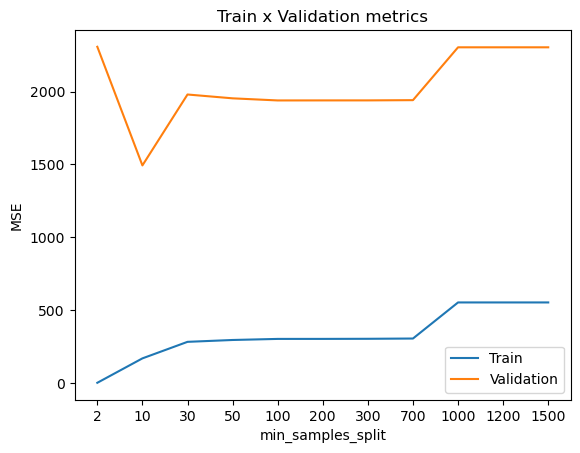

In [212]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [213]:
min_samples_split_list = np.arange(2,30)

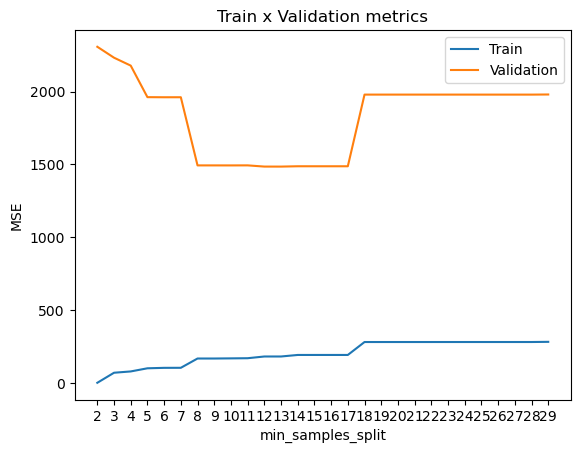

In [214]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [215]:
min_samples_split_list = np.arange(7,20)

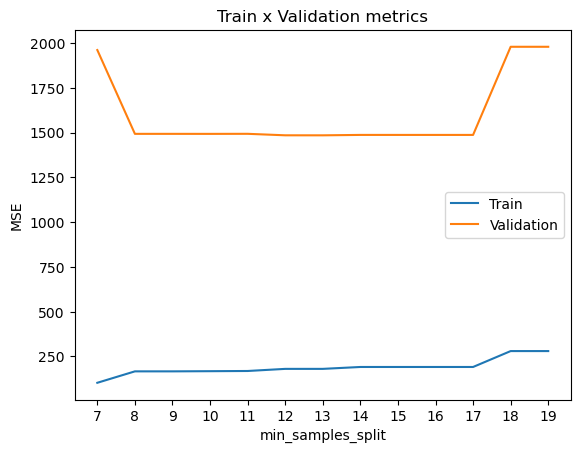

In [216]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [217]:
ind_min_samp_split = np.argmin(MSE_list_val)
ind_min_samp_split

6

In [218]:
best_min_samp_split = min_samples_split_list[ind_min_samp_split]
best_min_samp_split

13

In [219]:
max_depth_list = [1,2, 3, 4, 8, 16, 32, 64, None]

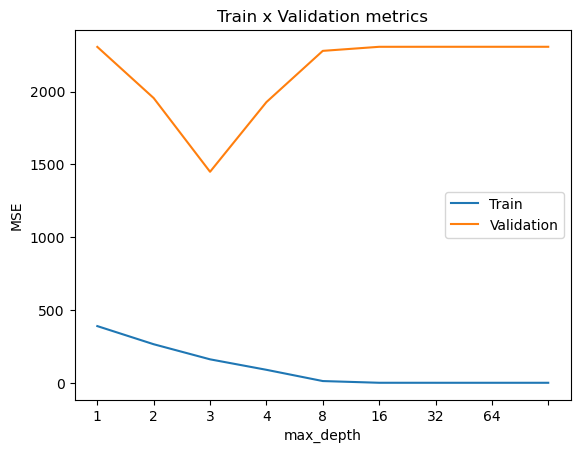

In [220]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = DecisionTreeRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

    Chosen max_depth = 3
    Chosen min_samples_split = 13

In [142]:
decision_tree_nitr_model = DecisionTreeRegressor(min_samples_split = 13,
                                             max_depth = 3,
                                             random_state = 123).fit(X_train,y_train)

In [143]:
print(f"MSE for train:\n\tMSE: {MSE(decision_tree_nitr_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(decision_tree_nitr_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 215.4973
MSE for validation:
	MSE: 1449.2868


In [144]:
y_pred_nitr = decision_tree_nitr_model.predict(X_val)

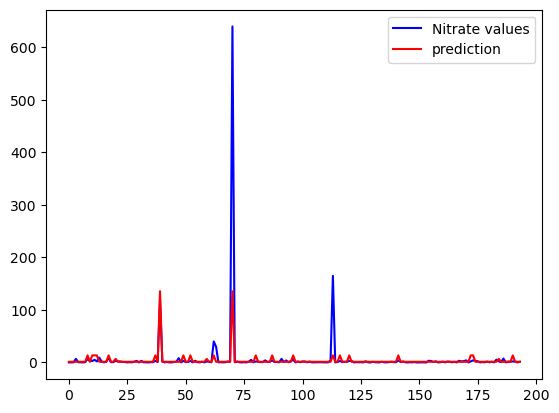

In [145]:
plt.plot(range(len(y_val)),y_val,'b',label='Nitrate values')
plt.plot(range(len(y_pred_nitr)),y_pred_nitr,'r',label='prediction')
plt.legend(loc='best');

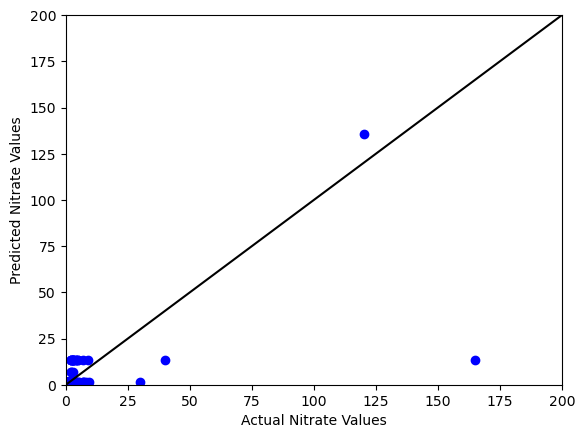

In [146]:
plt.scatter(y_val, y_pred_nitr, c='b')
plt.plot([0,200], [0,200], 'k')
plt.xlim([0, 200])
plt.ylim([0, 200])
plt.xlabel('Actual Nitrate Values')
plt.ylabel('Predicted Nitrate Values');

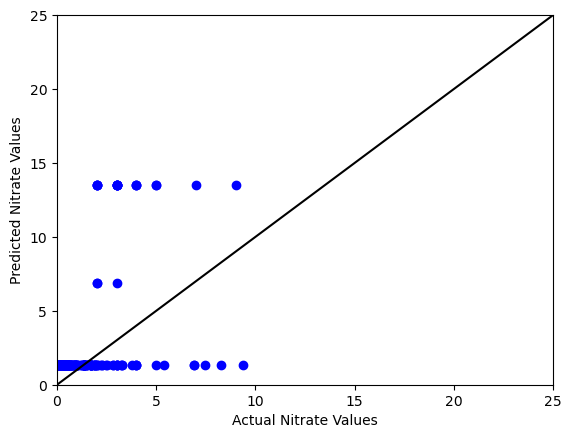

In [147]:
plt.scatter(y_val, y_pred_nitr, c='b')
plt.plot([0,25], [0,25], 'k')
plt.xlim([0, 25])
plt.ylim([0, 25])
plt.xlabel('Actual Nitrate Values')
plt.ylabel('Predicted Nitrate Values');

In [148]:
diff_nitr = y_pred_nitr - y_val

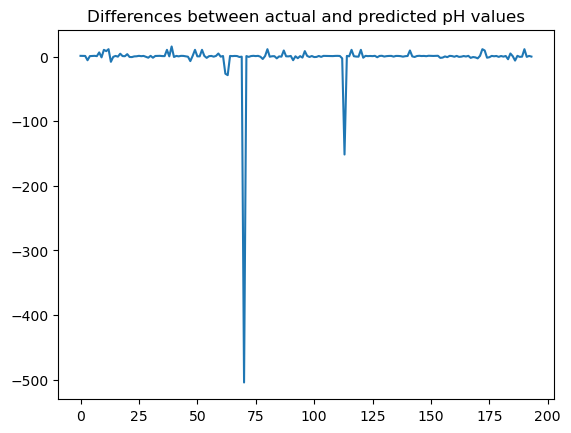

In [149]:
plt.plot(range(len(diff_nitr)),diff_nitr)
plt.title('Differences between actual and predicted pH values');

In [150]:
decision_tree_nitr_model.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 13,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 123,
 'splitter': 'best'}

In [228]:
degree_list = np.arange(1,5)

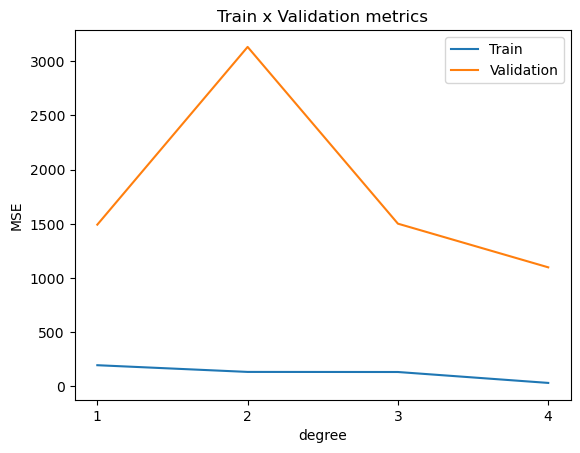

In [229]:
MSE_list_train = []
MSE_list_val = []
for degree in degree_list:
    transformer = PolynomialFeatures(degree).fit(X_train)
    X_poly = transformer.transform(X_train)
    X_poly = X_poly[:,1:]
    model = DecisionTreeRegressor(min_samples_split = 10,
                                  max_depth = 6,
                                  random_state = 123).fit(X_poly,y_train) 
    predictions_train = model.predict(X_poly)
    X_val_poly = transformer.transform(X_val)
    X_val_poly = X_val_poly[:,1:]
    predictions_val = model.predict(X_val_poly)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('degree')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(degree_list )),labels=degree_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [230]:
MSE_list_val

[1492.5582918562636,
 3132.1135956094645,
 1501.5706671397156,
 1098.8503438678115]

In [231]:
min_samples_split_list = [2,10, 30, 50, 100, 200, 300, 700, 1000, 1200, 1500, 2000]

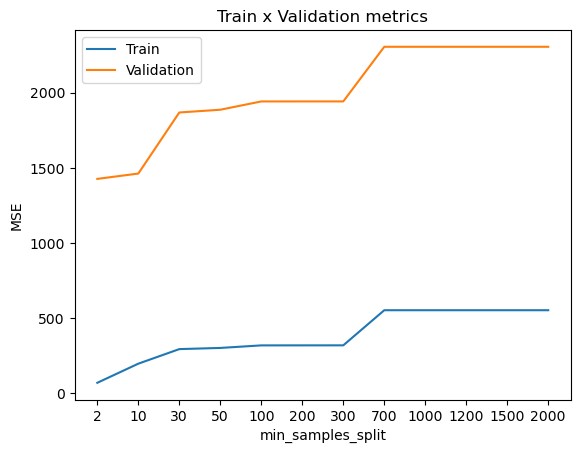

In [232]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = RandomForestRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list) 
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [233]:
min_samples_split_list = np.arange(2,11)

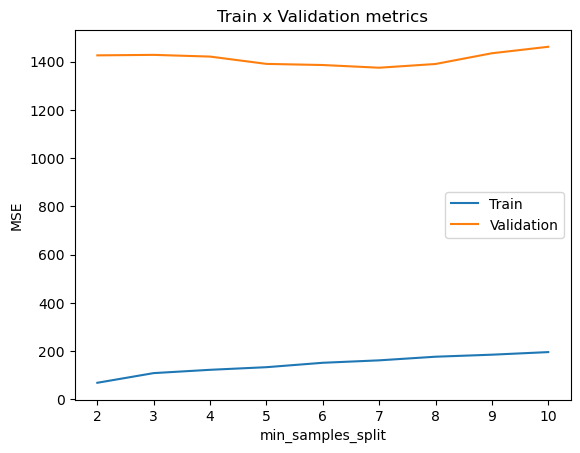

In [234]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = RandomForestRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list) 
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [235]:
ind_min_samp_split = np.argmin(MSE_list_val)
ind_min_samp_split

5

In [236]:
best_min_samp_split = min_samples_split_list[ind_min_samp_split]
best_min_samp_split

7

In [237]:
max_depth_list = [2, 4, 8, 16, 32, 64, None]

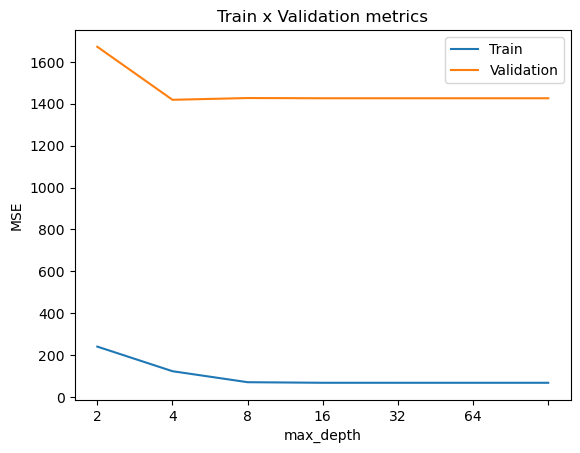

In [238]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = RandomForestRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [239]:
MSE_list_val

[1670.9898320871157,
 1418.2308339379058,
 1426.6334886784455,
 1425.602448664635,
 1425.594997712932,
 1425.5953247611526,
 1425.5953247611526]

In [240]:
max_depth_list = np.arange(8,33)

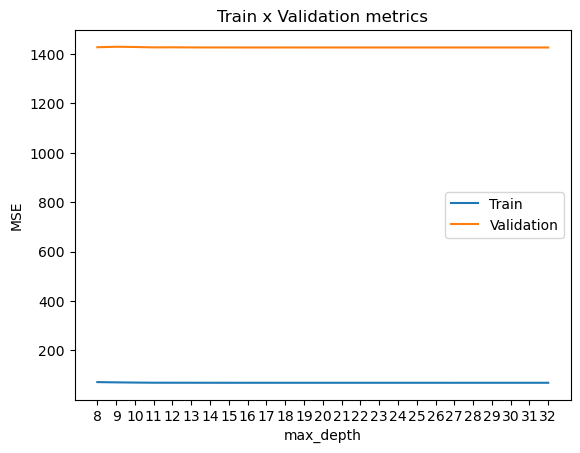

In [241]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = RandomForestRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [242]:
ind_max_depth = np.argmin(MSE_list_val)
ind_max_depth

17

In [243]:
best_max_depth = max_depth_list[ind_max_depth]
best_max_depth

25

In [244]:
n_estimators_list = [10,50,100,500,1000,2000]

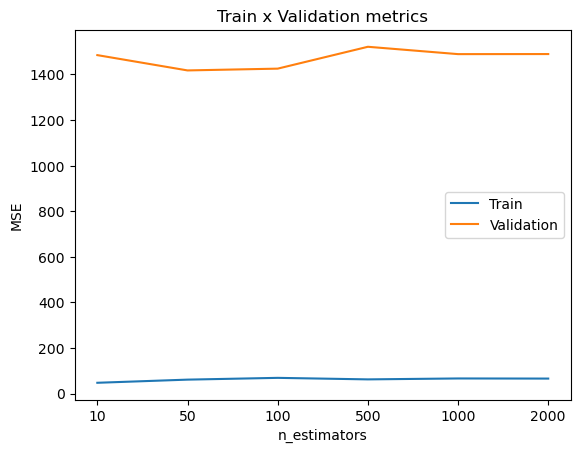

In [245]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [246]:
n_estimators_list = np.arange(10,100,5)

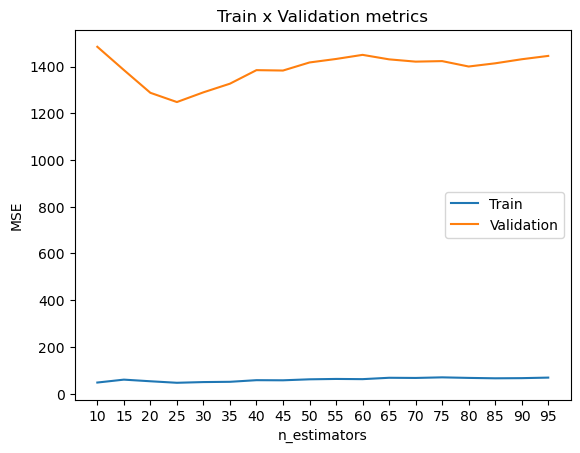

In [247]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [248]:
MSE_list_val

[1484.8966722670145,
 1385.511131178504,
 1287.9075817728335,
 1248.3109864643377,
 1289.9177863799018,
 1326.9351763773477,
 1384.886591109946,
 1383.1919447016583,
 1417.7652094019156,
 1432.7292065239926,
 1450.3241065725535,
 1431.0775883567862,
 1421.3187788552707,
 1423.5615926606724,
 1400.4292000258395,
 1414.1197566715973,
 1431.514089288314,
 1445.8430953609154]

In [249]:
ind_n_estimators = np.argmin(MSE_list_val)
ind_n_estimators

3

In [250]:
best_n_estimators = n_estimators_list[ind_n_estimators]
best_n_estimators

25

    Chosen max_depth = 25
    Chosen n_estimators = 25
    Chosen min_samples_split = 7

In [151]:
random_forest_nitr_model = RandomForestRegressor(n_estimators = 25,
                                             max_depth = 25, 
                                             min_samples_split = 7).fit(X_train,y_train)

In [152]:
print(f"MSE for train:\n\tMSE: {MSE(random_forest_nitr_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(random_forest_nitr_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 165.8495
MSE for validation:
	MSE: 1412.8015


In [153]:
y_pred_nitr = random_forest_nitr_model.predict(X_val)

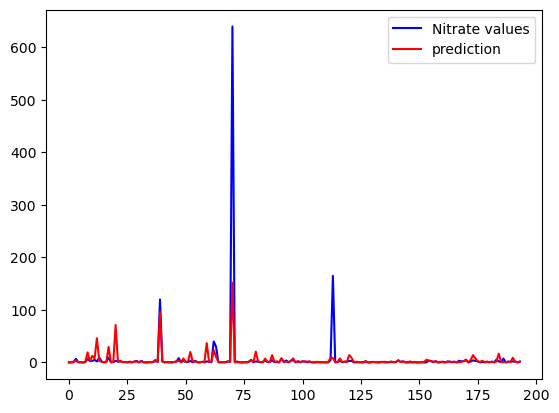

In [154]:
plt.plot(range(len(y_val)),y_val,'b',label='Nitrate values')
plt.plot(range(len(y_pred_nitr)),y_pred_nitr,'r',label='prediction')
plt.legend(loc='best');

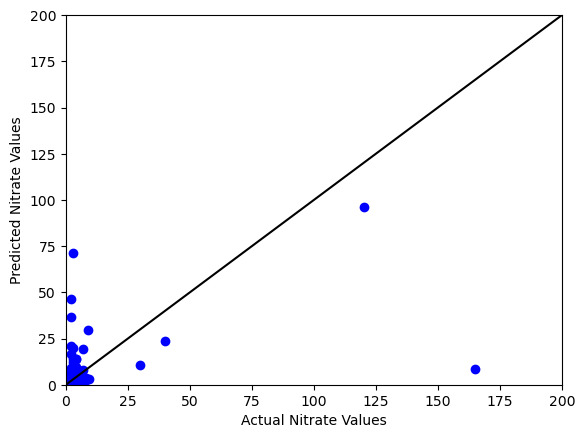

In [155]:
plt.scatter(y_val, y_pred_nitr, c='b')
plt.plot([0,200], [0,200], 'k')
plt.xlim([0, 200])
plt.ylim([0, 200])
plt.xlabel('Actual Nitrate Values')
plt.ylabel('Predicted Nitrate Values');

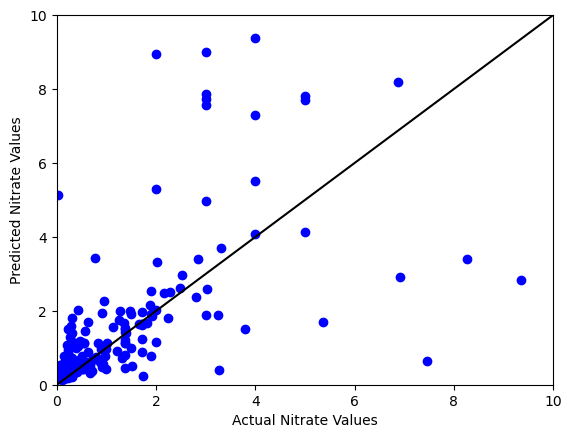

In [156]:
plt.scatter(y_val, y_pred_nitr, c='b')
plt.plot([0,10], [0,10], 'k')
plt.xlim([0, 10])
plt.ylim([0, 10])
plt.xlabel('Actual Nitrate Values')
plt.ylabel('Predicted Nitrate Values');

In [157]:
diff_nitr = y_pred_nitr - y_val

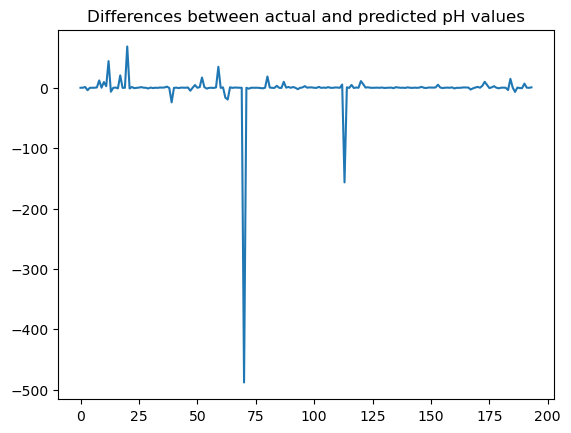

In [158]:
plt.plot(range(len(diff_nitr)),diff_nitr)
plt.title('Differences between actual and predicted pH values');

In [257]:
degree_list = np.arange(1,5)

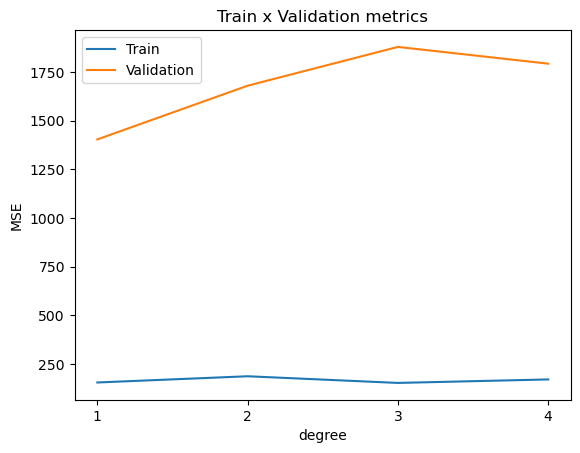

In [258]:
MSE_list_train = []
MSE_list_val = []
for degree in degree_list:
    transformer = PolynomialFeatures(degree).fit(X_train)
    X_poly = transformer.transform(X_train)
    X_poly = X_poly[:,1:]
    model = RandomForestRegressor(n_estimators = 25,
                                  max_depth = 25,
                                  min_samples_split = 7).fit(X_poly,y_train) 
    predictions_train = model.predict(X_poly)
    X_val_poly = transformer.transform(X_val)
    X_val_poly = X_val_poly[:,1:]
    predictions_val = model.predict(X_val_poly)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('degree')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(degree_list )),labels=degree_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [259]:
MSE_list_val

[1403.9289732254192, 1679.9932847113116, 1879.269981627504, 1793.2292039381373]

In [161]:
X_train, X_val, y_train, y_val = train_test_split(X.values, y.values, train_size = 0.8, random_state = 123)

In [162]:
n = int(len(X_train)*0.8) ## Using 80% to train and 20% to eval

In [163]:
X_train_fit, X_train_eval, y_train_fit, y_train_eval = X_train[:n], X_train[n:], y_train[:n], y_train[n:]

In [165]:
X_train_fit

(618, 6)

In [166]:
X_train_eval.shape

(155, 6)

In [167]:
X_train.shape

(773, 6)

In [169]:
X_val.shape

(194, 6)

In [170]:
y_train_fit.shape

(618,)

In [171]:
y_train_eval.shape

(155,)

In [172]:
y_train.shape

(773,)

In [173]:
y_val.shape

(194,)

In [263]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = XGBRegressor(n_estimators = n_estimators, verbosity = 0,random_state = 123)
    model.fit(X_train_fit,y_train_fit, eval_set = [(X_train_eval,y_train_eval)]) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

[0]	validation_0-rmse:12.21689
[1]	validation_0-rmse:12.24081
[2]	validation_0-rmse:13.79113
[3]	validation_0-rmse:13.36284
[4]	validation_0-rmse:13.21338
[5]	validation_0-rmse:13.29361
[6]	validation_0-rmse:13.53318
[7]	validation_0-rmse:13.84803
[8]	validation_0-rmse:13.91526
[9]	validation_0-rmse:14.02508
[0]	validation_0-rmse:12.21689
[1]	validation_0-rmse:12.24081
[2]	validation_0-rmse:13.79113
[3]	validation_0-rmse:13.36284
[4]	validation_0-rmse:13.21338
[5]	validation_0-rmse:13.29361
[6]	validation_0-rmse:13.53318
[7]	validation_0-rmse:13.84803
[8]	validation_0-rmse:13.91526
[9]	validation_0-rmse:14.02508
[10]	validation_0-rmse:14.11432
[11]	validation_0-rmse:14.21552
[12]	validation_0-rmse:14.37288
[13]	validation_0-rmse:14.44311
[14]	validation_0-rmse:14.53206
[15]	validation_0-rmse:14.65584
[16]	validation_0-rmse:14.74246
[17]	validation_0-rmse:14.78937
[18]	validation_0-rmse:14.86153
[19]	validation_0-rmse:14.90303
[20]	validation_0-rmse:14.96905
[21]	validation_0-rmse:14.97

[98]	validation_0-rmse:14.98742
[99]	validation_0-rmse:14.98727
[100]	validation_0-rmse:14.98743
[101]	validation_0-rmse:14.98730
[102]	validation_0-rmse:14.98711
[103]	validation_0-rmse:14.98691
[104]	validation_0-rmse:14.98645
[105]	validation_0-rmse:14.98602
[106]	validation_0-rmse:14.98567
[107]	validation_0-rmse:14.98556
[108]	validation_0-rmse:14.98608
[109]	validation_0-rmse:14.98593
[110]	validation_0-rmse:14.98637
[111]	validation_0-rmse:14.98615
[112]	validation_0-rmse:14.98640
[113]	validation_0-rmse:14.98685
[114]	validation_0-rmse:14.98707
[115]	validation_0-rmse:14.98643
[116]	validation_0-rmse:14.98620
[117]	validation_0-rmse:14.98621
[118]	validation_0-rmse:14.98619
[119]	validation_0-rmse:14.98658
[120]	validation_0-rmse:14.98662
[121]	validation_0-rmse:14.98651
[122]	validation_0-rmse:14.98722
[123]	validation_0-rmse:14.98746
[124]	validation_0-rmse:14.98665
[125]	validation_0-rmse:14.98662
[126]	validation_0-rmse:14.98672
[127]	validation_0-rmse:14.98668
[128]	valida

[347]	validation_0-rmse:14.98633
[348]	validation_0-rmse:14.98633
[349]	validation_0-rmse:14.98633
[350]	validation_0-rmse:14.98633
[351]	validation_0-rmse:14.98633
[352]	validation_0-rmse:14.98633
[353]	validation_0-rmse:14.98633
[354]	validation_0-rmse:14.98633
[355]	validation_0-rmse:14.98633
[356]	validation_0-rmse:14.98633
[357]	validation_0-rmse:14.98633
[358]	validation_0-rmse:14.98633
[359]	validation_0-rmse:14.98633
[360]	validation_0-rmse:14.98633
[361]	validation_0-rmse:14.98633
[362]	validation_0-rmse:14.98633
[363]	validation_0-rmse:14.98633
[364]	validation_0-rmse:14.98633
[365]	validation_0-rmse:14.98633
[366]	validation_0-rmse:14.98633
[367]	validation_0-rmse:14.98633
[368]	validation_0-rmse:14.98633
[369]	validation_0-rmse:14.98633
[370]	validation_0-rmse:14.98633
[371]	validation_0-rmse:14.98633
[372]	validation_0-rmse:14.98633
[373]	validation_0-rmse:14.98633
[374]	validation_0-rmse:14.98633
[375]	validation_0-rmse:14.98633
[376]	validation_0-rmse:14.98633
[377]	vali

[99]	validation_0-rmse:14.98727
[100]	validation_0-rmse:14.98743
[101]	validation_0-rmse:14.98730
[102]	validation_0-rmse:14.98711
[103]	validation_0-rmse:14.98691
[104]	validation_0-rmse:14.98645
[105]	validation_0-rmse:14.98602
[106]	validation_0-rmse:14.98567
[107]	validation_0-rmse:14.98556
[108]	validation_0-rmse:14.98608
[109]	validation_0-rmse:14.98593
[110]	validation_0-rmse:14.98637
[111]	validation_0-rmse:14.98615
[112]	validation_0-rmse:14.98640
[113]	validation_0-rmse:14.98685
[114]	validation_0-rmse:14.98707
[115]	validation_0-rmse:14.98643
[116]	validation_0-rmse:14.98620
[117]	validation_0-rmse:14.98621
[118]	validation_0-rmse:14.98619
[119]	validation_0-rmse:14.98658
[120]	validation_0-rmse:14.98662
[121]	validation_0-rmse:14.98651
[122]	validation_0-rmse:14.98722
[123]	validation_0-rmse:14.98746
[124]	validation_0-rmse:14.98665
[125]	validation_0-rmse:14.98662
[126]	validation_0-rmse:14.98672
[127]	validation_0-rmse:14.98668
[128]	validation_0-rmse:14.98636
[129]	valid

[348]	validation_0-rmse:14.98633
[349]	validation_0-rmse:14.98633
[350]	validation_0-rmse:14.98633
[351]	validation_0-rmse:14.98633
[352]	validation_0-rmse:14.98633
[353]	validation_0-rmse:14.98633
[354]	validation_0-rmse:14.98633
[355]	validation_0-rmse:14.98633
[356]	validation_0-rmse:14.98633
[357]	validation_0-rmse:14.98633
[358]	validation_0-rmse:14.98633
[359]	validation_0-rmse:14.98633
[360]	validation_0-rmse:14.98633
[361]	validation_0-rmse:14.98633
[362]	validation_0-rmse:14.98633
[363]	validation_0-rmse:14.98633
[364]	validation_0-rmse:14.98633
[365]	validation_0-rmse:14.98633
[366]	validation_0-rmse:14.98633
[367]	validation_0-rmse:14.98633
[368]	validation_0-rmse:14.98633
[369]	validation_0-rmse:14.98633
[370]	validation_0-rmse:14.98633
[371]	validation_0-rmse:14.98633
[372]	validation_0-rmse:14.98633
[373]	validation_0-rmse:14.98633
[374]	validation_0-rmse:14.98633
[375]	validation_0-rmse:14.98633
[376]	validation_0-rmse:14.98633
[377]	validation_0-rmse:14.98633
[378]	vali

[597]	validation_0-rmse:14.98633
[598]	validation_0-rmse:14.98633
[599]	validation_0-rmse:14.98633
[600]	validation_0-rmse:14.98633
[601]	validation_0-rmse:14.98633
[602]	validation_0-rmse:14.98633
[603]	validation_0-rmse:14.98633
[604]	validation_0-rmse:14.98633
[605]	validation_0-rmse:14.98633
[606]	validation_0-rmse:14.98633
[607]	validation_0-rmse:14.98633
[608]	validation_0-rmse:14.98633
[609]	validation_0-rmse:14.98633
[610]	validation_0-rmse:14.98633
[611]	validation_0-rmse:14.98633
[612]	validation_0-rmse:14.98633
[613]	validation_0-rmse:14.98633
[614]	validation_0-rmse:14.98633
[615]	validation_0-rmse:14.98633
[616]	validation_0-rmse:14.98633
[617]	validation_0-rmse:14.98633
[618]	validation_0-rmse:14.98633
[619]	validation_0-rmse:14.98633
[620]	validation_0-rmse:14.98633
[621]	validation_0-rmse:14.98633
[622]	validation_0-rmse:14.98633
[623]	validation_0-rmse:14.98633
[624]	validation_0-rmse:14.98633
[625]	validation_0-rmse:14.98633
[626]	validation_0-rmse:14.98633
[627]	vali

[846]	validation_0-rmse:14.98633
[847]	validation_0-rmse:14.98633
[848]	validation_0-rmse:14.98633
[849]	validation_0-rmse:14.98633
[850]	validation_0-rmse:14.98633
[851]	validation_0-rmse:14.98633
[852]	validation_0-rmse:14.98633
[853]	validation_0-rmse:14.98633
[854]	validation_0-rmse:14.98633
[855]	validation_0-rmse:14.98633
[856]	validation_0-rmse:14.98633
[857]	validation_0-rmse:14.98633
[858]	validation_0-rmse:14.98633
[859]	validation_0-rmse:14.98633
[860]	validation_0-rmse:14.98633
[861]	validation_0-rmse:14.98633
[862]	validation_0-rmse:14.98633
[863]	validation_0-rmse:14.98633
[864]	validation_0-rmse:14.98633
[865]	validation_0-rmse:14.98633
[866]	validation_0-rmse:14.98633
[867]	validation_0-rmse:14.98633
[868]	validation_0-rmse:14.98633
[869]	validation_0-rmse:14.98633
[870]	validation_0-rmse:14.98633
[871]	validation_0-rmse:14.98633
[872]	validation_0-rmse:14.98633
[873]	validation_0-rmse:14.98633
[874]	validation_0-rmse:14.98633
[875]	validation_0-rmse:14.98633
[876]	vali

[98]	validation_0-rmse:14.98742
[99]	validation_0-rmse:14.98727
[100]	validation_0-rmse:14.98743
[101]	validation_0-rmse:14.98730
[102]	validation_0-rmse:14.98711
[103]	validation_0-rmse:14.98691
[104]	validation_0-rmse:14.98645
[105]	validation_0-rmse:14.98602
[106]	validation_0-rmse:14.98567
[107]	validation_0-rmse:14.98556
[108]	validation_0-rmse:14.98608
[109]	validation_0-rmse:14.98593
[110]	validation_0-rmse:14.98637
[111]	validation_0-rmse:14.98615
[112]	validation_0-rmse:14.98640
[113]	validation_0-rmse:14.98685
[114]	validation_0-rmse:14.98707
[115]	validation_0-rmse:14.98643
[116]	validation_0-rmse:14.98620
[117]	validation_0-rmse:14.98621
[118]	validation_0-rmse:14.98619
[119]	validation_0-rmse:14.98658
[120]	validation_0-rmse:14.98662
[121]	validation_0-rmse:14.98651
[122]	validation_0-rmse:14.98722
[123]	validation_0-rmse:14.98746
[124]	validation_0-rmse:14.98665
[125]	validation_0-rmse:14.98662
[126]	validation_0-rmse:14.98672
[127]	validation_0-rmse:14.98668
[128]	valida

[347]	validation_0-rmse:14.98633
[348]	validation_0-rmse:14.98633
[349]	validation_0-rmse:14.98633
[350]	validation_0-rmse:14.98633
[351]	validation_0-rmse:14.98633
[352]	validation_0-rmse:14.98633
[353]	validation_0-rmse:14.98633
[354]	validation_0-rmse:14.98633
[355]	validation_0-rmse:14.98633
[356]	validation_0-rmse:14.98633
[357]	validation_0-rmse:14.98633
[358]	validation_0-rmse:14.98633
[359]	validation_0-rmse:14.98633
[360]	validation_0-rmse:14.98633
[361]	validation_0-rmse:14.98633
[362]	validation_0-rmse:14.98633
[363]	validation_0-rmse:14.98633
[364]	validation_0-rmse:14.98633
[365]	validation_0-rmse:14.98633
[366]	validation_0-rmse:14.98633
[367]	validation_0-rmse:14.98633
[368]	validation_0-rmse:14.98633
[369]	validation_0-rmse:14.98633
[370]	validation_0-rmse:14.98633
[371]	validation_0-rmse:14.98633
[372]	validation_0-rmse:14.98633
[373]	validation_0-rmse:14.98633
[374]	validation_0-rmse:14.98633
[375]	validation_0-rmse:14.98633
[376]	validation_0-rmse:14.98633
[377]	vali

[596]	validation_0-rmse:14.98633
[597]	validation_0-rmse:14.98633
[598]	validation_0-rmse:14.98633
[599]	validation_0-rmse:14.98633
[600]	validation_0-rmse:14.98633
[601]	validation_0-rmse:14.98633
[602]	validation_0-rmse:14.98633
[603]	validation_0-rmse:14.98633
[604]	validation_0-rmse:14.98633
[605]	validation_0-rmse:14.98633
[606]	validation_0-rmse:14.98633
[607]	validation_0-rmse:14.98633
[608]	validation_0-rmse:14.98633
[609]	validation_0-rmse:14.98633
[610]	validation_0-rmse:14.98633
[611]	validation_0-rmse:14.98633
[612]	validation_0-rmse:14.98633
[613]	validation_0-rmse:14.98633
[614]	validation_0-rmse:14.98633
[615]	validation_0-rmse:14.98633
[616]	validation_0-rmse:14.98633
[617]	validation_0-rmse:14.98633
[618]	validation_0-rmse:14.98633
[619]	validation_0-rmse:14.98633
[620]	validation_0-rmse:14.98633
[621]	validation_0-rmse:14.98633
[622]	validation_0-rmse:14.98633
[623]	validation_0-rmse:14.98633
[624]	validation_0-rmse:14.98633
[625]	validation_0-rmse:14.98633
[626]	vali

[845]	validation_0-rmse:14.98633
[846]	validation_0-rmse:14.98633
[847]	validation_0-rmse:14.98633
[848]	validation_0-rmse:14.98633
[849]	validation_0-rmse:14.98633
[850]	validation_0-rmse:14.98633
[851]	validation_0-rmse:14.98633
[852]	validation_0-rmse:14.98633
[853]	validation_0-rmse:14.98633
[854]	validation_0-rmse:14.98633
[855]	validation_0-rmse:14.98633
[856]	validation_0-rmse:14.98633
[857]	validation_0-rmse:14.98633
[858]	validation_0-rmse:14.98633
[859]	validation_0-rmse:14.98633
[860]	validation_0-rmse:14.98633
[861]	validation_0-rmse:14.98633
[862]	validation_0-rmse:14.98633
[863]	validation_0-rmse:14.98633
[864]	validation_0-rmse:14.98633
[865]	validation_0-rmse:14.98633
[866]	validation_0-rmse:14.98633
[867]	validation_0-rmse:14.98633
[868]	validation_0-rmse:14.98633
[869]	validation_0-rmse:14.98633
[870]	validation_0-rmse:14.98633
[871]	validation_0-rmse:14.98633
[872]	validation_0-rmse:14.98633
[873]	validation_0-rmse:14.98633
[874]	validation_0-rmse:14.98633
[875]	vali

[1091]	validation_0-rmse:14.98633
[1092]	validation_0-rmse:14.98633
[1093]	validation_0-rmse:14.98633
[1094]	validation_0-rmse:14.98633
[1095]	validation_0-rmse:14.98633
[1096]	validation_0-rmse:14.98633
[1097]	validation_0-rmse:14.98633
[1098]	validation_0-rmse:14.98633
[1099]	validation_0-rmse:14.98633
[1100]	validation_0-rmse:14.98633
[1101]	validation_0-rmse:14.98633
[1102]	validation_0-rmse:14.98633
[1103]	validation_0-rmse:14.98633
[1104]	validation_0-rmse:14.98633
[1105]	validation_0-rmse:14.98633
[1106]	validation_0-rmse:14.98633
[1107]	validation_0-rmse:14.98633
[1108]	validation_0-rmse:14.98633
[1109]	validation_0-rmse:14.98633
[1110]	validation_0-rmse:14.98633
[1111]	validation_0-rmse:14.98633
[1112]	validation_0-rmse:14.98633
[1113]	validation_0-rmse:14.98633
[1114]	validation_0-rmse:14.98633
[1115]	validation_0-rmse:14.98633
[1116]	validation_0-rmse:14.98633
[1117]	validation_0-rmse:14.98633
[1118]	validation_0-rmse:14.98633
[1119]	validation_0-rmse:14.98633
[1120]	validat

[1332]	validation_0-rmse:14.98633
[1333]	validation_0-rmse:14.98633
[1334]	validation_0-rmse:14.98633
[1335]	validation_0-rmse:14.98633
[1336]	validation_0-rmse:14.98633
[1337]	validation_0-rmse:14.98633
[1338]	validation_0-rmse:14.98633
[1339]	validation_0-rmse:14.98633
[1340]	validation_0-rmse:14.98633
[1341]	validation_0-rmse:14.98633
[1342]	validation_0-rmse:14.98633
[1343]	validation_0-rmse:14.98633
[1344]	validation_0-rmse:14.98633
[1345]	validation_0-rmse:14.98633
[1346]	validation_0-rmse:14.98633
[1347]	validation_0-rmse:14.98633
[1348]	validation_0-rmse:14.98633
[1349]	validation_0-rmse:14.98633
[1350]	validation_0-rmse:14.98633
[1351]	validation_0-rmse:14.98633
[1352]	validation_0-rmse:14.98633
[1353]	validation_0-rmse:14.98633
[1354]	validation_0-rmse:14.98633
[1355]	validation_0-rmse:14.98633
[1356]	validation_0-rmse:14.98633
[1357]	validation_0-rmse:14.98633
[1358]	validation_0-rmse:14.98633
[1359]	validation_0-rmse:14.98633
[1360]	validation_0-rmse:14.98633
[1361]	validat

[1573]	validation_0-rmse:14.98633
[1574]	validation_0-rmse:14.98633
[1575]	validation_0-rmse:14.98633
[1576]	validation_0-rmse:14.98633
[1577]	validation_0-rmse:14.98633
[1578]	validation_0-rmse:14.98633
[1579]	validation_0-rmse:14.98633
[1580]	validation_0-rmse:14.98633
[1581]	validation_0-rmse:14.98633
[1582]	validation_0-rmse:14.98633
[1583]	validation_0-rmse:14.98633
[1584]	validation_0-rmse:14.98633
[1585]	validation_0-rmse:14.98633
[1586]	validation_0-rmse:14.98633
[1587]	validation_0-rmse:14.98633
[1588]	validation_0-rmse:14.98633
[1589]	validation_0-rmse:14.98633
[1590]	validation_0-rmse:14.98633
[1591]	validation_0-rmse:14.98633
[1592]	validation_0-rmse:14.98633
[1593]	validation_0-rmse:14.98633
[1594]	validation_0-rmse:14.98633
[1595]	validation_0-rmse:14.98633
[1596]	validation_0-rmse:14.98633
[1597]	validation_0-rmse:14.98633
[1598]	validation_0-rmse:14.98633
[1599]	validation_0-rmse:14.98633
[1600]	validation_0-rmse:14.98633
[1601]	validation_0-rmse:14.98633
[1602]	validat

[1814]	validation_0-rmse:14.98633
[1815]	validation_0-rmse:14.98633
[1816]	validation_0-rmse:14.98633
[1817]	validation_0-rmse:14.98633
[1818]	validation_0-rmse:14.98633
[1819]	validation_0-rmse:14.98633
[1820]	validation_0-rmse:14.98633
[1821]	validation_0-rmse:14.98633
[1822]	validation_0-rmse:14.98633
[1823]	validation_0-rmse:14.98633
[1824]	validation_0-rmse:14.98633
[1825]	validation_0-rmse:14.98633
[1826]	validation_0-rmse:14.98633
[1827]	validation_0-rmse:14.98633
[1828]	validation_0-rmse:14.98633
[1829]	validation_0-rmse:14.98633
[1830]	validation_0-rmse:14.98633
[1831]	validation_0-rmse:14.98633
[1832]	validation_0-rmse:14.98633
[1833]	validation_0-rmse:14.98633
[1834]	validation_0-rmse:14.98633
[1835]	validation_0-rmse:14.98633
[1836]	validation_0-rmse:14.98633
[1837]	validation_0-rmse:14.98633
[1838]	validation_0-rmse:14.98633
[1839]	validation_0-rmse:14.98633
[1840]	validation_0-rmse:14.98633
[1841]	validation_0-rmse:14.98633
[1842]	validation_0-rmse:14.98633
[1843]	validat

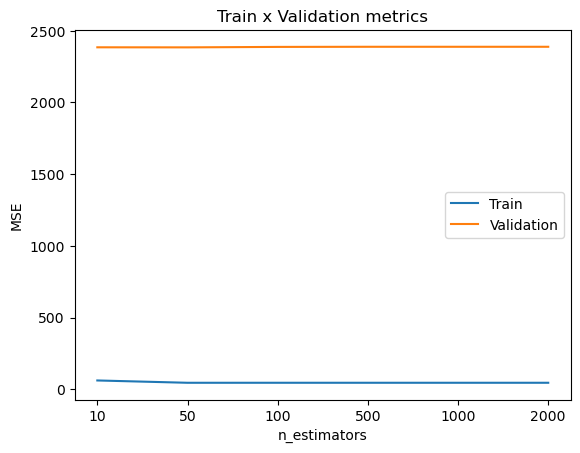

In [264]:
plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [265]:
ind_n_estimators = np.argmin(MSE_list_val)
ind_n_estimators

1

In [266]:
best_n_estimators = n_estimators_list[ind_n_estimators]
best_n_estimators

50

In [174]:
xgb_nitr_model = XGBRegressor(n_estimators = 50, learning_rate = 0.1,verbosity = 1,random_state = 123)
xgb_nitr_model.fit(X_train_fit,y_train_fit, eval_set = [(X_train_eval,y_train_eval)])

[0]	validation_0-rmse:13.93140
[1]	validation_0-rmse:12.98431
[2]	validation_0-rmse:12.32372
[3]	validation_0-rmse:12.03309
[4]	validation_0-rmse:12.01539
[5]	validation_0-rmse:11.26233
[6]	validation_0-rmse:10.66939
[7]	validation_0-rmse:10.11149
[8]	validation_0-rmse:9.71602
[9]	validation_0-rmse:9.39169
[10]	validation_0-rmse:9.08334
[11]	validation_0-rmse:8.89324
[12]	validation_0-rmse:8.74045
[13]	validation_0-rmse:8.61906
[14]	validation_0-rmse:8.61240
[15]	validation_0-rmse:8.56452
[16]	validation_0-rmse:8.58254
[17]	validation_0-rmse:8.58610
[18]	validation_0-rmse:8.64058
[19]	validation_0-rmse:8.69108
[20]	validation_0-rmse:8.75610
[21]	validation_0-rmse:8.83131
[22]	validation_0-rmse:8.91451
[23]	validation_0-rmse:8.98914
[24]	validation_0-rmse:9.00842
[25]	validation_0-rmse:9.03770
[26]	validation_0-rmse:9.09145
[27]	validation_0-rmse:9.14101
[28]	validation_0-rmse:9.19462
[29]	validation_0-rmse:9.24784
[30]	validation_0-rmse:9.31358
[31]	validation_0-rmse:9.37342
[32]	valid

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=50, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=123, ...)

In [175]:
xgb_nitr_model.best_iteration

49

In [185]:
print(f"MSE for train:\n\tMSE: {MSE(xgb_nitr_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(xgb_nitr_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 31.7594
MSE for validation:
	MSE: 2298.7988


In [186]:
y_pred_nitr = xgb_nitr_model.predict(X_val)

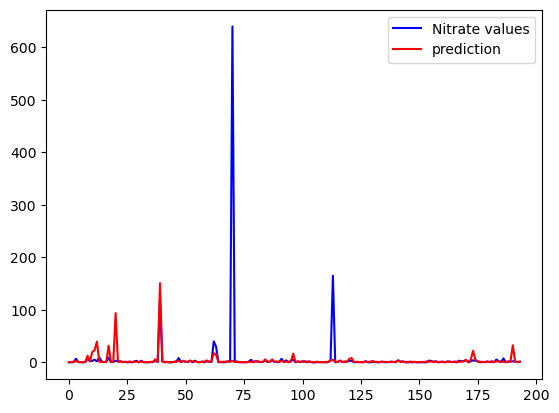

In [187]:
plt.plot(range(len(y_val)),y_val,'b',label='Nitrate values')
plt.plot(range(len(y_pred_nitr)),y_pred_nitr,'r',label='prediction')
plt.legend(loc='best');

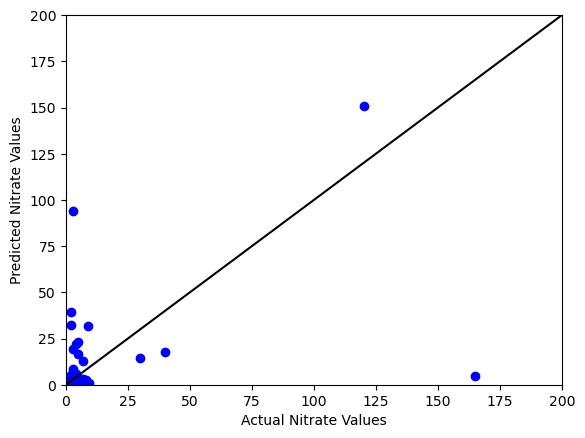

In [188]:
plt.scatter(y_val, y_pred_nitr, c='b')
plt.plot([0,200], [0,200], 'k')
plt.xlim([0, 200])
plt.ylim([0, 200])
plt.xlabel('Actual Nitrate Values')
plt.ylabel('Predicted Nitrate Values');

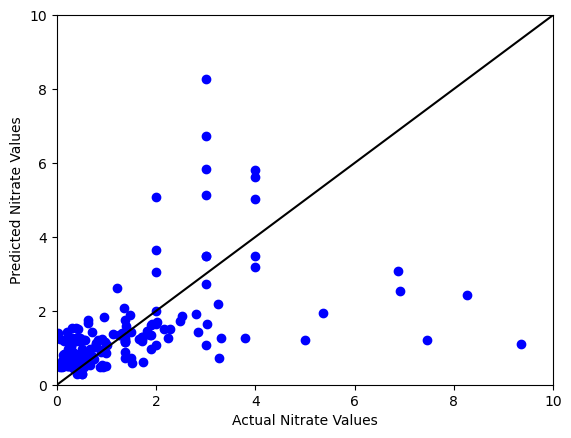

In [189]:
plt.scatter(y_val, y_pred_nitr, c='b')
plt.plot([0,10], [0,10], 'k')
plt.xlim([0, 10])
plt.ylim([0, 10])
plt.xlabel('Actual Nitrate Values')
plt.ylabel('Predicted Nitrate Values');

In [190]:
diff_nitr = y_pred_nitr - y_val

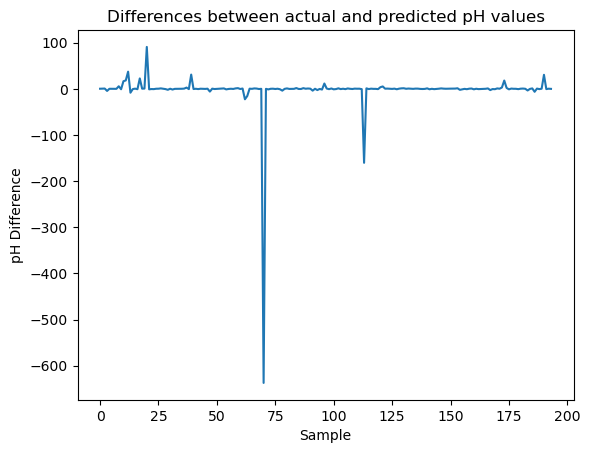

In [191]:
plt.plot(range(len(diff_nitr)),diff_nitr)
plt.title('Differences between actual and predicted pH values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

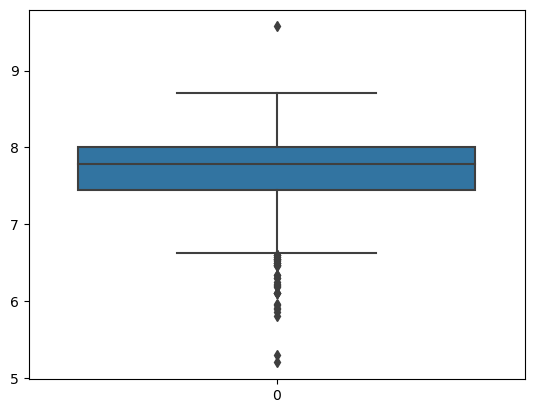

In [274]:
sns.boxplot(df['pH']);

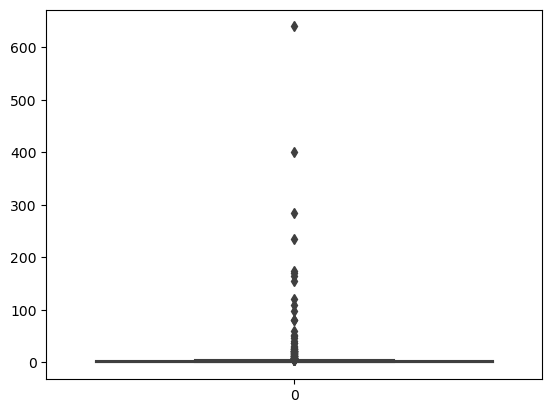

In [275]:
sns.boxplot(df['Nitrate']);

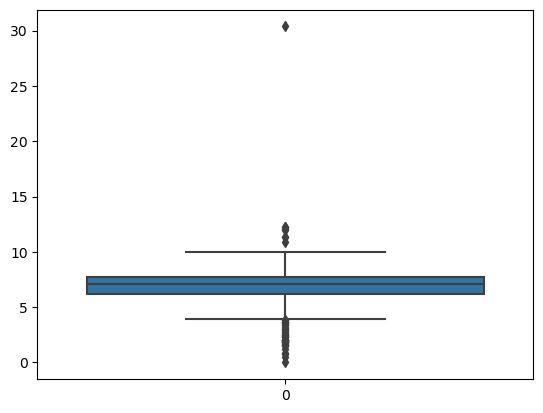

In [276]:
sns.boxplot(df['D.O']);

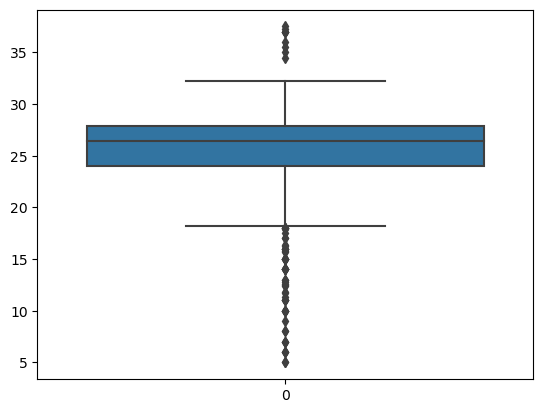

In [277]:
sns.boxplot(df['Temperature']);

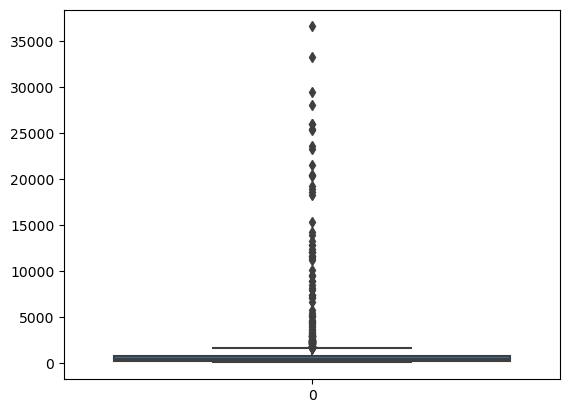

In [278]:
sns.boxplot(df['Conductivity']);

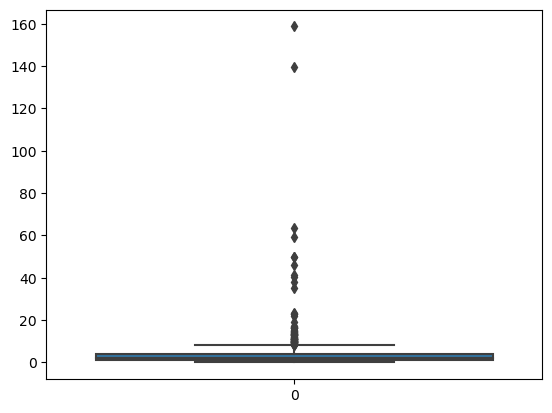

In [279]:
sns.boxplot(df['B.O.D']);

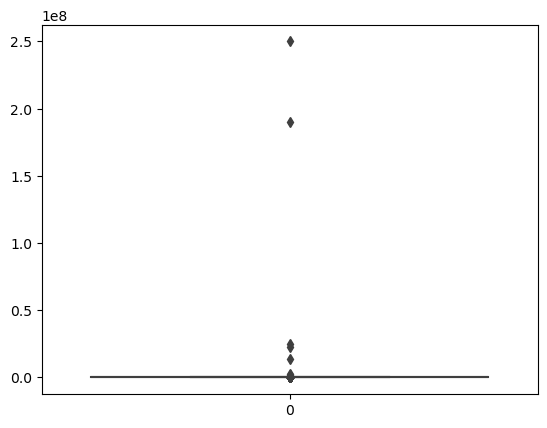

In [280]:
sns.boxplot(df['Totalcaliform']);

#### Getting D.O Value

In [132]:
X = df.loc[:,['Temperature','pH','Conductivity','B.O.D','Nitrate','Totalcaliform']]

In [133]:
X.head()

,Temperature,pH,Conductivity,B.O.D,Nitrate,Totalcaliform
0,9.0,8.0,85.0,0.1,0.2,397.0
1,10.0,8.0,102.0,0.3,0.4,954.0
2,11.0,8.0,96.0,0.2,0.3,653.0
3,13.0,8.0,94.0,0.2,0.4,317.0
4,14.0,8.0,112.0,0.2,0.5,1072.0


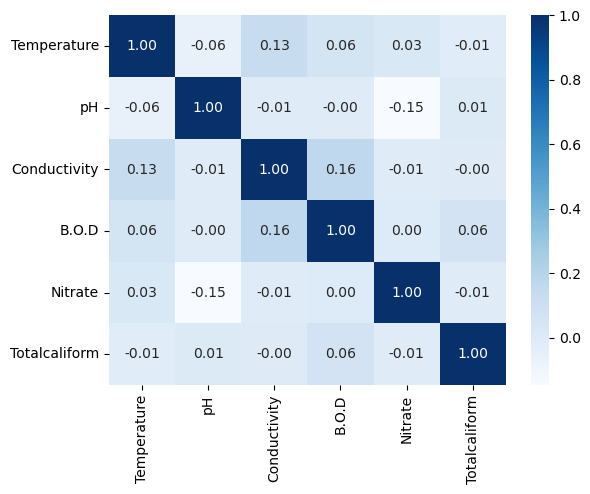

In [135]:
sns.heatmap(X.corr(), annot=True, fmt=".2f", cmap="Blues");

In [136]:
y = df_new['D.O']

In [137]:
y.value_counts()

D.O
8.000000    36
7.600000    26
7.700000    21
9.000000    20
7.300000    19
            ..
6.166667     1
6.188889     1
5.224000     1
5.844444     1
7.290000     1
Name: count, Length: 540, dtype: int64

In [139]:
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size = 0.7, random_state = 123)

In [140]:
X_train.shape

(676, 6)

In [141]:
y_train.shape

(676,)

In [142]:
X_val.shape

(291, 6)

In [143]:
min_samples_split_list = [2,10, 30, 50, 100, 200, 300, 700, 1000, 1200, 1500]

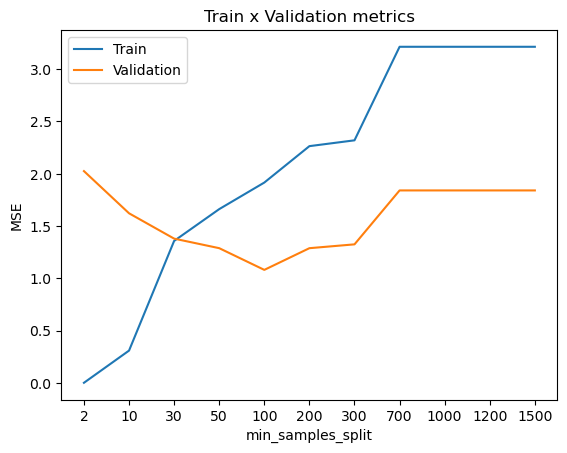

In [144]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [145]:
min_samples_split_list = np.arange(50,200,10)

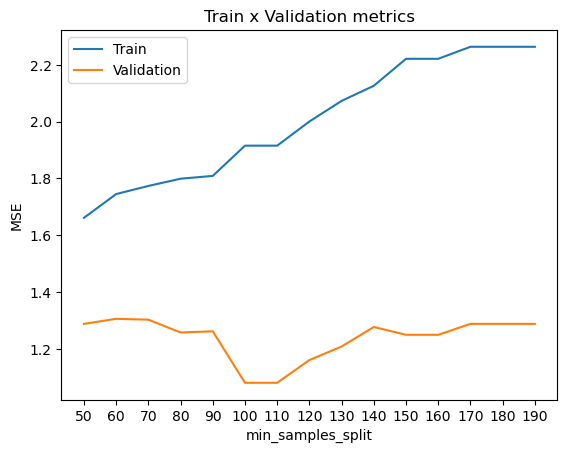

In [146]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = DecisionTreeRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [147]:
ind_min_samp_split = np.argmin(MSE_list_val)
ind_min_samp_split

5

In [148]:
best_min_samp_split = min_samples_split_list[ind_min_samp_split]
best_min_samp_split

100

In [149]:
max_depth_list = [1,2, 3, 4, 8, 16, 32, 64, None]

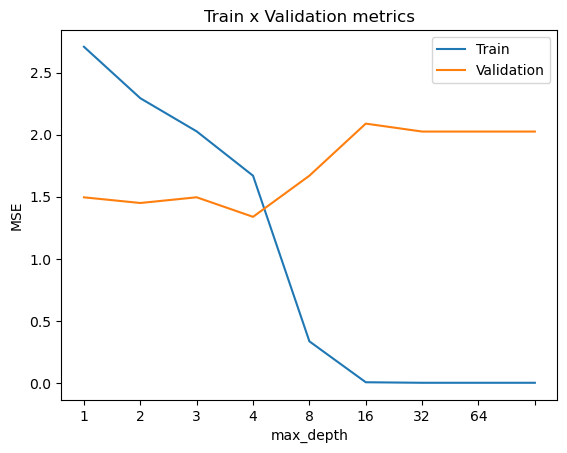

In [150]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = DecisionTreeRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [151]:
max_depth_list = np.arange(3,10)

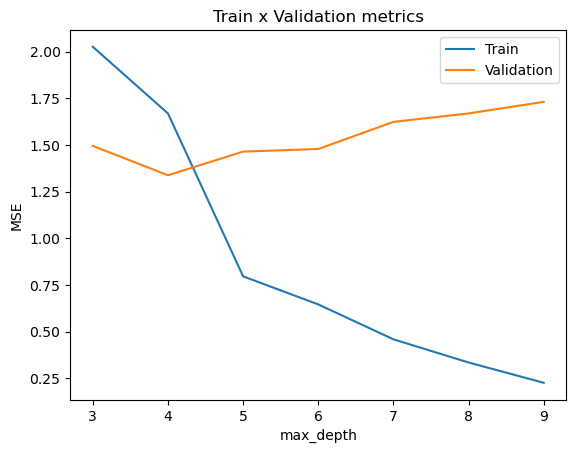

In [152]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = DecisionTreeRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

    Chosen max_depth = 4
    Chosen min_samples_split = 100

In [153]:
decision_tree_do_model = DecisionTreeRegressor(min_samples_split = 100,
                                             max_depth = 4,
                                             random_state = 123).fit(X_train,y_train)

In [154]:
print(f"MSE for train:\n\tMSE: {MSE(decision_tree_do_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(decision_tree_do_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 2.0779
MSE for validation:
	MSE: 1.2372


In [155]:
y_pred_do = decision_tree_do_model.predict(X_val)

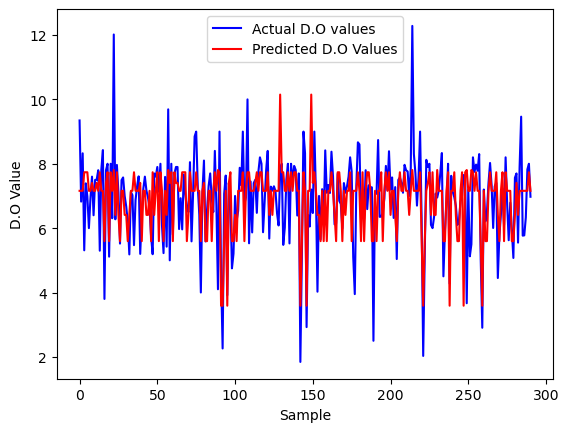

In [156]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O values')
plt.plot(range(len(y_pred_do)),y_pred_do,'r',label='Predicted D.O Values')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('D.O Value');

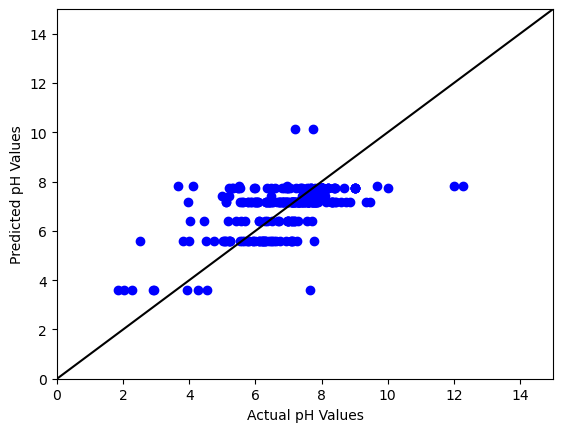

In [159]:
mn = 0
mx = 15

plt.scatter(y_val, y_pred_do, c='b')
plt.plot([mn,mx], [mn,mx], 'k')
plt.xlim([mn, mx])
plt.ylim([mn, mx])
plt.xlabel('Actual pH Values')
plt.ylabel('Predicted pH Values');

In [160]:
diff_do = y_pred_do - y_val

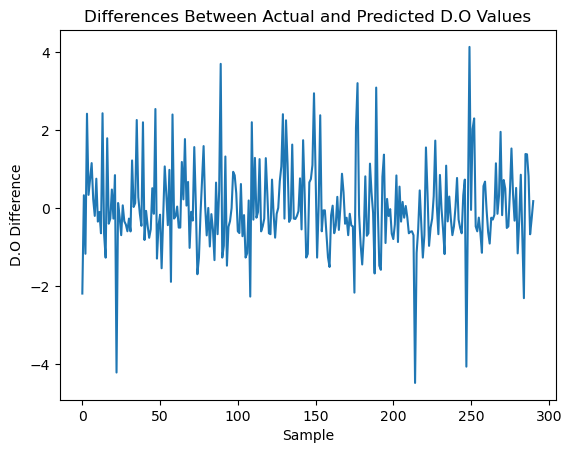

In [161]:
plt.plot(range(len(diff_do)),diff_do)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('D.O Difference');

In [162]:
decision_tree_do_model.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 4,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 100,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 123,
 'splitter': 'best'}

In [163]:
degree_list = np.arange(1,5)

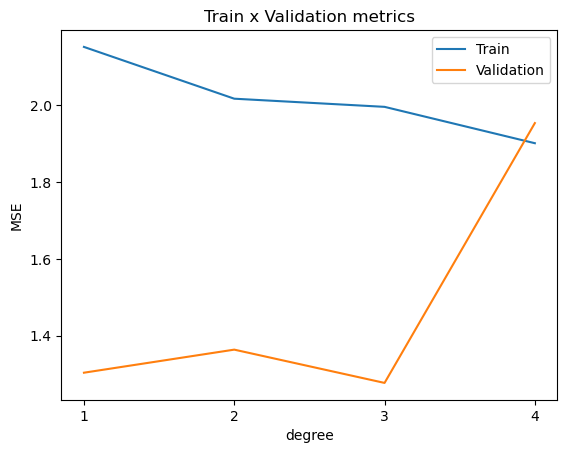

In [164]:
MSE_list_train = []
MSE_list_val = []
for degree in degree_list:
    transformer = PolynomialFeatures(degree).fit(X_train)
    X_poly = transformer.transform(X_train)
    X_poly = X_poly[:,1:]
    model = DecisionTreeRegressor(min_samples_split = 120,
                                  max_depth = 4,
                                  random_state = 123).fit(X_poly,y_train) 
    predictions_train = model.predict(X_poly)
    X_val_poly = transformer.transform(X_val)
    X_val_poly = X_val_poly[:,1:]
    predictions_val = model.predict(X_val_poly)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('degree')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(degree_list )),labels=degree_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [165]:
MSE_list_val

[1.303862722297593, 1.3638725306153114, 1.2772812994370384, 1.9532042838906996]

In [166]:
min_samples_split_list = [2,10, 30, 50, 100, 200, 300, 700, 1000, 1200, 1500, 2000]

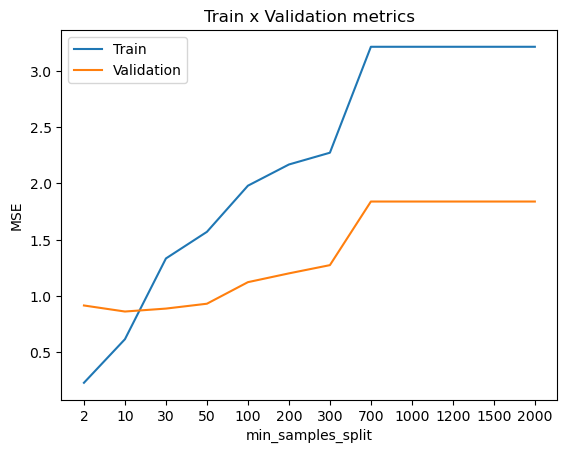

In [167]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = RandomForestRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list) 
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [168]:
min_samples_split_list = np.arange(2,30)

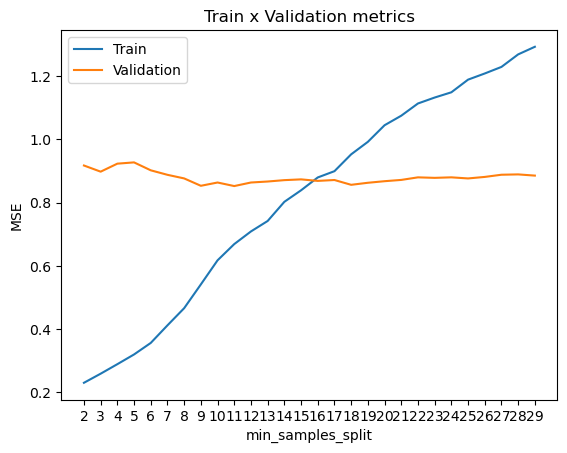

In [169]:
MSE_list_train = []
MSE_list_val = []
for min_samples_split in min_samples_split_list:
    model = RandomForestRegressor(min_samples_split = min_samples_split,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list) 
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [170]:
ind_min_samp_split = np.argmin(MSE_list_val)
ind_min_samp_split

9

In [171]:
best_min_samp_split = min_samples_split_list[ind_min_samp_split]
best_min_samp_split

11

In [172]:
max_depth_list = [2, 4, 8, 16, 32, 64, None]

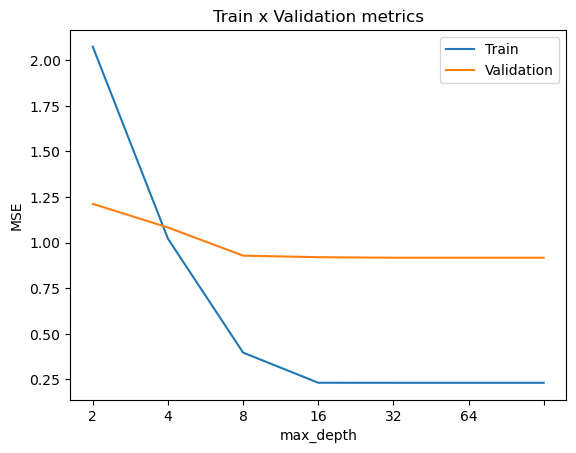

In [173]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = RandomForestRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [174]:
MSE_list_val

[1.212273923616392,
 1.082675114387195,
 0.9281386564899339,
 0.9198215060951287,
 0.9169260370881996,
 0.9169260370881996,
 0.9169260370881996]

In [175]:
max_depth_list = np.arange(8,33)

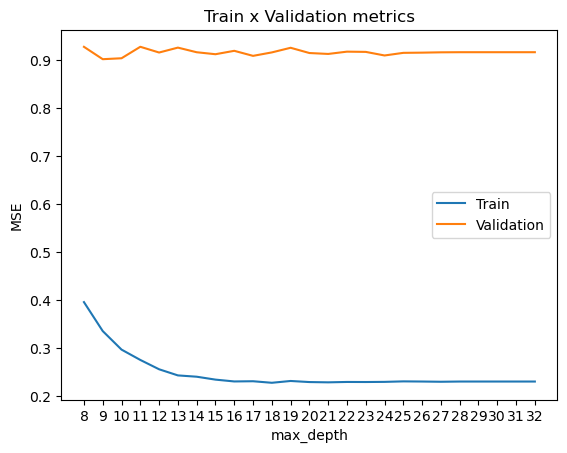

In [176]:
MSE_list_train = []
MSE_list_val = []
for max_depth in max_depth_list:
    model = RandomForestRegressor(max_depth = max_depth,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [177]:
ind_max_depth = np.argmin(MSE_list_val)
ind_max_depth

1

In [178]:
best_max_depth = max_depth_list[ind_max_depth]
best_max_depth

9

In [179]:
n_estimators_list = [10,50,100,500,1000,2000]

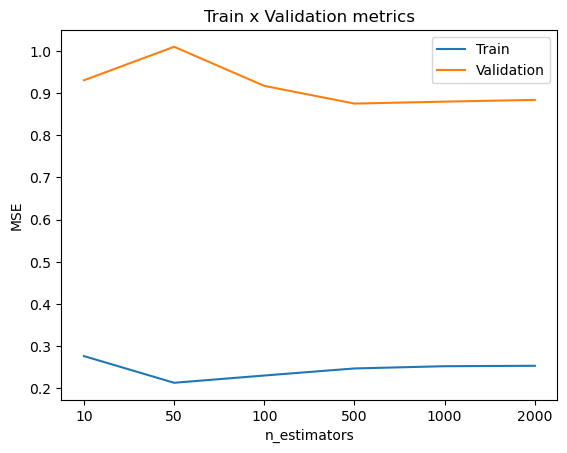

In [180]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [182]:
MSE_list_val

[0.9302614095592241,
 1.0096209510563905,
 0.9169260370881996,
 0.8750584547599417,
 0.879626179619015,
 0.8837835187266435]

In [183]:
n_estimators_list = np.arange(100,1000,50)

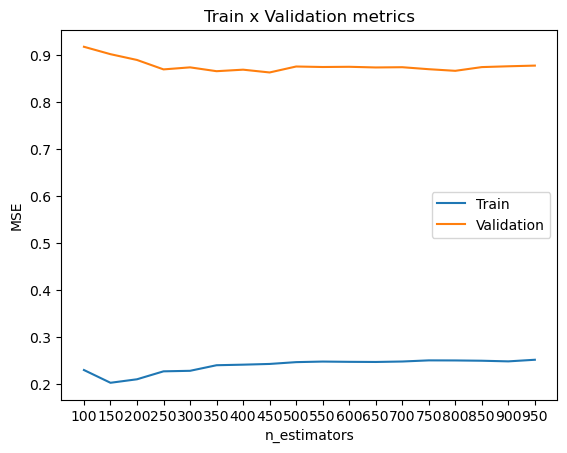

In [184]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [185]:
n_estimators_list = np.arange(400,550,5)

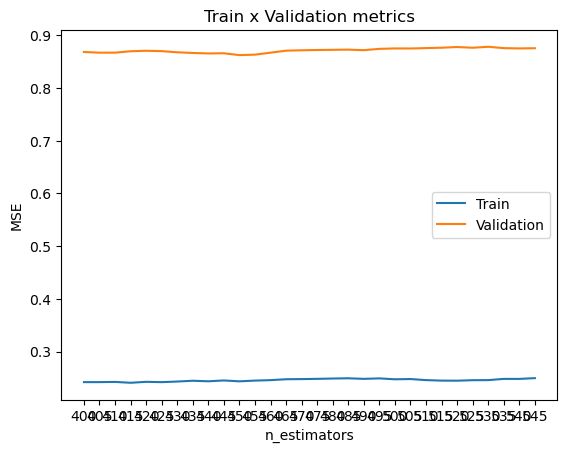

In [186]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [187]:
ind_n_estimators = np.argmin(MSE_list_val)
ind_n_estimators

10

In [188]:
best_n_estimators = n_estimators_list[ind_n_estimators]
best_n_estimators

450

In [189]:
n_estimators_list = np.arange(445,456)

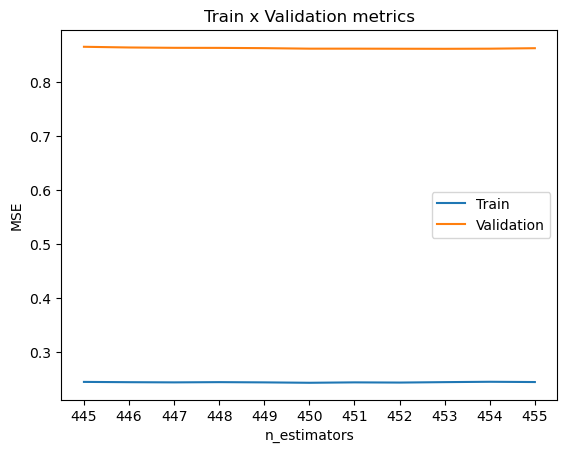

In [190]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = RandomForestRegressor(n_estimators = n_estimators,
                                   random_state = 123).fit(X_train,y_train) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [191]:
MSE_list_val

[0.865894995272482,
 0.8646011618637773,
 0.8639698009580893,
 0.8638512946787287,
 0.8633640089518698,
 0.8624082760514673,
 0.8624002663308804,
 0.8622569774670596,
 0.8621429250707645,
 0.8623749352854243,
 0.8632662298630148]

In [192]:
ind_n_estimators = np.argmin(MSE_list_val)
ind_n_estimators

8

In [193]:
best_n_estimators = n_estimators_list[ind_n_estimators]
best_n_estimators

453

    Chosen max_depth = 9
    Chosen n_estimators = 453
    Chosen min_samples_split = 11

In [194]:
random_forest_do_model = RandomForestRegressor(n_estimators = 453,
                                               max_depth = 9,
                                               min_samples_split = 11,
                                               random_state=123).fit(X_train,y_train)

In [195]:
print(f"MSE for train:\n\tMSE: {MSE(random_forest_do_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(random_forest_do_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 0.7198
MSE for validation:
	MSE: 0.8475


In [196]:
y_pred_do = random_forest_do_model.predict(X_val)

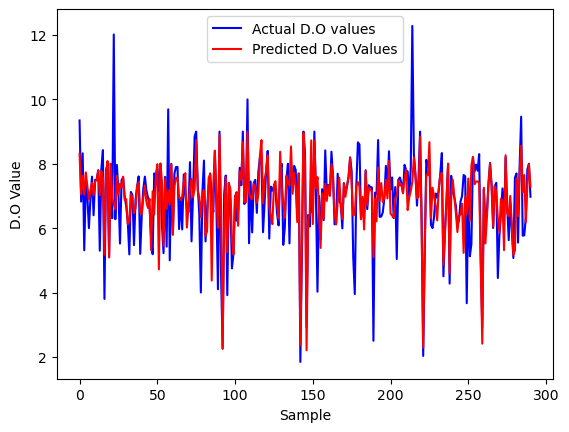

In [197]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O values')
plt.plot(range(len(y_pred_do)),y_pred_do,'r',label='Predicted D.O Values')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('D.O Value');

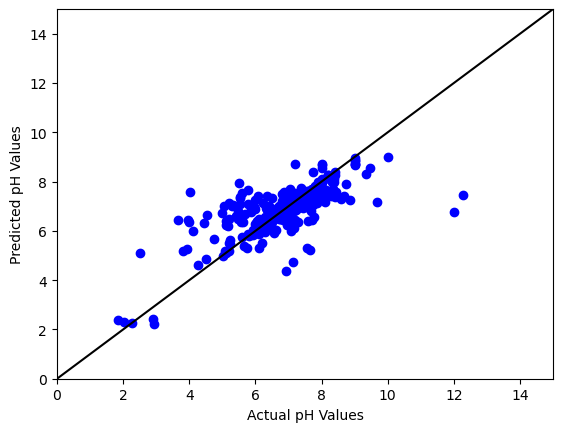

In [201]:
mn = 0
mx = 15

plt.scatter(y_val, y_pred_do, c='b')
plt.plot([mn,mx], [mn,mx], 'k')
plt.xlim([mn, mx])
plt.ylim([mn, mx])
plt.xlabel('Actual pH Values')
plt.ylabel('Predicted pH Values');

In [202]:
diff_do = y_pred_do - y_val

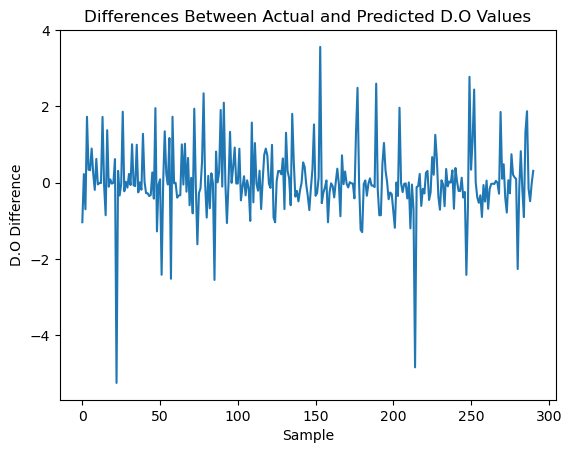

In [203]:
plt.plot(range(len(diff_do)),diff_do)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('D.O Difference');

In [204]:
degree_list = np.arange(1,5)

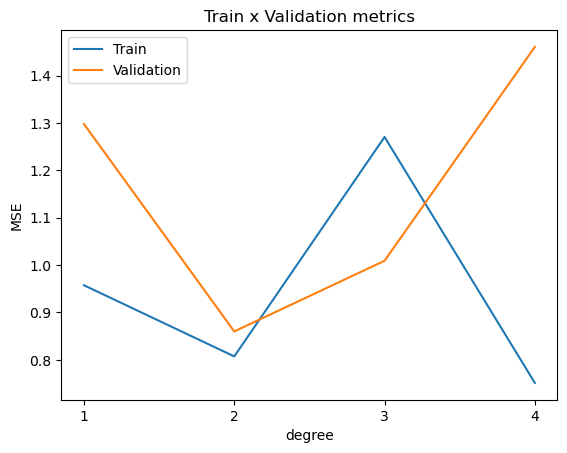

In [205]:
MSE_list_train = []
MSE_list_val = []
for degree in degree_list:
    transformer = PolynomialFeatures(degree).fit(X_train)
    X_poly = transformer.transform(X_train)
    X_poly = X_poly[:,1:]
    model = RandomForestRegressor(n_estimators = 5,
                                  max_depth = 16,
                                  min_samples_split = 10).fit(X_poly,y_train) 
    predictions_train = model.predict(X_poly)
    X_val_poly = transformer.transform(X_val)
    X_val_poly = X_val_poly[:,1:]
    predictions_val = model.predict(X_val_poly)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

plt.title('Train x Validation metrics')
plt.xlabel('degree')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(degree_list )),labels=degree_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [206]:
MSE_list_val

[1.297656331424348, 0.8600366920136165, 1.0091346501474414, 1.4602957818800009]

In [207]:
X_train, X_val, y_train, y_val = train_test_split(X.values, y.values, train_size = 0.7, random_state = 123)

In [208]:
n = int(len(X_train)*0.8) ## Using 80% to train and 20% to eval

In [209]:
X_train_fit, X_train_eval, y_train_fit, y_train_eval = X_train[:n], X_train[n:], y_train[:n], y_train[n:]

In [210]:
n_estimators_list = [10,50,100,500,1000,2000]

In [211]:
MSE_list_train = []
MSE_list_val = []
for n_estimators in n_estimators_list:
    model = XGBRegressor(n_estimators = n_estimators, verbosity = 0,random_state = 123)
    model.fit(X_train_fit,y_train_fit, eval_set = [(X_train_eval,y_train_eval)]) 
    predictions_train = model.predict(X_train)
    predictions_val = model.predict(X_val)
    MSE_train = MSE(predictions_train,y_train)
    MSE_val = MSE(predictions_val,y_val)
    MSE_list_train.append(MSE_train)
    MSE_list_val.append(MSE_val)

[0]	validation_0-rmse:5.34915
[1]	validation_0-rmse:4.19031
[2]	validation_0-rmse:3.45212
[3]	validation_0-rmse:3.01445
[4]	validation_0-rmse:2.72247
[5]	validation_0-rmse:2.54222
[6]	validation_0-rmse:2.44896
[7]	validation_0-rmse:2.39390
[8]	validation_0-rmse:2.34499
[9]	validation_0-rmse:2.32877
[0]	validation_0-rmse:5.34915
[1]	validation_0-rmse:4.19031
[2]	validation_0-rmse:3.45212
[3]	validation_0-rmse:3.01445
[4]	validation_0-rmse:2.72247
[5]	validation_0-rmse:2.54222
[6]	validation_0-rmse:2.44896
[7]	validation_0-rmse:2.39390
[8]	validation_0-rmse:2.34499
[9]	validation_0-rmse:2.32877
[10]	validation_0-rmse:2.31696
[11]	validation_0-rmse:2.31077
[12]	validation_0-rmse:2.30014
[13]	validation_0-rmse:2.29967
[14]	validation_0-rmse:2.29856
[15]	validation_0-rmse:2.30010
[16]	validation_0-rmse:2.29868
[17]	validation_0-rmse:2.30289
[18]	validation_0-rmse:2.29489
[19]	validation_0-rmse:2.29474
[20]	validation_0-rmse:2.29248
[21]	validation_0-rmse:2.29188
[22]	validation_0-rmse:2.291

[105]	validation_0-rmse:2.29067
[106]	validation_0-rmse:2.29059
[107]	validation_0-rmse:2.29062
[108]	validation_0-rmse:2.29046
[109]	validation_0-rmse:2.29048
[110]	validation_0-rmse:2.29037
[111]	validation_0-rmse:2.29030
[112]	validation_0-rmse:2.29034
[113]	validation_0-rmse:2.29072
[114]	validation_0-rmse:2.29078
[115]	validation_0-rmse:2.29078
[116]	validation_0-rmse:2.29094
[117]	validation_0-rmse:2.29087
[118]	validation_0-rmse:2.29079
[119]	validation_0-rmse:2.29077
[120]	validation_0-rmse:2.29084
[121]	validation_0-rmse:2.29076
[122]	validation_0-rmse:2.29076
[123]	validation_0-rmse:2.29076
[124]	validation_0-rmse:2.29062
[125]	validation_0-rmse:2.29053
[126]	validation_0-rmse:2.29052
[127]	validation_0-rmse:2.29063
[128]	validation_0-rmse:2.29061
[129]	validation_0-rmse:2.29056
[130]	validation_0-rmse:2.29057
[131]	validation_0-rmse:2.29059
[132]	validation_0-rmse:2.29059
[133]	validation_0-rmse:2.29058
[134]	validation_0-rmse:2.29058
[135]	validation_0-rmse:2.29058
[136]	va

[362]	validation_0-rmse:2.29030
[363]	validation_0-rmse:2.29030
[364]	validation_0-rmse:2.29030
[365]	validation_0-rmse:2.29030
[366]	validation_0-rmse:2.29030
[367]	validation_0-rmse:2.29030
[368]	validation_0-rmse:2.29030
[369]	validation_0-rmse:2.29030
[370]	validation_0-rmse:2.29030
[371]	validation_0-rmse:2.29030
[372]	validation_0-rmse:2.29030
[373]	validation_0-rmse:2.29030
[374]	validation_0-rmse:2.29030
[375]	validation_0-rmse:2.29030
[376]	validation_0-rmse:2.29030
[377]	validation_0-rmse:2.29030
[378]	validation_0-rmse:2.29030
[379]	validation_0-rmse:2.29030
[380]	validation_0-rmse:2.29030
[381]	validation_0-rmse:2.29030
[382]	validation_0-rmse:2.29030
[383]	validation_0-rmse:2.29030
[384]	validation_0-rmse:2.29030
[385]	validation_0-rmse:2.29030
[386]	validation_0-rmse:2.29030
[387]	validation_0-rmse:2.29030
[388]	validation_0-rmse:2.29030
[389]	validation_0-rmse:2.29030
[390]	validation_0-rmse:2.29030
[391]	validation_0-rmse:2.29030
[392]	validation_0-rmse:2.29030
[393]	va

[121]	validation_0-rmse:2.29076
[122]	validation_0-rmse:2.29076
[123]	validation_0-rmse:2.29076
[124]	validation_0-rmse:2.29062
[125]	validation_0-rmse:2.29053
[126]	validation_0-rmse:2.29052
[127]	validation_0-rmse:2.29063
[128]	validation_0-rmse:2.29061
[129]	validation_0-rmse:2.29056
[130]	validation_0-rmse:2.29057
[131]	validation_0-rmse:2.29059
[132]	validation_0-rmse:2.29059
[133]	validation_0-rmse:2.29058
[134]	validation_0-rmse:2.29058
[135]	validation_0-rmse:2.29058
[136]	validation_0-rmse:2.29036
[137]	validation_0-rmse:2.29035
[138]	validation_0-rmse:2.29042
[139]	validation_0-rmse:2.29040
[140]	validation_0-rmse:2.29040
[141]	validation_0-rmse:2.29036
[142]	validation_0-rmse:2.29036
[143]	validation_0-rmse:2.29034
[144]	validation_0-rmse:2.29036
[145]	validation_0-rmse:2.29037
[146]	validation_0-rmse:2.29040
[147]	validation_0-rmse:2.29039
[148]	validation_0-rmse:2.29048
[149]	validation_0-rmse:2.29048
[150]	validation_0-rmse:2.29046
[151]	validation_0-rmse:2.29043
[152]	va

[378]	validation_0-rmse:2.29030
[379]	validation_0-rmse:2.29030
[380]	validation_0-rmse:2.29030
[381]	validation_0-rmse:2.29030
[382]	validation_0-rmse:2.29030
[383]	validation_0-rmse:2.29030
[384]	validation_0-rmse:2.29030
[385]	validation_0-rmse:2.29030
[386]	validation_0-rmse:2.29030
[387]	validation_0-rmse:2.29030
[388]	validation_0-rmse:2.29030
[389]	validation_0-rmse:2.29030
[390]	validation_0-rmse:2.29030
[391]	validation_0-rmse:2.29030
[392]	validation_0-rmse:2.29030
[393]	validation_0-rmse:2.29030
[394]	validation_0-rmse:2.29030
[395]	validation_0-rmse:2.29030
[396]	validation_0-rmse:2.29030
[397]	validation_0-rmse:2.29030
[398]	validation_0-rmse:2.29030
[399]	validation_0-rmse:2.29030
[400]	validation_0-rmse:2.29030
[401]	validation_0-rmse:2.29030
[402]	validation_0-rmse:2.29030
[403]	validation_0-rmse:2.29030
[404]	validation_0-rmse:2.29030
[405]	validation_0-rmse:2.29030
[406]	validation_0-rmse:2.29030
[407]	validation_0-rmse:2.29030
[408]	validation_0-rmse:2.29030
[409]	va

[635]	validation_0-rmse:2.29030
[636]	validation_0-rmse:2.29030
[637]	validation_0-rmse:2.29030
[638]	validation_0-rmse:2.29030
[639]	validation_0-rmse:2.29030
[640]	validation_0-rmse:2.29030
[641]	validation_0-rmse:2.29030
[642]	validation_0-rmse:2.29030
[643]	validation_0-rmse:2.29030
[644]	validation_0-rmse:2.29030
[645]	validation_0-rmse:2.29030
[646]	validation_0-rmse:2.29030
[647]	validation_0-rmse:2.29030
[648]	validation_0-rmse:2.29030
[649]	validation_0-rmse:2.29030
[650]	validation_0-rmse:2.29030
[651]	validation_0-rmse:2.29030
[652]	validation_0-rmse:2.29030
[653]	validation_0-rmse:2.29030
[654]	validation_0-rmse:2.29030
[655]	validation_0-rmse:2.29030
[656]	validation_0-rmse:2.29030
[657]	validation_0-rmse:2.29030
[658]	validation_0-rmse:2.29030
[659]	validation_0-rmse:2.29030
[660]	validation_0-rmse:2.29030
[661]	validation_0-rmse:2.29030
[662]	validation_0-rmse:2.29030
[663]	validation_0-rmse:2.29030
[664]	validation_0-rmse:2.29030
[665]	validation_0-rmse:2.29030
[666]	va

[891]	validation_0-rmse:2.29030
[892]	validation_0-rmse:2.29030
[893]	validation_0-rmse:2.29030
[894]	validation_0-rmse:2.29030
[895]	validation_0-rmse:2.29030
[896]	validation_0-rmse:2.29030
[897]	validation_0-rmse:2.29030
[898]	validation_0-rmse:2.29030
[899]	validation_0-rmse:2.29030
[900]	validation_0-rmse:2.29030
[901]	validation_0-rmse:2.29030
[902]	validation_0-rmse:2.29030
[903]	validation_0-rmse:2.29030
[904]	validation_0-rmse:2.29030
[905]	validation_0-rmse:2.29030
[906]	validation_0-rmse:2.29030
[907]	validation_0-rmse:2.29030
[908]	validation_0-rmse:2.29030
[909]	validation_0-rmse:2.29030
[910]	validation_0-rmse:2.29030
[911]	validation_0-rmse:2.29030
[912]	validation_0-rmse:2.29030
[913]	validation_0-rmse:2.29030
[914]	validation_0-rmse:2.29030
[915]	validation_0-rmse:2.29030
[916]	validation_0-rmse:2.29030
[917]	validation_0-rmse:2.29030
[918]	validation_0-rmse:2.29030
[919]	validation_0-rmse:2.29030
[920]	validation_0-rmse:2.29030
[921]	validation_0-rmse:2.29030
[922]	va

[151]	validation_0-rmse:2.29043
[152]	validation_0-rmse:2.29041
[153]	validation_0-rmse:2.29047
[154]	validation_0-rmse:2.29056
[155]	validation_0-rmse:2.29051
[156]	validation_0-rmse:2.29050
[157]	validation_0-rmse:2.29051
[158]	validation_0-rmse:2.29051
[159]	validation_0-rmse:2.29051
[160]	validation_0-rmse:2.29049
[161]	validation_0-rmse:2.29045
[162]	validation_0-rmse:2.29042
[163]	validation_0-rmse:2.29043
[164]	validation_0-rmse:2.29043
[165]	validation_0-rmse:2.29042
[166]	validation_0-rmse:2.29041
[167]	validation_0-rmse:2.29039
[168]	validation_0-rmse:2.29039
[169]	validation_0-rmse:2.29039
[170]	validation_0-rmse:2.29039
[171]	validation_0-rmse:2.29038
[172]	validation_0-rmse:2.29038
[173]	validation_0-rmse:2.29037
[174]	validation_0-rmse:2.29041
[175]	validation_0-rmse:2.29041
[176]	validation_0-rmse:2.29042
[177]	validation_0-rmse:2.29041
[178]	validation_0-rmse:2.29041
[179]	validation_0-rmse:2.29040
[180]	validation_0-rmse:2.29041
[181]	validation_0-rmse:2.29041
[182]	va

[408]	validation_0-rmse:2.29030
[409]	validation_0-rmse:2.29030
[410]	validation_0-rmse:2.29030
[411]	validation_0-rmse:2.29030
[412]	validation_0-rmse:2.29030
[413]	validation_0-rmse:2.29030
[414]	validation_0-rmse:2.29030
[415]	validation_0-rmse:2.29030
[416]	validation_0-rmse:2.29030
[417]	validation_0-rmse:2.29030
[418]	validation_0-rmse:2.29030
[419]	validation_0-rmse:2.29030
[420]	validation_0-rmse:2.29030
[421]	validation_0-rmse:2.29030
[422]	validation_0-rmse:2.29030
[423]	validation_0-rmse:2.29030
[424]	validation_0-rmse:2.29030
[425]	validation_0-rmse:2.29030
[426]	validation_0-rmse:2.29030
[427]	validation_0-rmse:2.29030
[428]	validation_0-rmse:2.29030
[429]	validation_0-rmse:2.29030
[430]	validation_0-rmse:2.29030
[431]	validation_0-rmse:2.29030
[432]	validation_0-rmse:2.29030
[433]	validation_0-rmse:2.29030
[434]	validation_0-rmse:2.29030
[435]	validation_0-rmse:2.29030
[436]	validation_0-rmse:2.29030
[437]	validation_0-rmse:2.29030
[438]	validation_0-rmse:2.29030
[439]	va

[665]	validation_0-rmse:2.29030
[666]	validation_0-rmse:2.29030
[667]	validation_0-rmse:2.29030
[668]	validation_0-rmse:2.29030
[669]	validation_0-rmse:2.29030
[670]	validation_0-rmse:2.29030
[671]	validation_0-rmse:2.29030
[672]	validation_0-rmse:2.29030
[673]	validation_0-rmse:2.29030
[674]	validation_0-rmse:2.29030
[675]	validation_0-rmse:2.29030
[676]	validation_0-rmse:2.29030
[677]	validation_0-rmse:2.29030
[678]	validation_0-rmse:2.29030
[679]	validation_0-rmse:2.29030
[680]	validation_0-rmse:2.29030
[681]	validation_0-rmse:2.29030
[682]	validation_0-rmse:2.29030
[683]	validation_0-rmse:2.29030
[684]	validation_0-rmse:2.29030
[685]	validation_0-rmse:2.29030
[686]	validation_0-rmse:2.29030
[687]	validation_0-rmse:2.29030
[688]	validation_0-rmse:2.29030
[689]	validation_0-rmse:2.29030
[690]	validation_0-rmse:2.29030
[691]	validation_0-rmse:2.29030
[692]	validation_0-rmse:2.29030
[693]	validation_0-rmse:2.29030
[694]	validation_0-rmse:2.29030
[695]	validation_0-rmse:2.29030
[696]	va

[922]	validation_0-rmse:2.29030
[923]	validation_0-rmse:2.29030
[924]	validation_0-rmse:2.29030
[925]	validation_0-rmse:2.29030
[926]	validation_0-rmse:2.29030
[927]	validation_0-rmse:2.29030
[928]	validation_0-rmse:2.29030
[929]	validation_0-rmse:2.29030
[930]	validation_0-rmse:2.29030
[931]	validation_0-rmse:2.29030
[932]	validation_0-rmse:2.29030
[933]	validation_0-rmse:2.29030
[934]	validation_0-rmse:2.29030
[935]	validation_0-rmse:2.29030
[936]	validation_0-rmse:2.29030
[937]	validation_0-rmse:2.29030
[938]	validation_0-rmse:2.29030
[939]	validation_0-rmse:2.29030
[940]	validation_0-rmse:2.29030
[941]	validation_0-rmse:2.29030
[942]	validation_0-rmse:2.29030
[943]	validation_0-rmse:2.29030
[944]	validation_0-rmse:2.29030
[945]	validation_0-rmse:2.29030
[946]	validation_0-rmse:2.29030
[947]	validation_0-rmse:2.29030
[948]	validation_0-rmse:2.29030
[949]	validation_0-rmse:2.29030
[950]	validation_0-rmse:2.29030
[951]	validation_0-rmse:2.29030
[952]	validation_0-rmse:2.29030
[953]	va

[1173]	validation_0-rmse:2.29030
[1174]	validation_0-rmse:2.29030
[1175]	validation_0-rmse:2.29030
[1176]	validation_0-rmse:2.29030
[1177]	validation_0-rmse:2.29030
[1178]	validation_0-rmse:2.29030
[1179]	validation_0-rmse:2.29030
[1180]	validation_0-rmse:2.29030
[1181]	validation_0-rmse:2.29030
[1182]	validation_0-rmse:2.29030
[1183]	validation_0-rmse:2.29030
[1184]	validation_0-rmse:2.29030
[1185]	validation_0-rmse:2.29030
[1186]	validation_0-rmse:2.29030
[1187]	validation_0-rmse:2.29030
[1188]	validation_0-rmse:2.29030
[1189]	validation_0-rmse:2.29030
[1190]	validation_0-rmse:2.29030
[1191]	validation_0-rmse:2.29030
[1192]	validation_0-rmse:2.29030
[1193]	validation_0-rmse:2.29030
[1194]	validation_0-rmse:2.29030
[1195]	validation_0-rmse:2.29030
[1196]	validation_0-rmse:2.29030
[1197]	validation_0-rmse:2.29030
[1198]	validation_0-rmse:2.29030
[1199]	validation_0-rmse:2.29030
[1200]	validation_0-rmse:2.29030
[1201]	validation_0-rmse:2.29030
[1202]	validation_0-rmse:2.29030
[1203]	val

[1422]	validation_0-rmse:2.29030
[1423]	validation_0-rmse:2.29030
[1424]	validation_0-rmse:2.29030
[1425]	validation_0-rmse:2.29030
[1426]	validation_0-rmse:2.29030
[1427]	validation_0-rmse:2.29030
[1428]	validation_0-rmse:2.29030
[1429]	validation_0-rmse:2.29030
[1430]	validation_0-rmse:2.29030
[1431]	validation_0-rmse:2.29030
[1432]	validation_0-rmse:2.29030
[1433]	validation_0-rmse:2.29030
[1434]	validation_0-rmse:2.29030
[1435]	validation_0-rmse:2.29030
[1436]	validation_0-rmse:2.29030
[1437]	validation_0-rmse:2.29030
[1438]	validation_0-rmse:2.29030
[1439]	validation_0-rmse:2.29030
[1440]	validation_0-rmse:2.29030
[1441]	validation_0-rmse:2.29030
[1442]	validation_0-rmse:2.29030
[1443]	validation_0-rmse:2.29030
[1444]	validation_0-rmse:2.29030
[1445]	validation_0-rmse:2.29030
[1446]	validation_0-rmse:2.29030
[1447]	validation_0-rmse:2.29030
[1448]	validation_0-rmse:2.29030
[1449]	validation_0-rmse:2.29030
[1450]	validation_0-rmse:2.29030
[1451]	validation_0-rmse:2.29030
[1452]	val

[1671]	validation_0-rmse:2.29030
[1672]	validation_0-rmse:2.29030
[1673]	validation_0-rmse:2.29030
[1674]	validation_0-rmse:2.29030
[1675]	validation_0-rmse:2.29030
[1676]	validation_0-rmse:2.29030
[1677]	validation_0-rmse:2.29030
[1678]	validation_0-rmse:2.29030
[1679]	validation_0-rmse:2.29030
[1680]	validation_0-rmse:2.29030
[1681]	validation_0-rmse:2.29030
[1682]	validation_0-rmse:2.29030
[1683]	validation_0-rmse:2.29030
[1684]	validation_0-rmse:2.29030
[1685]	validation_0-rmse:2.29030
[1686]	validation_0-rmse:2.29030
[1687]	validation_0-rmse:2.29030
[1688]	validation_0-rmse:2.29030
[1689]	validation_0-rmse:2.29030
[1690]	validation_0-rmse:2.29030
[1691]	validation_0-rmse:2.29030
[1692]	validation_0-rmse:2.29030
[1693]	validation_0-rmse:2.29030
[1694]	validation_0-rmse:2.29030
[1695]	validation_0-rmse:2.29030
[1696]	validation_0-rmse:2.29030
[1697]	validation_0-rmse:2.29030
[1698]	validation_0-rmse:2.29030
[1699]	validation_0-rmse:2.29030
[1700]	validation_0-rmse:2.29030
[1701]	val

[1920]	validation_0-rmse:2.29030
[1921]	validation_0-rmse:2.29030
[1922]	validation_0-rmse:2.29030
[1923]	validation_0-rmse:2.29030
[1924]	validation_0-rmse:2.29030
[1925]	validation_0-rmse:2.29030
[1926]	validation_0-rmse:2.29030
[1927]	validation_0-rmse:2.29030
[1928]	validation_0-rmse:2.29030
[1929]	validation_0-rmse:2.29030
[1930]	validation_0-rmse:2.29030
[1931]	validation_0-rmse:2.29030
[1932]	validation_0-rmse:2.29030
[1933]	validation_0-rmse:2.29030
[1934]	validation_0-rmse:2.29030
[1935]	validation_0-rmse:2.29030
[1936]	validation_0-rmse:2.29030
[1937]	validation_0-rmse:2.29030
[1938]	validation_0-rmse:2.29030
[1939]	validation_0-rmse:2.29030
[1940]	validation_0-rmse:2.29030
[1941]	validation_0-rmse:2.29030
[1942]	validation_0-rmse:2.29030
[1943]	validation_0-rmse:2.29030
[1944]	validation_0-rmse:2.29030
[1945]	validation_0-rmse:2.29030
[1946]	validation_0-rmse:2.29030
[1947]	validation_0-rmse:2.29030
[1948]	validation_0-rmse:2.29030
[1949]	validation_0-rmse:2.29030
[1950]	val

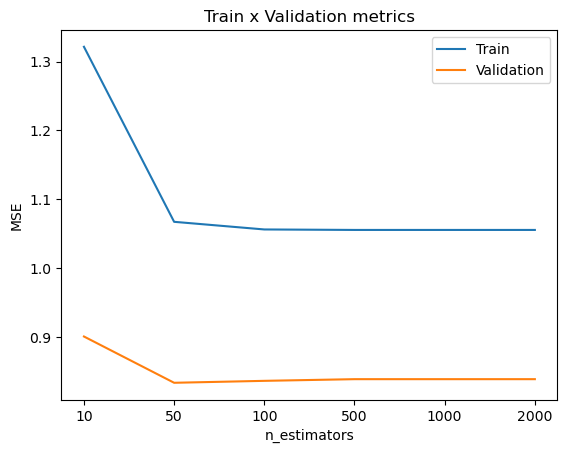

In [212]:
plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('MSE')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(MSE_list_train)
plt.plot(MSE_list_val)
plt.legend(['Train','Validation']);

In [213]:
ind_n_estimators = np.argmin(MSE_list_val)
ind_n_estimators

1

In [214]:
best_n_estimators = n_estimators_list[ind_n_estimators]
best_n_estimators

50

In [215]:
xgb_do_model = XGBRegressor(n_estimators = 50, learning_rate = 0.1,verbosity = 1,random_state = 123)
xgb_do_model.fit(X_train_fit,y_train_fit, eval_set = [(X_train_eval,y_train_eval)])

[0]	validation_0-rmse:6.49264
[1]	validation_0-rmse:5.97039
[2]	validation_0-rmse:5.50400
[3]	validation_0-rmse:5.08902
[4]	validation_0-rmse:4.72710
[5]	validation_0-rmse:4.39952
[6]	validation_0-rmse:4.11709
[7]	validation_0-rmse:3.86609
[8]	validation_0-rmse:3.64842
[9]	validation_0-rmse:3.45520
[10]	validation_0-rmse:3.29215
[11]	validation_0-rmse:3.14723
[12]	validation_0-rmse:3.02315
[13]	validation_0-rmse:2.91327
[14]	validation_0-rmse:2.82361
[15]	validation_0-rmse:2.74436
[16]	validation_0-rmse:2.67382
[17]	validation_0-rmse:2.61006
[18]	validation_0-rmse:2.55748
[19]	validation_0-rmse:2.51188
[20]	validation_0-rmse:2.47551
[21]	validation_0-rmse:2.44537
[22]	validation_0-rmse:2.41952
[23]	validation_0-rmse:2.39301
[24]	validation_0-rmse:2.37352
[25]	validation_0-rmse:2.35787
[26]	validation_0-rmse:2.34270
[27]	validation_0-rmse:2.33396
[28]	validation_0-rmse:2.32233
[29]	validation_0-rmse:2.31558
[30]	validation_0-rmse:2.30736
[31]	validation_0-rmse:2.29964
[32]	validation_0-

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=50, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=123, ...)

In [216]:
xgb_do_model.best_iteration

49

In [217]:
print(f"MSE for train:\n\tMSE: {MSE(xgb_do_model.predict(X_train),y_train):.4f}")
print(f"MSE for validation:\n\tMSE: {MSE(xgb_do_model.predict(X_val),y_val):.4f}")

MSE for train:
	MSE: 1.1110
MSE for validation:
	MSE: 0.7280


In [218]:
y_pred_do = xgb_do_model.predict(X_val)

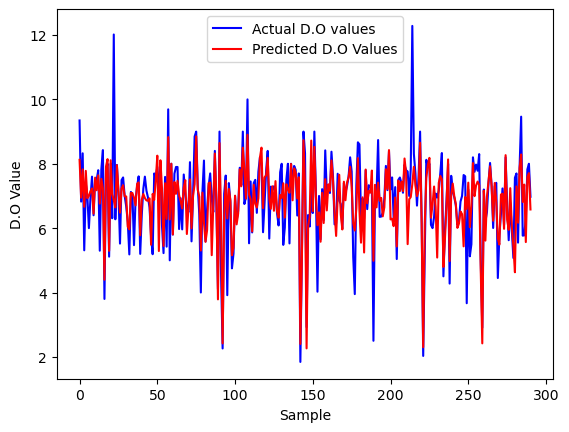

In [219]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O values')
plt.plot(range(len(y_pred_do)),y_pred_do,'r',label='Predicted D.O Values')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('D.O Value');

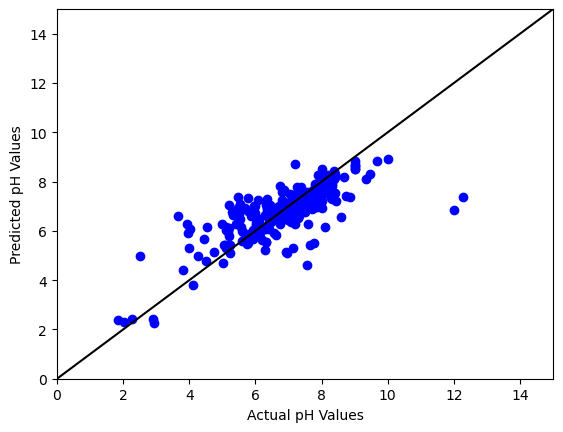

In [220]:
mn = 0
mx = 15

plt.scatter(y_val, y_pred_do, c='b')
plt.plot([mn,mx], [mn,mx], 'k')
plt.xlim([mn, mx])
plt.ylim([mn, mx])
plt.xlabel('Actual pH Values')
plt.ylabel('Predicted pH Values');

In [221]:
diff_do = y_pred_do - y_val

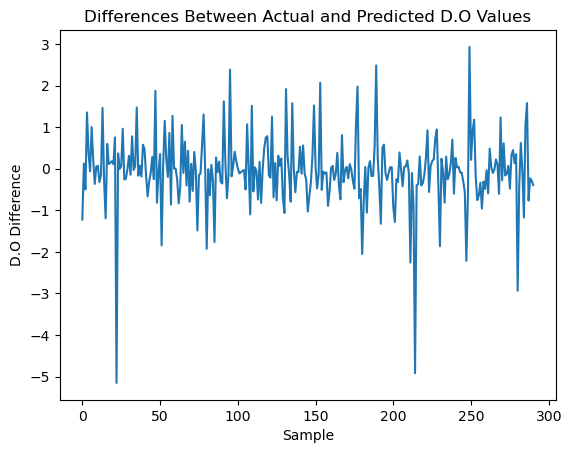

In [222]:
plt.plot(range(len(diff_do)),diff_do)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('D.O Difference');

In [357]:
norm = tf.keras.layers.Normalization(axis=-1)
norm.adapt(X_train)
Xn = norm(X_train)

In [358]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(40, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 29.4500
Epoch 2/1000
25/25 [==============================] - 0s 2ms/step - loss: 5.5385
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 3.2711
Epoch 4/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.7374
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.4721
Epoch 6/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.3793
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2922
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2299
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2165
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2077
Epoch 11/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2444
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1962
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8996
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9518
Epoch 103/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8804
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9340
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9640
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9927
Epoch 107/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8888
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9781
Epoch 109/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8555
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8155
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8553
Epoch 112/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8343
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 1.6924
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6835
Epoch 299/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6785
Epoch 300/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6659
Epoch 301/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7299
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6312
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8233
Epoch 304/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7299
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6771
Epoch 306/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7454
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6802
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6651
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.8561
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6694
Epoch 495/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7270
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6578
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6060
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.7946
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8113
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6896
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6239
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6826
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6615
Epoch 504/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6205
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.6044
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5505
Epoch 691/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5238
Epoch 692/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5310
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6104
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7012
Epoch 695/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5954
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6093
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4960
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5096
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5940
Epoch 700/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5826
Epoch 701/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.6467
Epoch 886/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6533
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6590
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6629
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6055
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6215
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5878
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6059
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6028
Epoch 894/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5823
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6137
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5788
Epoch 897/1000
25/2

In [359]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [360]:
MSE_pred

[1.3255263990963309]

In [361]:
MSE_pred

[1.3255263990963309]

In [362]:
MSE_train

[1.3747545169544495]

In [363]:
MSE_train

[1.3747545169544495]

In [364]:
yhat_pred

array([[ 9.528961 ],
       [ 6.8409433],
       [ 6.988309 ],
       [ 7.5274487],
       [ 7.1740503],
       [ 5.362838 ],
       [ 6.863184 ],
       [ 7.089074 ],
       [ 7.566148 ],
       [ 6.313751 ],
       [ 7.9951715],
       [ 6.602895 ],
       [ 6.642126 ],
       [ 6.7672462],
       [ 7.1692286],
       [ 7.198083 ],
       [ 4.961833 ],
       [ 6.954275 ],
       [ 8.392263 ],
       [ 4.51591  ],
       [ 7.815404 ],
       [ 6.8957167],
       [ 9.127035 ],
       [ 6.3939304],
       [ 8.391462 ],
       [ 7.1848106],
       [ 7.4520626],
       [ 7.171174 ],
       [ 6.8254156],
       [ 6.9604015],
       [ 6.742975 ],
       [ 6.952903 ],
       [ 5.8496904],
       [ 7.3651066],
       [ 6.989564 ],
       [ 7.0994825],
       [ 6.440896 ],
       [ 7.197549 ],
       [ 7.316187 ],
       [ 4.681657 ],
       [ 6.463107 ],
       [ 7.106124 ],
       [ 6.747061 ],
       [ 7.4129295],
       [ 6.578516 ],
       [ 7.428815 ],
       [ 6.6031656],
       [ 7.40

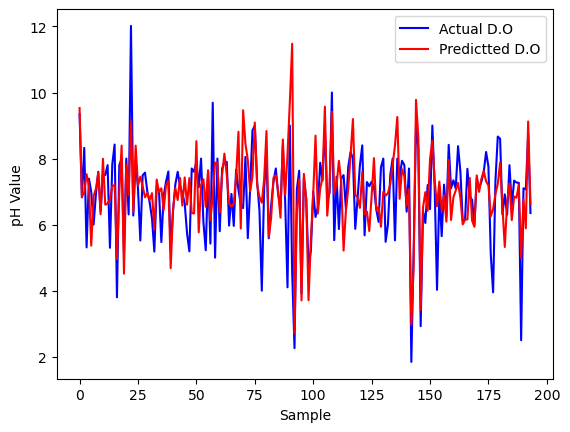

In [365]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [366]:
diff_pH = yhat_pred.flatten() - y_val

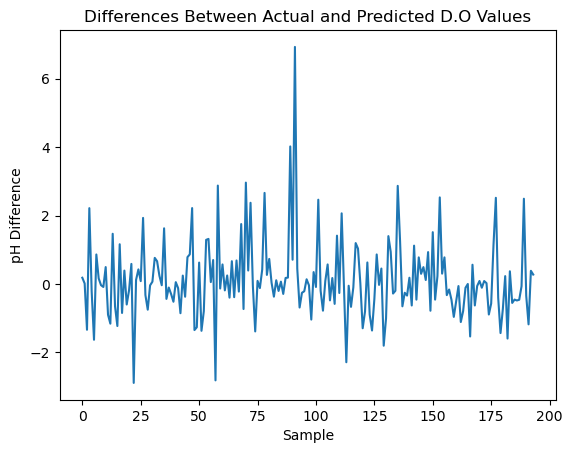

In [367]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [368]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 22.5759
Epoch 2/1000
25/25 [==============================] - 0s 3ms/step - loss: 5.3349
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 3.3095
Epoch 4/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.6329
Epoch 5/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.3999
Epoch 6/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.3742
Epoch 7/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2025
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2009
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1916
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1497
Epoch 11/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2704
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1832
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8763
Epoch 102/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9502
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8579
Epoch 104/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9597
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9086
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9730
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8841
Epoch 108/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.0693
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9304
Epoch 110/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8006
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8173
Epoch 112/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7967
Epoc

25/25 [==============================] - 0s 4ms/step - loss: 1.7019
Epoch 298/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.6325
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6010
Epoch 300/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5898
Epoch 301/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.6467
Epoch 302/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5821
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7304
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6373
Epoch 305/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5746
Epoch 306/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6396
Epoch 307/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6126
Epoch 308/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5765
Epoch 309/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.6626
Epoch 494/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6174
Epoch 495/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.6917
Epoch 496/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5857
Epoch 497/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5558
Epoch 498/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.8211
Epoch 499/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8561
Epoch 500/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7252
Epoch 501/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6236
Epoch 502/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6111
Epoch 503/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6235
Epoch 504/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5678
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.6043
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5622
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5703
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4997
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5394
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6119
Epoch 695/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5288
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5110
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5241
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5410
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6770
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6403
Epoch 701/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.4884
Epoch 886/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4858
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5351
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6012
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5023
Epoch 890/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5665
Epoch 891/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5416
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5193
Epoch 893/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4803
Epoch 894/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4975
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5758
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5580
Epoch 897/1000
25/2

In [369]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [370]:
MSE_pred

[1.2149492427675552]

In [371]:
MSE_pred

[1.2149492427675552]

In [372]:
MSE_train

[1.3060830366253116]

In [373]:
MSE_train

[1.3060830366253116]

In [374]:
yhat_pred

array([[ 8.740834 ],
       [ 6.814686 ],
       [ 7.372554 ],
       [ 7.2679586],
       [ 7.1862326],
       [ 5.41257  ],
       [ 7.2789354],
       [ 6.7834625],
       [ 7.9532747],
       [ 5.9438596],
       [ 8.020774 ],
       [ 6.557437 ],
       [ 6.143635 ],
       [ 6.825995 ],
       [ 7.4157686],
       [ 7.664612 ],
       [ 5.6807804],
       [ 6.6027637],
       [ 8.202057 ],
       [ 4.021391 ],
       [ 7.8746786],
       [ 6.688588 ],
       [ 8.8258705],
       [ 6.395527 ],
       [ 7.8955784],
       [ 7.809541 ],
       [ 7.395341 ],
       [ 7.3019085],
       [ 6.9796543],
       [ 7.9054728],
       [ 7.5604944],
       [ 6.126443 ],
       [ 5.8013005],
       [ 7.6259084],
       [ 6.966149 ],
       [ 6.7888203],
       [ 6.5721726],
       [ 7.421737 ],
       [ 7.2556643],
       [ 5.612617 ],
       [ 6.3715587],
       [ 7.1549077],
       [ 7.3071637],
       [ 7.7881794],
       [ 6.503559 ],
       [ 7.396802 ],
       [ 6.792624 ],
       [ 7.39

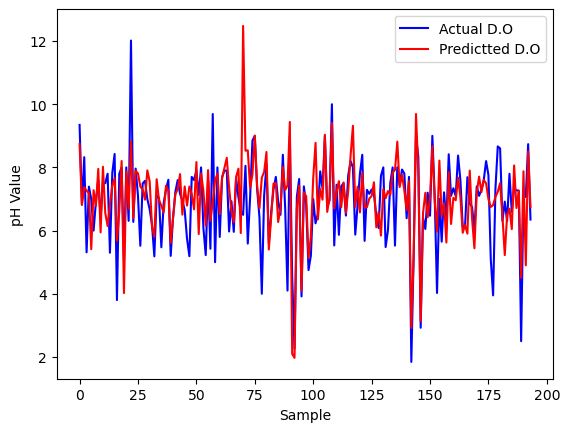

In [375]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [376]:
diff_pH = yhat_pred.flatten() - y_val

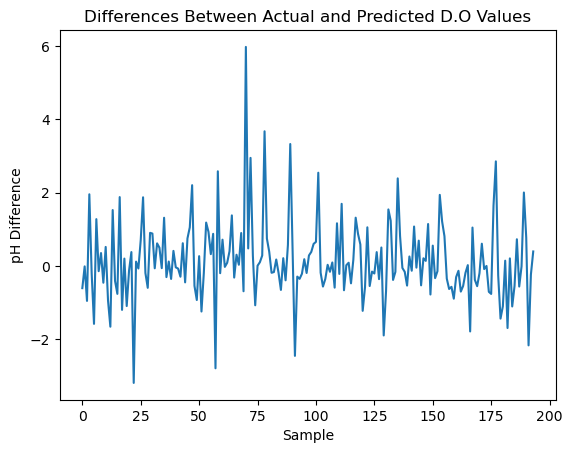

In [377]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [378]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(40, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 2s 3ms/step - loss: 17.8444
Epoch 2/1000
25/25 [==============================] - 0s 3ms/step - loss: 3.9348
Epoch 3/1000
25/25 [==============================] - 0s 3ms/step - loss: 3.2688
Epoch 4/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.5606
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3306
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2795
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1960
Epoch 8/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2475
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2267
Epoch 10/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2142
Epoch 11/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2324
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1114
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8665
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9967
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8120
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8811
Epoch 105/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9136
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9954
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8228
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1630
Epoch 109/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.0283
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8100
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8093
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7716
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 1.5688
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5428
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5457
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5374
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5894
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5085
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7358
Epoch 304/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.6433
Epoch 305/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5574
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5652
Epoch 307/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5523
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4944
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.4572
Epoch 494/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3712
Epoch 495/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3650
Epoch 496/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3510
Epoch 497/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3298
Epoch 498/1000
25/25 [==============================] - 0s 3ms/step - loss: 3.0329
Epoch 499/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8747
Epoch 500/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6257
Epoch 501/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5019
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4387
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4235
Epoch 504/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3976
Epoch 505/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.4103
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4339
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3648
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2960
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3553
Epoch 694/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3894
Epoch 695/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2735
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3846
Epoch 697/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2457
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2196
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3297
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3008
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.4572
Epoch 886/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4263
Epoch 887/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4033
Epoch 888/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4500
Epoch 889/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3765
Epoch 890/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3708
Epoch 891/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3712
Epoch 892/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3705
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3926
Epoch 894/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3780
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3733
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3470
Epoch 897/1000
25/2

In [379]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [380]:
MSE_pred

[1.1075995382566781]

In [381]:
MSE_pred

[1.1075995382566781]

In [382]:
MSE_train

[0.761655328269732]

In [383]:
MSE_train

[0.761655328269732]

In [384]:
yhat_pred

array([[ 8.843645 ],
       [ 7.3423977],
       [ 7.187645 ],
       [ 7.010048 ],
       [ 7.440406 ],
       [ 7.1153936],
       [ 7.0247993],
       [ 6.9232597],
       [ 7.471157 ],
       [ 6.179533 ],
       [ 6.377753 ],
       [ 4.6741858],
       [ 7.203677 ],
       [ 7.0918703],
       [ 7.341272 ],
       [ 7.096408 ],
       [ 3.4631572],
       [ 7.4079304],
       [ 8.364091 ],
       [ 5.628042 ],
       [ 8.432025 ],
       [ 6.67253  ],
       [ 9.717287 ],
       [ 5.971738 ],
       [ 7.647793 ],
       [ 7.234031 ],
       [ 6.829274 ],
       [ 7.279314 ],
       [ 6.775091 ],
       [ 6.363729 ],
       [ 6.4342885],
       [ 6.0483556],
       [ 5.474783 ],
       [ 7.142189 ],
       [ 7.0190673],
       [ 6.6807823],
       [ 6.905626 ],
       [ 7.719752 ],
       [ 7.263345 ],
       [ 5.0085154],
       [ 6.2444572],
       [ 7.149015 ],
       [ 7.274666 ],
       [ 7.1444397],
       [ 6.3162374],
       [ 7.105524 ],
       [ 8.660817 ],
       [ 7.35

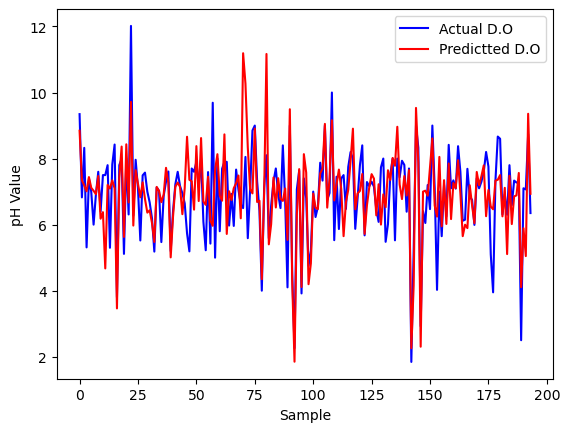

In [385]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [386]:
diff_pH = yhat_pred.flatten() - y_val

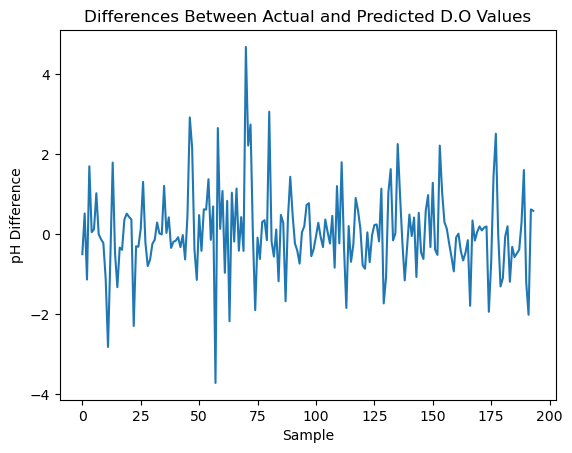

In [387]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [388]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 3ms/step - loss: 20.2052
Epoch 2/1000
25/25 [==============================] - 0s 5ms/step - loss: 4.2673
Epoch 3/1000
25/25 [==============================] - 0s 5ms/step - loss: 3.3662
Epoch 4/1000
25/25 [==============================] - 0s 6ms/step - loss: 2.6750
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3957
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3472
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2487
Epoch 8/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3388
Epoch 9/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.2658
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2408
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1933
Epoch 12/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1173
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8214
Epoch 102/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.9035
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7522
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8888
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8650
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9764
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8126
Epoch 108/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1105
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9094
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7779
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7387
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7369
Epoc

25/25 [==============================] - 0s 5ms/step - loss: 1.4965
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4768
Epoch 299/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5007
Epoch 300/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4491
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5201
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4249
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5665
Epoch 304/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4670
Epoch 305/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4261
Epoch 306/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4284
Epoch 307/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4794
Epoch 308/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.4758
Epoch 309/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.4678
Epoch 494/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.3608
Epoch 495/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.3833
Epoch 496/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2697
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3100
Epoch 498/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.8196
Epoch 499/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6851
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5760
Epoch 501/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5147
Epoch 502/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4864
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4678
Epoch 504/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4016
Epoch 505/1000
25/2

25/25 [==============================] - 0s 5ms/step - loss: 1.4263
Epoch 690/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.3746
Epoch 691/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.3273
Epoch 692/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.2477
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3035
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2413
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1690
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2895
Epoch 697/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1366
Epoch 698/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.2182
Epoch 699/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.3303
Epoch 700/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.3319
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 0.9794
Epoch 886/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.0139
Epoch 887/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.0905
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.9727
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.0304
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.9520
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.9878
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2229
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.9860
Epoch 894/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.9303
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 0.9044
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 0.9210
Epoch 897/1000
25/2

In [389]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [390]:
MSE_pred

[1.647519348393541]

In [391]:
MSE_pred

[1.647519348393541]

In [392]:
MSE_train

[1.1397967129822346]

In [393]:
MSE_train

[1.1397967129822346]

In [394]:
yhat_pred

array([[ 8.654251 ],
       [ 7.3078356],
       [ 7.0485115],
       [ 8.080935 ],
       [ 6.9393177],
       [ 6.9626656],
       [ 7.1445503],
       [ 6.9836435],
       [ 7.1972685],
       [ 6.370839 ],
       [ 6.9444923],
       [ 8.082242 ],
       [ 7.1950636],
       [ 7.991933 ],
       [ 7.8663607],
       [ 7.1307154],
       [ 3.1101956],
       [ 5.7929754],
       [ 8.914756 ],
       [ 4.3547163],
       [ 7.720216 ],
       [ 6.8832436],
       [ 9.479311 ],
       [ 6.490139 ],
       [ 7.4667654],
       [ 6.9395247],
       [ 6.836341 ],
       [ 7.275838 ],
       [ 7.7051926],
       [ 6.5988398],
       [ 6.8253546],
       [ 6.7128086],
       [ 5.5759   ],
       [ 7.2438164],
       [ 7.133712 ],
       [ 7.2355757],
       [ 7.3554068],
       [ 7.531229 ],
       [ 7.3771105],
       [ 7.0831003],
       [ 6.372468 ],
       [ 6.9679804],
       [ 7.325056 ],
       [ 7.058853 ],
       [ 6.47326  ],
       [ 7.072406 ],
       [ 8.329183 ],
       [ 7.84

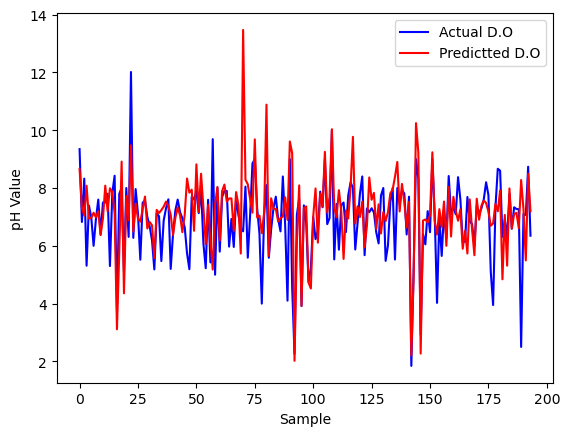

In [395]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [396]:
diff_pH = yhat_pred.flatten() - y_val

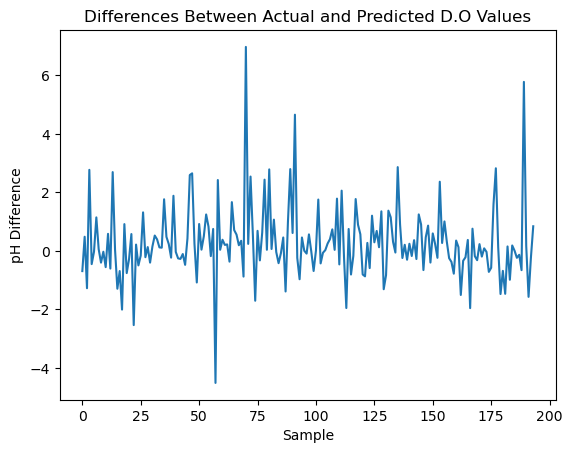

In [397]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [398]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 2ms/step - loss: 18.0431
Epoch 2/1000
25/25 [==============================] - 0s 3ms/step - loss: 4.0477
Epoch 3/1000
25/25 [==============================] - 0s 3ms/step - loss: 3.1399
Epoch 4/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.6315
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2972
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3234
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2045
Epoch 8/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2426
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2104
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1958
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2211
Epoch 12/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1314
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8179
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9001
Epoch 103/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7831
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8687
Epoch 105/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8685
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9369
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8140
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.0942
Epoch 109/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9243
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7798
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7766
Epoch 112/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7734
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 1.5402
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5251
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5181
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5334
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5936
Epoch 302/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5076
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6524
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5059
Epoch 305/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4853
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5519
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5438
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4930
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.3496
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3148
Epoch 495/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3225
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2716
Epoch 497/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3152
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.7514
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7634
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6942
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4822
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4853
Epoch 503/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4837
Epoch 504/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4446
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.3089
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2848
Epoch 691/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3294
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2221
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2718
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2698
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2078
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2499
Epoch 697/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2327
Epoch 698/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1979
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3482
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3808
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.2153
Epoch 886/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2250
Epoch 887/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1991
Epoch 888/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3002
Epoch 889/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2410
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2252
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2089
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2107
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.1856
Epoch 894/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.1289
Epoch 895/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1442
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1391
Epoch 897/1000
25/2

In [399]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [400]:
MSE_pred

[1.2515927882066769]

In [401]:
MSE_pred

[1.2515927882066769]

In [402]:
MSE_train

[0.9229615096126016]

In [403]:
MSE_train

[0.9229615096126016]

In [404]:
yhat_pred

array([[ 9.562913 ],
       [ 7.123466 ],
       [ 6.7684345],
       [ 7.634826 ],
       [ 7.632732 ],
       [ 5.589908 ],
       [ 6.9779253],
       [ 6.8153257],
       [ 8.301717 ],
       [ 6.40742  ],
       [ 8.154954 ],
       [ 7.5216947],
       [ 7.0116615],
       [ 7.148959 ],
       [ 7.6115165],
       [ 7.217347 ],
       [ 3.366064 ],
       [ 6.8144774],
       [ 8.39436  ],
       [ 1.7869793],
       [ 7.3680997],
       [ 6.937132 ],
       [ 7.7508607],
       [ 6.666258 ],
       [ 7.3571506],
       [ 7.4366765],
       [ 5.516458 ],
       [ 7.0323334],
       [ 7.7254376],
       [ 6.999165 ],
       [ 6.2090087],
       [ 6.11575  ],
       [ 5.3709416],
       [ 7.23782  ],
       [ 7.214565 ],
       [ 6.9564824],
       [ 7.24051  ],
       [ 7.153979 ],
       [ 7.254415 ],
       [ 5.435647 ],
       [ 6.8243966],
       [ 7.0906796],
       [ 6.940497 ],
       [ 7.479221 ],
       [ 6.448464 ],
       [ 6.476187 ],
       [ 7.175117 ],
       [ 8.00

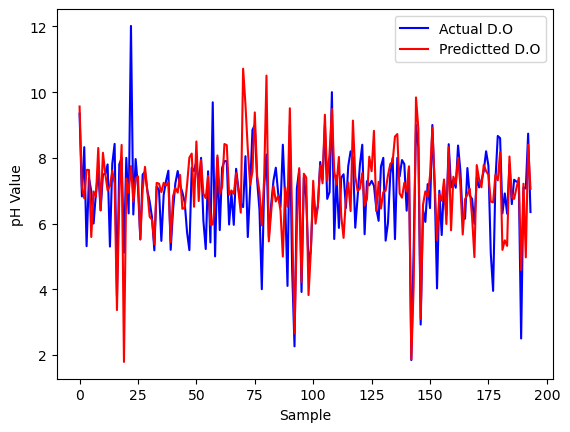

In [405]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [406]:
diff_pH = yhat_pred.flatten() - y_val

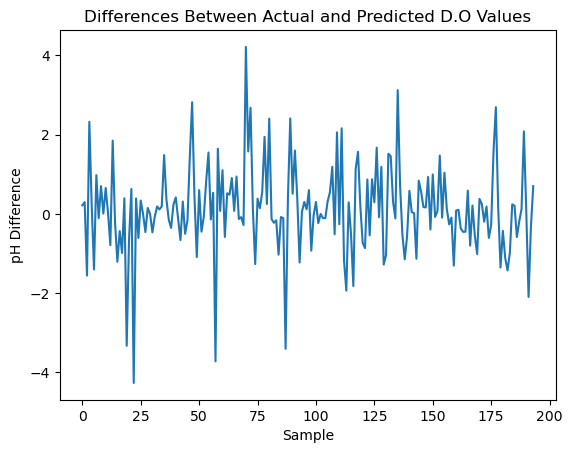

In [407]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [408]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(20, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 3ms/step - loss: 19.3643
Epoch 2/1000
25/25 [==============================] - 0s 2ms/step - loss: 3.8640
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 3.0245
Epoch 4/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.5371
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3307
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3213
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2108
Epoch 8/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2600
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2308
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2345
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2240
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1180
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8504
Epoch 102/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9099
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8203
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9231
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8776
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9533
Epoch 107/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8655
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1263
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9454
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8304
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8146
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7991
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 1.4172
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4197
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4186
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4288
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4654
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3969
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4900
Epoch 304/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4208
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4059
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4137
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4313
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4214
Epoch 309/1000
25/2

25/25 [==============================] - 0s 2ms/step - loss: 1.4634
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4285
Epoch 495/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4010
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4175
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3354
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.5794
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5262
Epoch 500/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4040
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3885
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4326
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4384
Epoch 504/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3808
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.3554
Epoch 690/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3422
Epoch 691/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3427
Epoch 692/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2684
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3232
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3442
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3353
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3307
Epoch 697/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2864
Epoch 698/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2710
Epoch 699/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5202
Epoch 700/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4675
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.2604
Epoch 886/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3402
Epoch 887/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2550
Epoch 888/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2986
Epoch 889/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2740
Epoch 890/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2893
Epoch 891/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2875
Epoch 892/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2701
Epoch 893/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2848
Epoch 894/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3144
Epoch 895/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3078
Epoch 896/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2475
Epoch 897/1000
25/2

In [409]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [410]:
MSE_pred

[2.2050309802774493]

In [411]:
MSE_pred

[2.2050309802774493]

In [412]:
MSE_train

[1.115370290171762]

In [413]:
MSE_train

[1.115370290171762]

In [414]:
yhat_pred

array([[ 9.268432 ],
       [ 7.2085567],
       [ 7.340039 ],
       [ 7.40175  ],
       [ 6.922777 ],
       [ 6.3803606],
       [ 7.6436877],
       [ 7.3799205],
       [ 7.228876 ],
       [ 6.7177634],
       [ 7.7925553],
       [ 6.0641665],
       [ 7.2830434],
       [ 7.2398324],
       [ 8.015379 ],
       [ 7.4695673],
       [ 4.3442235],
       [ 5.7149596],
       [ 8.907128 ],
       [ 5.1465497],
       [ 8.601809 ],
       [ 7.175611 ],
       [ 9.99033  ],
       [ 6.2593513],
       [ 8.099943 ],
       [ 7.4224014],
       [ 6.319594 ],
       [ 7.6008267],
       [ 7.4942913],
       [ 7.136501 ],
       [ 7.4810767],
       [ 6.2840276],
       [ 6.0246086],
       [ 7.460939 ],
       [ 7.4943085],
       [ 7.595691 ],
       [ 7.425901 ],
       [ 7.6721754],
       [ 7.7642503],
       [ 4.584334 ],
       [ 6.5712676],
       [ 7.559794 ],
       [ 7.495284 ],
       [ 7.4473906],
       [ 6.602948 ],
       [ 7.4507513],
       [ 7.5289006],
       [ 7.59

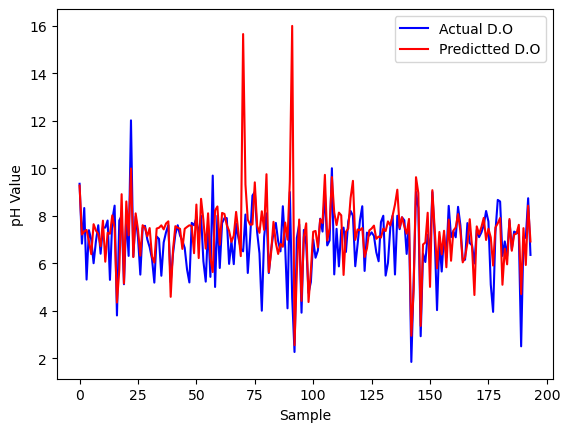

In [415]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [416]:
diff_pH = yhat_pred.flatten() - y_val

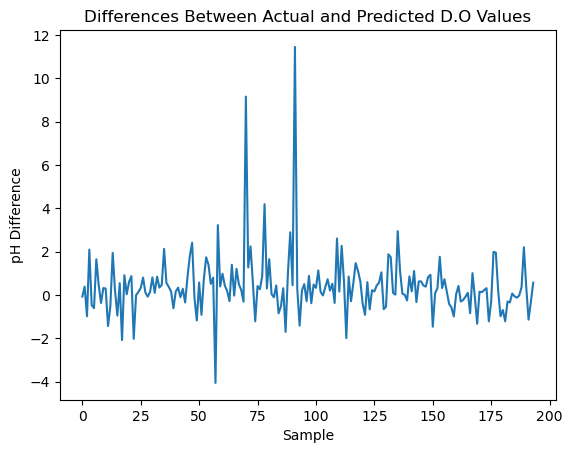

In [417]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [418]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(40, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 3ms/step - loss: 16.5205
Epoch 2/1000
25/25 [==============================] - 0s 2ms/step - loss: 3.8073
Epoch 3/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.9326
Epoch 4/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.6358
Epoch 5/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.3122
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3555
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2084
Epoch 8/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2447
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2168
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1969
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2909
Epoch 12/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1340
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8254
Epoch 102/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9453
Epoch 103/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7601
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8513
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8397
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9591
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7625
Epoch 108/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.0596
Epoch 109/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9246
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7619
Epoch 111/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7551
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7512
Epoc

25/25 [==============================] - 0s 2ms/step - loss: 1.6845
Epoch 298/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6099
Epoch 299/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5738
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5598
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6526
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5273
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6923
Epoch 304/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.6203
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5400
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5413
Epoch 307/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5446
Epoch 308/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5012
Epoch 309/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.6997
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5667
Epoch 495/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5475
Epoch 496/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5154
Epoch 497/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4964
Epoch 498/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.8449
Epoch 499/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8040
Epoch 500/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6116
Epoch 501/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5454
Epoch 502/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5560
Epoch 503/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5584
Epoch 504/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.5233
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.3391
Epoch 690/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3492
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3432
Epoch 692/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3026
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3616
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4150
Epoch 695/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3589
Epoch 696/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3732
Epoch 697/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3193
Epoch 698/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3008
Epoch 699/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4355
Epoch 700/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4012
Epoch 701/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 1.4082
Epoch 886/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4031
Epoch 887/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4472
Epoch 888/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4330
Epoch 889/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4022
Epoch 890/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3866
Epoch 891/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4058
Epoch 892/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3836
Epoch 893/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3872
Epoch 894/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.3646
Epoch 895/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4236
Epoch 896/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4231
Epoch 897/1000
25/2

In [419]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [420]:
MSE_pred

[1.314693566711787]

In [421]:
MSE_pred

[1.314693566711787]

In [422]:
MSE_train

[0.9498384748740049]

In [423]:
MSE_train

[0.9498384748740049]

In [424]:
yhat_pred

array([[ 9.500085 ],
       [ 6.8941827],
       [ 6.9042544],
       [ 7.5594773],
       [ 6.655675 ],
       [ 7.0815673],
       [ 7.277043 ],
       [ 7.2296634],
       [ 7.927921 ],
       [ 6.3516517],
       [ 7.2149634],
       [ 7.459121 ],
       [ 7.099486 ],
       [ 7.3912416],
       [ 7.4141765],
       [ 7.0101295],
       [ 5.1254873],
       [ 6.7804394],
       [ 8.422261 ],
       [ 4.053207 ],
       [ 8.172274 ],
       [ 7.0916324],
       [ 9.489046 ],
       [ 6.3075614],
       [ 8.191807 ],
       [ 7.9188857],
       [ 6.434962 ],
       [ 7.2226653],
       [ 7.058354 ],
       [ 6.7221637],
       [ 6.5289407],
       [ 6.344458 ],
       [ 5.758093 ],
       [ 7.5189996],
       [ 7.1506615],
       [ 6.8944387],
       [ 6.4546328],
       [ 7.5559945],
       [ 7.30207  ],
       [ 7.2113285],
       [ 6.5675683],
       [ 7.2611856],
       [ 7.1055717],
       [ 7.3756385],
       [ 6.5190253],
       [ 6.9567137],
       [ 6.6596265],
       [ 7.88

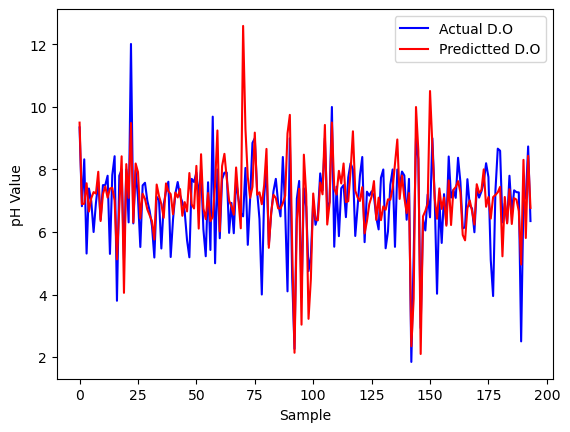

In [425]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [426]:
diff_pH = yhat_pred.flatten() - y_val

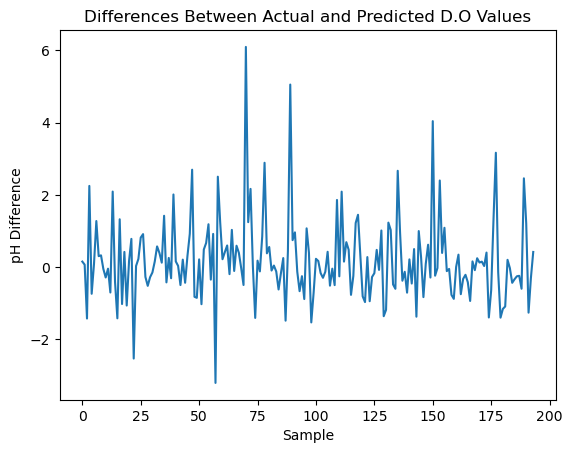

In [427]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [428]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 1s 3ms/step - loss: 16.3043
Epoch 2/1000
25/25 [==============================] - 0s 3ms/step - loss: 3.7819
Epoch 3/1000
25/25 [==============================] - 0s 3ms/step - loss: 3.0717
Epoch 4/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.6740
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3714
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3761
Epoch 7/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2421
Epoch 8/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2847
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2571
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2456
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3004
Epoch 12/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2095
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8551
Epoch 102/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9701
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7581
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8775
Epoch 105/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.8701
Epoch 106/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.9923
Epoch 107/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.7566
Epoch 108/1000
25/25 [==============================] - 0s 2ms/step - loss: 2.1832
Epoch 109/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9642
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7697
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7643
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7487
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 1.5168
Epoch 298/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4748
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4811
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4525
Epoch 301/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4954
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4524
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5559
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5039
Epoch 305/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4387
Epoch 306/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.4463
Epoch 307/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4691
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4343
Epoch 309/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.4269
Epoch 494/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3504
Epoch 495/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3436
Epoch 496/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3691
Epoch 497/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2763
Epoch 498/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.6963
Epoch 499/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8298
Epoch 500/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4729
Epoch 501/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.4110
Epoch 502/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3424
Epoch 503/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3587
Epoch 504/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3291
Epoch 505/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.3100
Epoch 690/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3404
Epoch 691/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2982
Epoch 692/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3282
Epoch 693/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.2825
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2679
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2974
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3713
Epoch 697/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2548
Epoch 698/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2224
Epoch 699/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3239
Epoch 700/1000
25/25 [==============================] - 0s 2ms/step - loss: 1.3184
Epoch 701/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 1.1464
Epoch 886/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1686
Epoch 887/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1622
Epoch 888/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1522
Epoch 889/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1596
Epoch 890/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1633
Epoch 891/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1654
Epoch 892/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1973
Epoch 893/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1289
Epoch 894/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1298
Epoch 895/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1365
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1313
Epoch 897/1000
25/2

In [429]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 2ms/step


In [430]:
MSE_pred

[1.717480145645622]

In [431]:
MSE_pred

[1.717480145645622]

In [432]:
MSE_train

[0.7771690141582375]

In [433]:
MSE_train

[0.7771690141582375]

In [434]:
yhat_pred

array([[ 9.548546 ],
       [ 6.9034514],
       [ 6.964562 ],
       [ 7.42946  ],
       [ 7.0065866],
       [ 5.8020787],
       [ 7.2806   ],
       [ 6.9218035],
       [ 8.772496 ],
       [ 6.40334  ],
       [ 7.1134505],
       [ 7.2650843],
       [ 7.5290136],
       [ 7.4093547],
       [ 7.900376 ],
       [ 6.9568796],
       [ 3.2521038],
       [ 8.000621 ],
       [ 8.4770565],
       [ 4.618049 ],
       [ 7.6702776],
       [ 6.827766 ],
       [ 8.858544 ],
       [ 6.5536647],
       [ 7.6100607],
       [ 7.2144794],
       [ 6.943169 ],
       [ 7.179182 ],
       [ 7.15512  ],
       [ 6.373052 ],
       [ 6.4118323],
       [ 6.373092 ],
       [ 5.308132 ],
       [ 7.3392572],
       [ 6.6045427],
       [ 6.5628915],
       [ 7.384792 ],
       [ 7.819037 ],
       [ 7.2055936],
       [ 3.5643911],
       [ 6.421664 ],
       [ 6.9188914],
       [ 7.130768 ],
       [ 7.524651 ],
       [ 6.4028125],
       [ 7.136076 ],
       [ 7.005345 ],
       [ 7.64

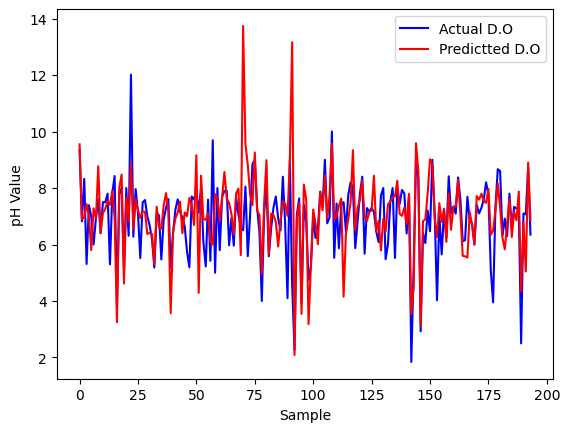

In [435]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual D.O')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted D.O')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [436]:
diff_pH = yhat_pred.flatten() - y_val

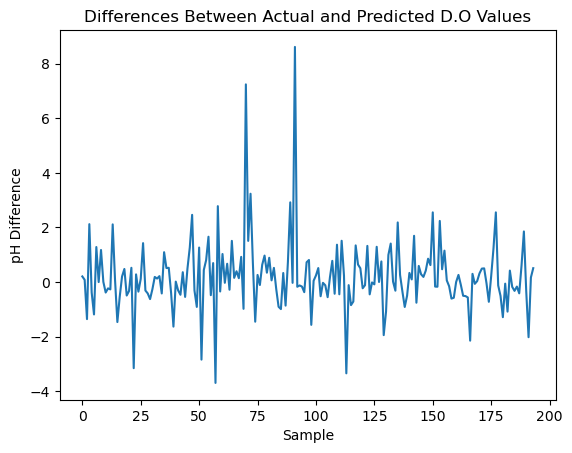

In [437]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted D.O Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [438]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 2s 3ms/step - loss: 25.8781
Epoch 2/1000
25/25 [==============================] - 0s 3ms/step - loss: 5.2673
Epoch 3/1000
25/25 [==============================] - 0s 3ms/step - loss: 3.0372
Epoch 4/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.7824
Epoch 5/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.5492
Epoch 6/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.3659
Epoch 7/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.2714
Epoch 8/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.3192
Epoch 9/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.2062
Epoch 10/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2490
Epoch 11/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.2532
Epoch 12/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.1939
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7083
Epoch 102/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6223
Epoch 103/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6223
Epoch 104/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5910
Epoch 105/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6525
Epoch 106/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7084
Epoch 107/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6388
Epoch 108/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9145
Epoch 109/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7920
Epoch 110/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6556
Epoch 111/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6097
Epoch 112/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5729
Epoc

25/25 [==============================] - 0s 3ms/step - loss: 1.6941
Epoch 298/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6574
Epoch 299/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6207
Epoch 300/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5980
Epoch 301/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6148
Epoch 302/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6346
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6339
Epoch 304/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5779
Epoch 305/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5952
Epoch 306/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5328
Epoch 307/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5629
Epoch 308/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.6338
Epoch 309/1000
25/2

25/25 [==============================] - 0s 5ms/step - loss: 1.2454
Epoch 494/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.2555
Epoch 495/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.3565
Epoch 496/1000
25/25 [==============================] - 0s 8ms/step - loss: 1.0006
Epoch 497/1000
25/25 [==============================] - 0s 6ms/step - loss: 0.9633
Epoch 498/1000
25/25 [==============================] - 0s 6ms/step - loss: 3.4962
Epoch 499/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9191
Epoch 500/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8178
Epoch 501/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.6803
Epoch 502/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.7021
Epoch 503/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8117
Epoch 504/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.7857
Epoch 505/1000
25/2

25/25 [==============================] - 0s 5ms/step - loss: 1.8937
Epoch 690/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8757
Epoch 691/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8664
Epoch 692/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8259
Epoch 693/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7838
Epoch 694/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7815
Epoch 695/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7838
Epoch 696/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7643
Epoch 697/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7410
Epoch 698/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7089
Epoch 699/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7370
Epoch 700/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7773
Epoch 701/1000
25/2

25/25 [==============================] - 0s 3ms/step - loss: 1.9281
Epoch 886/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.8634
Epoch 887/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.7982
Epoch 888/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.7475
Epoch 889/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7168
Epoch 890/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.7449
Epoch 891/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.2441
Epoch 892/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.3584
Epoch 893/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1474
Epoch 894/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.1101
Epoch 895/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.0661
Epoch 896/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.0719
Epoch 897/1000
25/2

In [439]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 4ms/step


In [440]:
MSE_pred

[1.550344068149043]

In [441]:
MSE_train

[0.6931649302189828]

In [442]:
yhat_pred

array([[ 8.730195 ],
       [ 7.071965 ],
       [ 7.525509 ],
       [13.682192 ],
       [ 6.76376  ],
       [ 7.8583145],
       [ 6.9866557],
       [ 6.85911  ],
       [ 8.078326 ],
       [ 6.76376  ],
       [ 7.723541 ],
       [ 8.142375 ],
       [ 7.460678 ],
       [ 7.3749337],
       [ 7.5391254],
       [ 6.784218 ],
       [ 4.246205 ],
       [ 6.768489 ],
       [ 8.544873 ],
       [ 4.2656827],
       [ 7.3255997],
       [ 7.2055545],
       [ 9.966934 ],
       [ 6.76376  ],
       [ 8.165899 ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 7.0727267],
       [ 6.916606 ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 7.103687 ],
       [ 6.76376  ],
       [ 7.3800335],
       [ 7.1649494],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.76376  ],
       [ 6.9665427],
       [ 7.4339633],
       [ 8.59

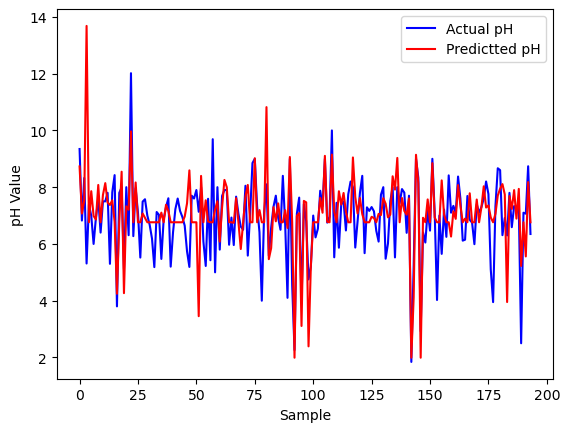

In [443]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [444]:
diff_pH = yhat_pred.flatten()- y_val

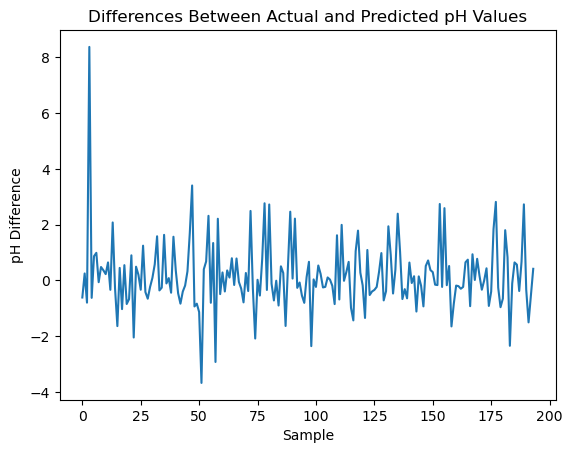

In [445]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

In [446]:
lamdas = [0.001]
models = [None] * len(lamdas)

for i in range(len(lamdas)):
    lamda_ = lamdas[i]
    models[i] = Sequential(
        [
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(40, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(100, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(120, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(80, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(60, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(20, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(10, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(lamda_)),
            Dense(1, activation='linear')            
        ]
    )
    models[i].compile(
        loss = tf.keras.losses.MeanSquaredError(),
        optimizer = tf.keras.optimizers.Adam(0.01),
    )
    models[i].fit(
        Xn,y_train,
        epochs=1000
    )
    print(f"Finished lamda = {lamda_}")

Epoch 1/1000
25/25 [==============================] - 3s 4ms/step - loss: 15.0097
Epoch 2/1000
25/25 [==============================] - 0s 4ms/step - loss: 3.4027
Epoch 3/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.7513
Epoch 4/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.7631
Epoch 5/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.6084
Epoch 6/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.5258
Epoch 7/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.3754
Epoch 8/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.6409
Epoch 9/1000
25/25 [==============================] - 0s 3ms/step - loss: 2.6402
Epoch 10/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.4085
Epoch 11/1000
25/25 [==============================] - 0s 5ms/step - loss: 2.4186
Epoch 12/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.2998
Epoch 13/1000
25/25 [===

Epoch 101/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.6758
Epoch 102/1000
25/25 [==============================] - 0s 7ms/step - loss: 1.6244
Epoch 103/1000
25/25 [==============================] - 0s 7ms/step - loss: 1.5608
Epoch 104/1000
25/25 [==============================] - 0s 7ms/step - loss: 1.6994
Epoch 105/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.6785
Epoch 106/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.8647
Epoch 107/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.6096
Epoch 108/1000
25/25 [==============================] - 0s 6ms/step - loss: 2.8280
Epoch 109/1000
25/25 [==============================] - 0s 6ms/step - loss: 2.3127
Epoch 110/1000
25/25 [==============================] - 0s 7ms/step - loss: 2.0689
Epoch 111/1000
25/25 [==============================] - 0s 8ms/step - loss: 2.0839
Epoch 112/1000
25/25 [==============================] - 0s 7ms/step - loss: 2.0074
Epoc

25/25 [==============================] - 0s 4ms/step - loss: 2.1005
Epoch 298/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.9916
Epoch 299/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.9386
Epoch 300/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8916
Epoch 301/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.0008
Epoch 302/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8542
Epoch 303/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.9193
Epoch 304/1000
25/25 [==============================] - 0s 4ms/step - loss: 2.0054
Epoch 305/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8592
Epoch 306/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.8232
Epoch 307/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.7979
Epoch 308/1000
25/25 [==============================] - 0s 7ms/step - loss: 1.8341
Epoch 309/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 1.4749
Epoch 494/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5144
Epoch 495/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.4138
Epoch 496/1000
25/25 [==============================] - 0s 6ms/step - loss: 1.6005
Epoch 497/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.7796
Epoch 498/1000
25/25 [==============================] - 0s 6ms/step - loss: 2.3262
Epoch 499/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.5568
Epoch 500/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5908
Epoch 501/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5138
Epoch 502/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4043
Epoch 503/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.2368
Epoch 504/1000
25/25 [==============================] - 0s 5ms/step - loss: 1.3028
Epoch 505/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 1.6860
Epoch 690/1000
25/25 [==============================] - 0s 3ms/step - loss: 1.5004
Epoch 691/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4087
Epoch 692/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1856
Epoch 693/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.1233
Epoch 694/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.7805
Epoch 695/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.9565
Epoch 696/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8340
Epoch 697/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8295
Epoch 698/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.8252
Epoch 699/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.7520
Epoch 700/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.7215
Epoch 701/1000
25/2

25/25 [==============================] - 0s 4ms/step - loss: 1.5696
Epoch 886/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5636
Epoch 887/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5230
Epoch 888/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5310
Epoch 889/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5146
Epoch 890/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.5021
Epoch 891/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4424
Epoch 892/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4585
Epoch 893/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4476
Epoch 894/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.2907
Epoch 895/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.6563
Epoch 896/1000
25/25 [==============================] - 0s 4ms/step - loss: 1.4841
Epoch 897/1000
25/2

In [447]:
MSE_pred = [None] * len(models)
MSE_train = [None] * len(models)
f1_pred = [None] * len(models)
f1_train = [None] * len(models)
for i,model in enumerate(models):
    yhat_pred = model.predict(norm(X_val))
    MSE_pred[i] = MSE(y_val,yhat_pred)
    
    yhat_train = model.predict(norm(X_train))
    MSE_train[i] = MSE(y_train,yhat_train)

25/25 [==============================] - 0s 3ms/step


In [448]:
MSE_pred

[1.1815704813491756]

In [449]:
MSE_train

[1.445203381242262]

In [450]:
yhat_pred

array([[ 8.190218 ],
       [ 6.825474 ],
       [ 8.086557 ],
       [ 7.4271293],
       [ 7.5777903],
       [ 5.9141736],
       [ 7.353676 ],
       [ 7.0945616],
       [ 7.8826675],
       [ 6.6345196],
       [ 6.7511797],
       [ 4.6041737],
       [ 7.841605 ],
       [ 7.2896223],
       [ 7.544203 ],
       [ 7.897934 ],
       [ 3.9906325],
       [ 6.6240745],
       [ 8.3004   ],
       [ 5.2400794],
       [ 7.417169 ],
       [ 7.1378274],
       [10.702749 ],
       [ 6.5479803],
       [ 7.9000177],
       [ 7.3502035],
       [ 7.6603136],
       [ 7.919902 ],
       [ 6.9975686],
       [ 7.178405 ],
       [ 6.909795 ],
       [ 6.430341 ],
       [ 6.4303403],
       [ 7.3557854],
       [ 6.8904047],
       [ 7.09749  ],
       [ 6.4303403],
       [ 7.0549736],
       [ 7.468757 ],
       [ 6.4303403],
       [ 7.1718345],
       [ 7.134748 ],
       [ 7.6199627],
       [ 6.955769 ],
       [ 6.4303403],
       [ 7.89265  ],
       [ 6.4303403],
       [ 7.31

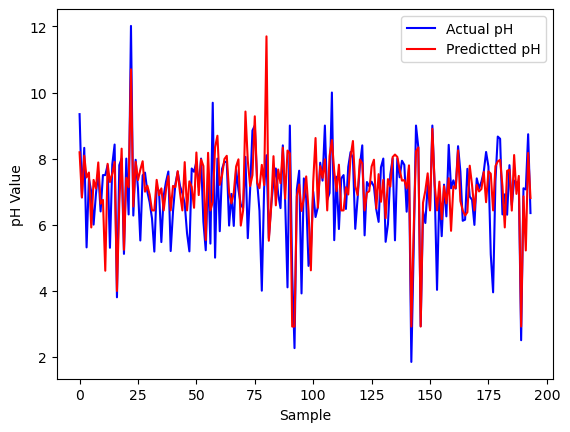

In [451]:
plt.plot(range(len(y_val)),y_val,'b',label='Actual pH')
plt.plot(range(len(yhat_pred)),yhat_pred,'r',label='Predictted pH')
plt.legend(loc='best')
plt.xlabel('Sample')
plt.ylabel('pH Value');

In [452]:
diff_pH = yhat_pred.flatten() - y_val

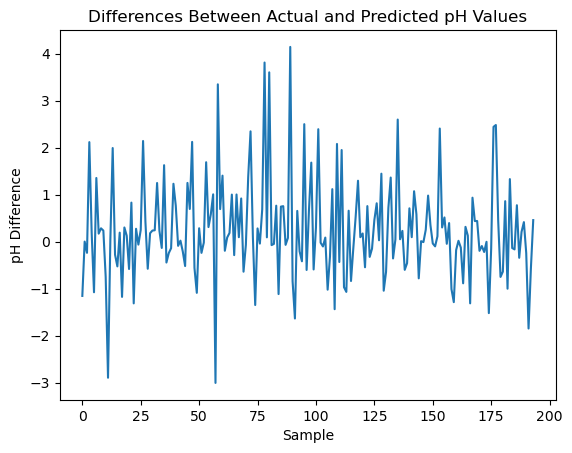

In [453]:
plt.plot(range(len(diff_pH)),diff_pH)
plt.title('Differences Between Actual and Predicted pH Values')
plt.xlabel('Sample')
plt.ylabel('pH Difference');

#### DUMPING NEEDED MODELS AND PREPROCCESSORS

In [454]:
# import joblib

##### Dumping for pH

In [455]:
# joblib.dump(xgb_pH_model,'pH_model.sav')

##### Dumping for DO

In [456]:
# joblib.dump(random_forest_do_model,'do_model.sav')

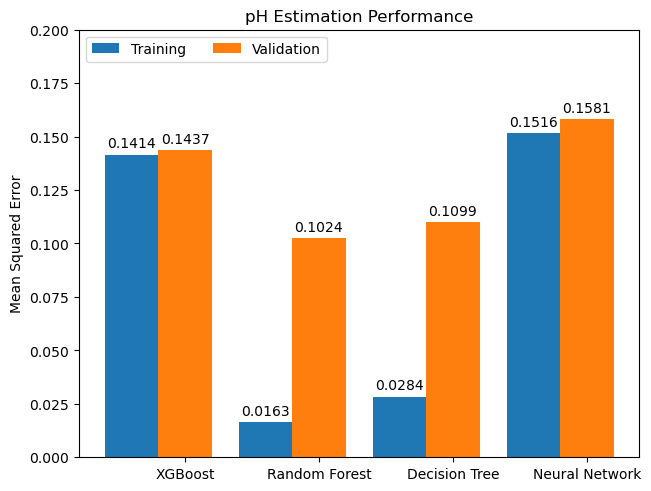

In [225]:
# pH plot
algorithms = {"Decision Tree", "Random Forest", "XGBoost", "Neural Network"}

mserrors = {
    'Training': (0.1414, 0.0163, 0.0284, 0.1516),
    'Validation': (0.1437, 0.1024, 0.1099, 0.1581)
}

x = np.arange(len(algorithms))
width = 0.4
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for dataset, err in mserrors.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, err, width, label=dataset)
    ax.bar_label(rects, padding=3)
    multiplier += 1
    
ax.set_ylabel('Mean Squared Error')
ax.set_title('pH Estimation Performance')
ax.set_xticks(x + width, algorithms)
ax.legend(loc='upper left', ncols=2)
ax.set_ylim(0, 0.2)

plt.show()

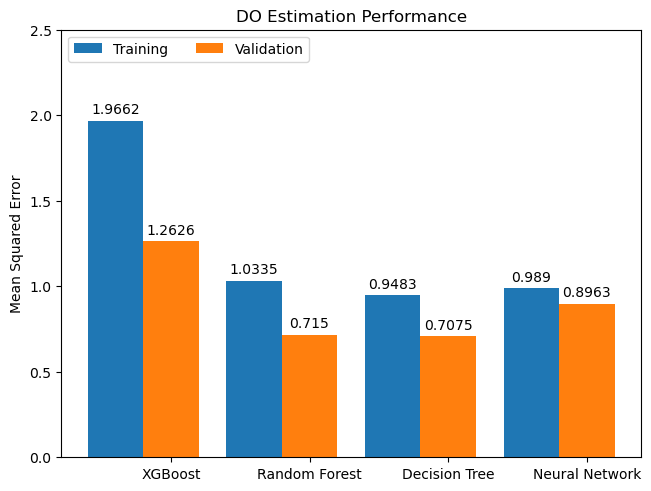

In [228]:
# DO plot
algorithms = {"Decision Tree", "Random Forest", "XGBoost", "Neural Network"}

mserrors = {
    'Training': (1.9662, 1.0335, 0.9483, 0.9890),
    'Validation': (1.2626, 0.7150, 0.7075, 0.8963)
}

x = np.arange(len(algorithms))
width = 0.4
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for dataset, err in mserrors.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, err, width, label=dataset)
    ax.bar_label(rects, padding=3)
    multiplier += 1
    
ax.set_ylabel('Mean Squared Error')
ax.set_title('DO Estimation Performance')
ax.set_xticks(x + width, algorithms)
ax.legend(loc='upper left', ncols=2)
ax.set_ylim(0, 2.5)

plt.show()